In [15]:
'''-----------DEFINE FOLDER, LOAD DATA--------------------'''
import os
import pandas as pd

#Define path
desktop_path = os.path.join(os.path.expanduser("~"), "Desktop")
final_project_folder = os.path.join(desktop_path, "Final Project")

#Ensure folder exist
if not os.path.exists(final_project_folder):
    raise FileNotFoundError(f"The folder '{final_project_folder}' does not exist.")
print (f"Using folder: {final_project_folder}")

#Define file paths
files = {
    "capital_called": "Capital Called Annually.xlsx",
    "dry_powder": "Dry Powder Annually.xlsx",
    "exit_deals": "Exit Deal Quarterly.xlsx",
    "fundraising": "Fundraising Quarterly.xlsx",
    "interest_rate": "Interest rate.xls",
    "lbo_data": "LBO Quarterly Data.xlsx",
    "sbo_data": "SBO Quarterly.xlsx",
    "industry_files": [
        "SBO Business Service.xlsx", "SBO Consumer Discretionary.xlsx",
        "SBO Energy.xlsx", "SBO Financial Service.xlsx", "SBO Healthcare.xlsx",
        "SBO Industrial.xlsx", "SBO IT.xlsx", "SBO Raw Materials.xlsx",
        "SBO Telecom.xlsx"
    ]
}

#Load datasets into a dictionary
datasets = {}
datasets['capital_called'] = pd.read_excel(os.path.join(final_project_folder, files["capital_called"]))
datasets['dry_powder'] = pd.read_excel(os.path.join(final_project_folder, files["dry_powder"]))
datasets['exit_deals'] = pd.read_excel(os.path.join(final_project_folder, files["exit_deals"]))
datasets['fundraising'] = pd.read_excel(os.path.join(final_project_folder, files["fundraising"]))
datasets['interest_rate'] = pd.read_excel(os.path.join(final_project_folder, files["interest_rate"]))
datasets['lbo_data'] = pd.read_excel(os.path.join(final_project_folder, files["lbo_data"]))
datasets['sbo_data'] = pd.read_excel(os.path.join(final_project_folder, files["sbo_data"]))

industry_sbo_data = {}
for file in files["industry_files"]:
    industry_name = file.split(" ")[1].lower()  # Extract industry name
    industry_sbo_data[industry_name] = pd.read_excel(os.path.join(final_project_folder, file))

print("Data Loaded:")
for key, df in datasets.items():
    print(f"{key.capitalize()} Data: {df.shape}")
for industry, df in industry_sbo_data.items():
    print(f"{industry.capitalize()} SBO Data: {df.shape}")

Using folder: /Users/phuongpham/Desktop/Final Project
Data Loaded:
Capital_called Data: (12, 4)
Dry_powder Data: (13, 3)
Exit_deals Data: (44, 13)
Fundraising Data: (50, 4)
Interest_rate Data: (51, 2)
Lbo_data Data: (44, 5)
Sbo_data Data: (44, 5)
Business SBO Data: (44, 5)
Consumer SBO Data: (44, 5)
Energy.xlsx SBO Data: (44, 5)
Financial SBO Data: (44, 5)
Healthcare.xlsx SBO Data: (44, 5)
Industrial.xlsx SBO Data: (44, 5)
It.xlsx SBO Data: (44, 5)
Raw SBO Data: (44, 5)
Telecom.xlsx SBO Data: (44, 5)


In [35]:
'''--------------Merge Industry----------------'''
import pandas as pd
import os

# Define the folder path
desktop_path = os.path.join(os.path.expanduser("~"), 'Desktop')
final_project_folder = os.path.join(desktop_path, 'Final Project')

if not os.path.exists(final_project_folder):
    raise FileNotFoundError(f"The folder '{final_project_folder}' does not exist. Please check the path.")

industry_files = {
    "SBO Business Service.xlsx": "Business Services",
    "SBO Consumer Discretionary.xlsx": "Consumer Discretionary",
    "SBO Energy.xlsx": "Energy & Utilities",
    "SBO Financial Service.xlsx": "Financial & Insurance Services",
    "SBO Healthcare.xlsx": "Healthcare",
    "SBO Industrial.xlsx": "Industrials",
    "SBO IT.xlsx": "Information Technology",
    "SBO Raw Materials.xlsx": "Raw Materials & Natural Resources",
    "SBO Telecom.xlsx": "Telecoms & Media"
}

# Function to merge industry-specific files into one DataFrame and save to Excel
def merge_industry_files_simple(folder_path, industry_files, output_file):
    merged_data = pd.DataFrame()  # Initialize an empty DataFrame

    for file, industry_name in industry_files.items():
        print(f"Processing industry file: {file} (Industry: {industry_name})")

        file_path = os.path.join(folder_path, file)
        df = pd.read_excel(file_path) 

        # Add an 'Industry' column with the full name
        df['Industry'] = industry_name

        # Append to the merged DataFrame
        merged_data = pd.concat([merged_data, df], ignore_index=True)

    # Save the merged data to an Excel file
    output_path = os.path.join(folder_path, output_file)
    print(f"Saving merged industry data to: {output_path}")
    merged_data.to_excel(output_path, index=False)
    print(f"Merged file saved successfully at: {output_path}")

    return merged_data

# Define the output file name
output_file_name = "Merged_Industry_SBO_Simple.xlsx"

merged_industry_sbo = merge_industry_files_simple(final_project_folder, industry_files, output_file_name)

print("Merged Industry SBO Data:")
print(merged_industry_sbo.head())
print(f"Total Rows: {len(merged_industry_sbo)}, Total Columns: {len(merged_industry_sbo.columns)}")


Processing industry file: SBO Business Service.xlsx (Industry: Business Services)
Processing industry file: SBO Consumer Discretionary.xlsx (Industry: Consumer Discretionary)
Processing industry file: SBO Energy.xlsx (Industry: Energy & Utilities)
Processing industry file: SBO Financial Service.xlsx (Industry: Financial & Insurance Services)
Processing industry file: SBO Healthcare.xlsx (Industry: Healthcare)
Processing industry file: SBO Industrial.xlsx (Industry: Industrials)
Processing industry file: SBO IT.xlsx (Industry: Information Technology)
Processing industry file: SBO Raw Materials.xlsx (Industry: Raw Materials & Natural Resources)
Processing industry file: SBO Telecom.xlsx (Industry: Telecoms & Media)
Saving merged industry data to: /Users/phuongpham/Desktop/Final Project/Merged_Industry_SBO_Simple.xlsx
Merged file saved successfully at: /Users/phuongpham/Desktop/Final Project/Merged_Industry_SBO_Simple.xlsx
Merged Industry SBO Data:
      DATE  NUMBER OF DEALS (aggregated)

In [37]:
'''-------------Normalize Annual to Quarter--------------'''
import pandas as pd
import os

# Define the folder path
desktop_path = os.path.join(os.path.expanduser("~"), 'Desktop')
final_project_folder = os.path.join(desktop_path, 'Final Project')

annual_files = {
    "Capital Called Annually.xlsx": "Capital Called",
    "Dry Powder Annually.xlsx": "Dry Powder"
}

def process_capital_called(df):
    # Convert DATE to datetime, handling both "YYYY" and "Mar-24" formats
    df['DATE'] = pd.to_datetime(df['DATE'], errors='coerce', format='%b-%y').fillna(
        pd.to_datetime(df['DATE'], errors='coerce', format='%Y')
    )

    # Separate rows with full years and specific quarters
    annual_data = df[df['DATE'].dt.month.isna()]  # Rows with just the year
    quarterly_data = df[df['DATE'].dt.month.notna()]  # Rows with specific quarters

    # Convert annual data to quarterly
    quarterly_from_annual = []
    for _, row in annual_data.iterrows():
        year = row['DATE'].year
        for quarter in range(1, 5):
            quarterly_from_annual.append({
                'DATE': f"{year}-Q{quarter}",
                'CALLED UP': row['CALLED UP'] / 4,
                'DISTRIBUTED': row['DISTRIBUTED'] / 4,
                'NET CAPITAL DISTRIBUTED': row['NET CAPITAL DISTRIBUTED'] / 4
            })

    # Create a DataFrame for converted quarterly data
    quarterly_from_annual_df = pd.DataFrame(quarterly_from_annual)

    # Combine converted and existing quarterly data
    combined_quarterly = pd.concat([quarterly_from_annual_df, quarterly_data], ignore_index=True)

    return combined_quarterly

# Function to process Dry Powder data
def process_dry_powder(df):
    df['DATE'] = pd.to_datetime(df['DATE'], errors='coerce', format='%b-%y')

    quarterly_from_annual = []
    for _, row in df.iterrows():
        year = row['DATE'].year
        for quarter in range(1, 5):
            quarterly_from_annual.append({
                'DATE': f"{year}-Q{quarter}",
                'TOTAL': row['TOTAL'] / 4,
                'NORTH AMERICA': row['NORTH AMERICA'] / 4
            })

    # Create a DataFrame for converted quarterly data
    quarterly_from_annual_df = pd.DataFrame(quarterly_from_annual)

    return quarterly_from_annual_df

# Process and save files
def process_and_save_annual_files(folder_path, annual_files, output_folder):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)  # Ensure output folder exists

    for file, label in annual_files.items():
        print(f"Processing file: {file} (Data Type: {label})")

        # Load the file
        file_path = os.path.join(folder_path, file)
        df = pd.read_excel(file_path)

        # Process the data based on its type
        if label == "Capital Called":
            quarterly_data = process_capital_called(df)
        elif label == "Dry Powder":
            quarterly_data = process_dry_powder(df)
        else:
            raise ValueError(f"Unknown label: {label}")

        # Save the quarterly data
        output_file = os.path.join(output_folder, f"{label} Quarterly.xlsx")
        print(f"Saving quarterly data to: {output_file}")
        quarterly_data.to_excel(output_file, index=False)
        print(f"Quarterly data saved successfully: {output_file}")

# Define output folder
output_folder = os.path.join(desktop_path, 'Final Project', 'Quarterly Files')

# Process the files
process_and_save_annual_files(final_project_folder, annual_files, output_folder)


Processing file: Capital Called Annually.xlsx (Data Type: Capital Called)
Saving quarterly data to: /Users/phuongpham/Desktop/Final Project/Quarterly Files/Capital Called Quarterly.xlsx
Quarterly data saved successfully: /Users/phuongpham/Desktop/Final Project/Quarterly Files/Capital Called Quarterly.xlsx
Processing file: Dry Powder Annually.xlsx (Data Type: Dry Powder)
Saving quarterly data to: /Users/phuongpham/Desktop/Final Project/Quarterly Files/Dry Powder Quarterly.xlsx
Quarterly data saved successfully: /Users/phuongpham/Desktop/Final Project/Quarterly Files/Dry Powder Quarterly.xlsx


In [86]:
'''--------------Merge Sorted Data---------------------'''
import pandas as pd
import os

# Define the desktop path and project folder
desktop_path = os.path.join(os.path.expanduser("~"), 'Desktop')
final_project_folder = os.path.join(desktop_path, 'Final Project')

# Load all relevant files
dry_powder = pd.read_excel(os.path.join(final_project_folder, 'Dry Powder Quarterly.xlsx'))
lbo_data = pd.read_excel(os.path.join(final_project_folder, 'LBO Quarterly Data.xlsx'))
sbo_data = pd.read_excel(os.path.join(final_project_folder, 'SBO Quarterly.xlsx'))
exit_data = pd.read_excel(os.path.join(final_project_folder, 'Exit Deal Quarterly.xlsx'))
interest_rate = pd.read_excel(os.path.join(final_project_folder, 'Interest rate.xls'))
fundraising = pd.read_excel(os.path.join(final_project_folder, 'Fundraising Quarterly.xlsx'))

# Add a prefix to distinguish each dataset
def label_columns(df, label):
    """Add a label prefix to column names, except 'DATE'."""
    return df.rename(columns=lambda col: f"{label} ({col})" if col != 'DATE' else col)

dry_powder = label_columns(dry_powder, "Dry Powder")
lbo_data = label_columns(lbo_data, "LBO Data")
sbo_data = label_columns(sbo_data, "SBO Data")
exit_data = label_columns(exit_data, "Exit Data")
interest_rate = label_columns(interest_rate, "Interest Rate")
fundraising = label_columns(fundraising, "Fundraising")

# Merge all datasets on the DATE column
merged_data = (dry_powder
               .merge(lbo_data, on='DATE', how='outer')
               .merge(sbo_data, on='DATE', how='outer')
               .merge(exit_data, on='DATE', how='outer')
               .merge(interest_rate, on='DATE', how='outer')
               .merge(fundraising, on='DATE', how='outer'))

merged_data.replace("-", 0, inplace=True)
merged_data.fillna(0, inplace=True)

numeric_cols = merged_data.columns.difference(['DATE'])
merged_data[numeric_cols] = merged_data[numeric_cols].apply(pd.to_numeric, errors='coerce')

def clean_date_format(date):
    try:
        quarter, year = date.split(" ")
        quarter_number = {"Q4": 4, "Q3": 3, "Q2": 2, "Q1": 1}[quarter]
        return f"{quarter} {year}"  
    except Exception:
        return None  

# Apply the cleaning function
merged_data['DATE'] = merged_data['DATE'].astype(str).apply(clean_date_format)

# Drop rows with invalid dates
merged_data = merged_data.dropna(subset=['DATE'])

def custom_date_sort(date):
    """Custom function to sort QX YYYY format."""
    quarter, year = date.split(" ")
    quarter_number = {"Q4": 4, "Q3": 3, "Q2": 2, "Q1": 1}[quarter]
    return int(year) * 10 + quarter_number  # Sorting key: Year * 10 + Quarter

merged_data['SortKey'] = merged_data['DATE'].apply(custom_date_sort)
merged_data = merged_data.sort_values(by='SortKey', ascending=False).drop(columns=['SortKey'])

# Save the merged data to an Excel file
output_file = os.path.join(final_project_folder, 'Merged_Data_Sorted_Cleaned.xlsx')
merged_data.to_excel(output_file, index=False)

print(f"Merged, cleaned, and sorted data saved to: {output_file}")


Merged, cleaned, and sorted data saved to: /Users/phuongpham/Desktop/Final Project/Merged_Data_Sorted_Cleaned.xlsx


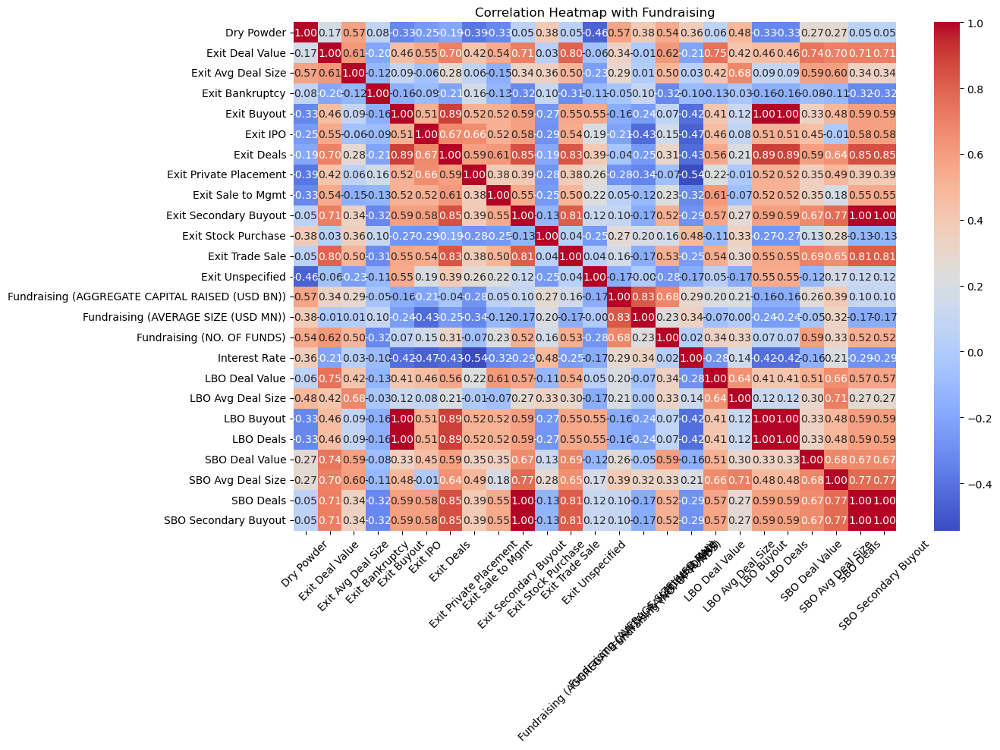

In [99]:
'''------------------PRESENT CORRELATION MATRIX THROUGH HEATMAP----------------------------'''
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Define the path to the merged file
desktop_path = os.path.join(os.path.expanduser("~"), 'Desktop')
final_project_folder = os.path.join(desktop_path, 'Final Project')
merged_file_path = os.path.join(final_project_folder, 'Merged_Data_Sorted_Cleaned.xlsx')

try:
    merged_data = pd.read_excel(merged_file_path)
except FileNotFoundError:
    print(f"File not found: {merged_file_path}")
    print("Please ensure the file exists and the path is correct.")
    raise

merged_data.replace("-", 0, inplace=True)
merged_data.fillna(0, inplace=True)

numeric_cols = merged_data.columns.difference(['DATE'])
merged_data[numeric_cols] = merged_data[numeric_cols].apply(pd.to_numeric, errors='coerce')

# Shorten column names for readability, including Fundraising data
rename_mapping = {
    'Dry Powder (NORTH AMERICA)': 'Dry Powder',
    'LBO Data (NUMBER OF DEALS (aggregated))': 'LBO Deals',
    'LBO Data (AGGREGATE DEAL VALUE (USD Bn))': 'LBO Deal Value',
    'LBO Data (AVERAGE DEAL SIZE (USD Mn))': 'LBO Avg Deal Size',
    'LBO Data (BUYOUT)': 'LBO Buyout',
    'SBO Data (NUMBER OF DEALS (aggregated))': 'SBO Deals',
    'SBO Data (AGGREGATE DEAL VALUE (USD Bn))': 'SBO Deal Value',
    'SBO Data (AVERAGE DEAL SIZE (USD Mn))': 'SBO Avg Deal Size',
    'SBO Data (SECONDARY BUYOUT)': 'SBO Secondary Buyout',
    'Exit Data (NUMBER OF DEALS (aggregated))': 'Exit Deals',
    'Exit Data (AGGREGATE DEAL VALUE (USD Bn))': 'Exit Deal Value',
    'Exit Data (AVERAGE DEAL SIZE (USD Mn))': 'Exit Avg Deal Size',
    'Exit Data (BANKRUPTCY/WRITE-OFF)': 'Exit Bankruptcy',
    'Exit Data (BUYOUT)': 'Exit Buyout',
    'Exit Data (IPO)': 'Exit IPO',
    'Exit Data (PRIVATE PLACEMENT/FOLLOW ON)': 'Exit Private Placement',
    'Exit Data (SALE TO MANAGEMENT)': 'Exit Sale to Mgmt',
    'Exit Data (SECONDARY BUYOUT)': 'Exit Secondary Buyout',
    'Exit Data (SECONDARY STOCK PURCHASE)': 'Exit Stock Purchase',
    'Exit Data (TRADE SALE)': 'Exit Trade Sale',
    'Exit Data (UNSPECIFIED EXIT)': 'Exit Unspecified',
    'Interest Rate (Rate)': 'Interest Rate',
    'Fundraising (TOTAL CAPITAL RAISED)': 'Total Fundraising',
    'Fundraising (NUMBER OF FUNDS)': 'Fundraising Funds',
    'Fundraising (AVERAGE SIZE (USD Mn))': 'Fundraising Avg Size'
}

merged_data.rename(columns=rename_mapping, inplace=True)

# Compute the correlation matrix
shortened_numeric_cols = [rename_mapping[col] if col in rename_mapping else col for col in numeric_cols]
correlation_matrix = merged_data[shortened_numeric_cols].corr()

# Plot the correlation heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlation Heatmap with Fundraising")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Modeling Exit Data (IPO)...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.33805D+00    |proj g|=  4.63505D-01

At iterate    5    f=  2.23953D+00    |proj g|=  5.44473D-01

At iterate   10    f=  2.17450D+00    |proj g|=  5.49988D-02

At iterate   15    f=  2.16884D+00    |proj g|=  9.77453D-02

At iterate   20    f=  2.15423D+00    |proj g|=  6.69503D-02

At iterate   25    f=  2.14722D+00    |proj g|=  1.63889D-01

At iterate   30    f=  2.14319D+00    |proj g|=  1.45627D+00

At iterate   35    f=  2.14071D+00    |proj g|=  1.31859D-01

At iterate   40    f=  2.13327D+00    |proj g|=  7.83569D-01

At iterate   45    f=  2.11532D+00    |proj g|=  1.03816D+00

At iterate   50    f=  2.09695D+00    |proj g|=  1.24995D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of 

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

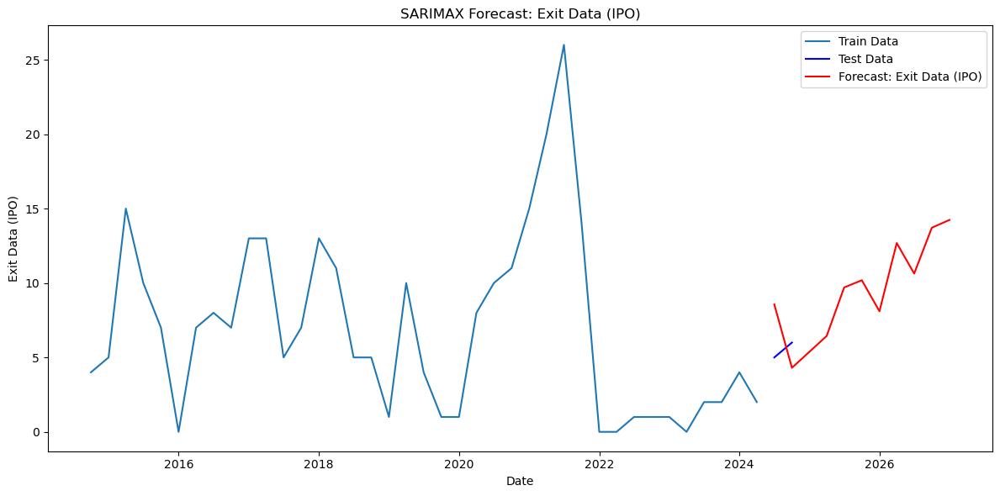

                                     SARIMAX Results                                     
Dep. Variable:                   Exit Data (IPO)   No. Observations:                   40
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 4)   Log Likelihood                 -83.878
Date:                           Wed, 04 Dec 2024   AIC                            187.756
Time:                                   15:26:23   BIC                            201.429
Sample:                                        0   HQIC                           192.038
                                            - 40                                         
Covariance Type:                             opg                                         
                                                      coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------
Dry Powder (NORTH AMERICA)                      

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

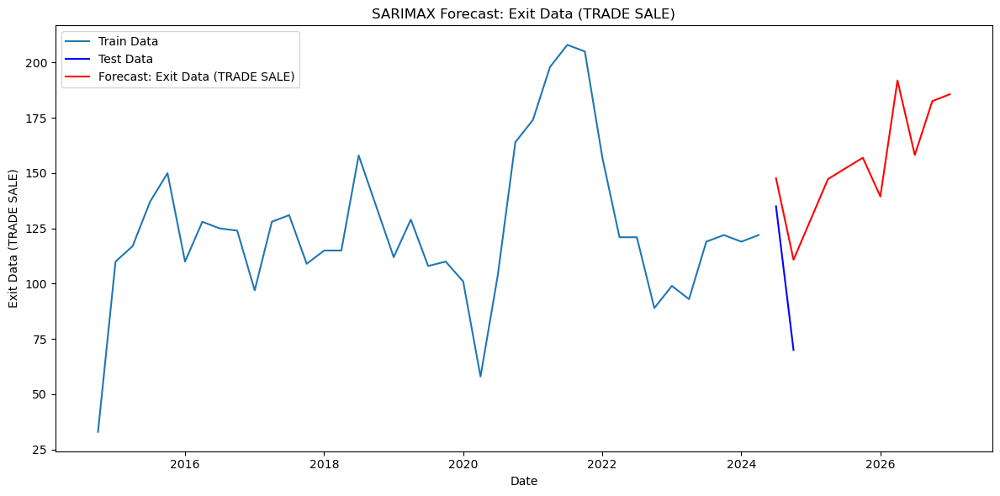

                                     SARIMAX Results                                     
Dep. Variable:            Exit Data (TRADE SALE)   No. Observations:                   40
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 4)   Log Likelihood                -118.473
Date:                           Wed, 04 Dec 2024   AIC                            256.945
Time:                                   15:26:23   BIC                            270.618
Sample:                                        0   HQIC                           261.227
                                            - 40                                         
Covariance Type:                             opg                                         
                                                      coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------
Dry Powder (NORTH AMERICA)                      

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
      

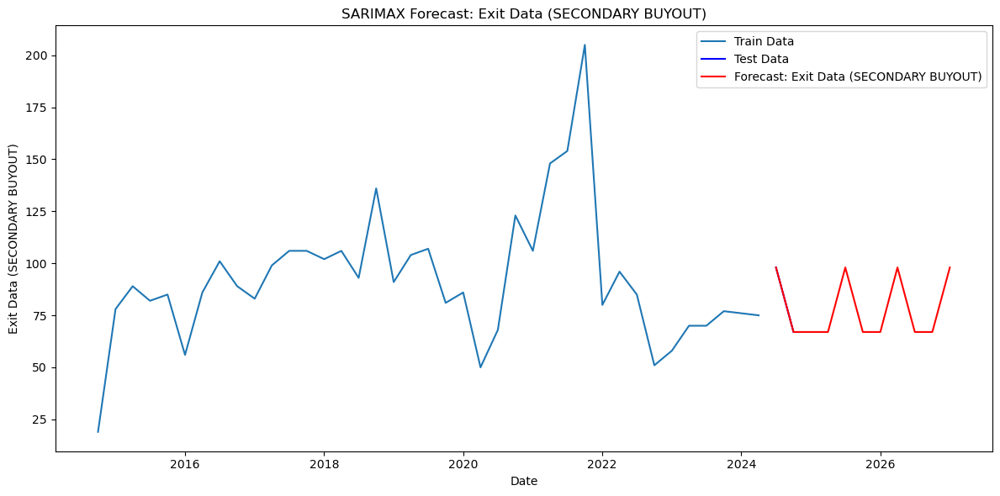

                                     SARIMAX Results                                     
Dep. Variable:      Exit Data (SECONDARY BUYOUT)   No. Observations:                   40
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 4)   Log Likelihood                 307.653
Date:                           Wed, 04 Dec 2024   AIC                           -595.307
Time:                                   15:26:24   BIC                           -581.634
Sample:                                        0   HQIC                          -591.025
                                            - 40                                         
Covariance Type:                             opg                                         
                                                      coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------
Dry Powder (NORTH AMERICA)                      

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

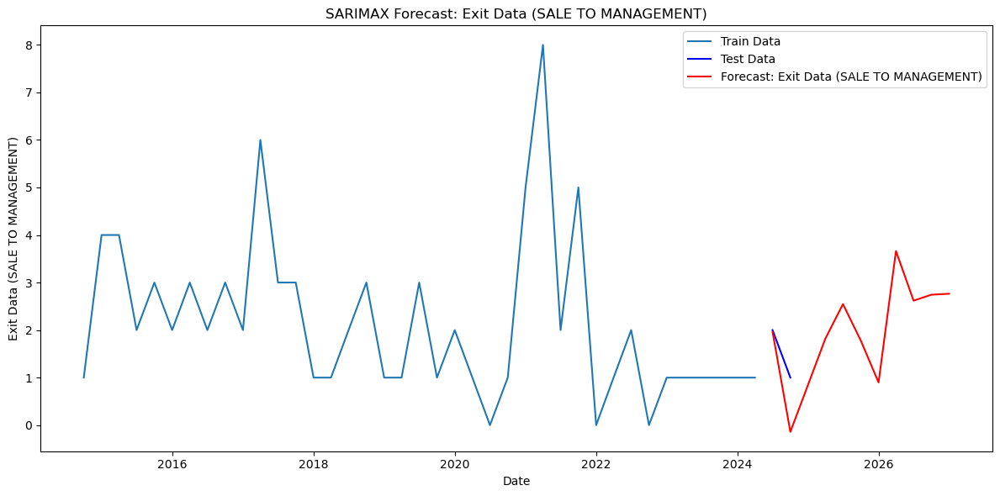

                                     SARIMAX Results                                      
Dep. Variable:     Exit Data (SALE TO MANAGEMENT)   No. Observations:                   40
Model:              SARIMAX(1, 1, 1)x(1, 1, 1, 4)   Log Likelihood                 -49.949
Date:                            Wed, 04 Dec 2024   AIC                            119.898
Time:                                    15:26:24   BIC                            133.571
Sample:                                         0   HQIC                           124.181
                                             - 40                                         
Covariance Type:                              opg                                         
                                                      coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------
Dry Powder (NORTH AMERICA)              

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

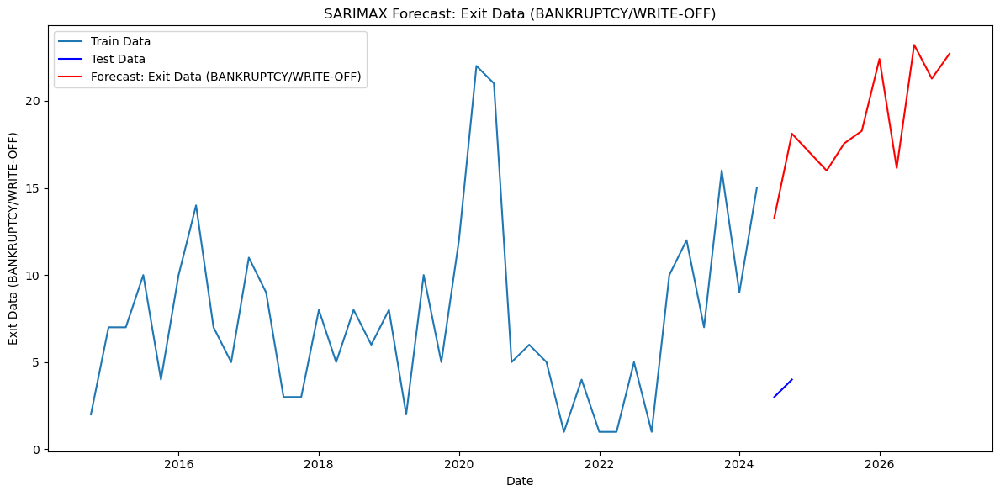

                                      SARIMAX Results                                       
Dep. Variable:     Exit Data (BANKRUPTCY/WRITE-OFF)   No. Observations:                   40
Model:                SARIMAX(1, 1, 1)x(1, 1, 1, 4)   Log Likelihood                 -89.758
Date:                              Wed, 04 Dec 2024   AIC                            199.515
Time:                                      15:26:24   BIC                            213.188
Sample:                                           0   HQIC                           203.797
                                               - 40                                         
Covariance Type:                                opg                                         
                                                      coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------
Dry Powder (NORTH AMERIC

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

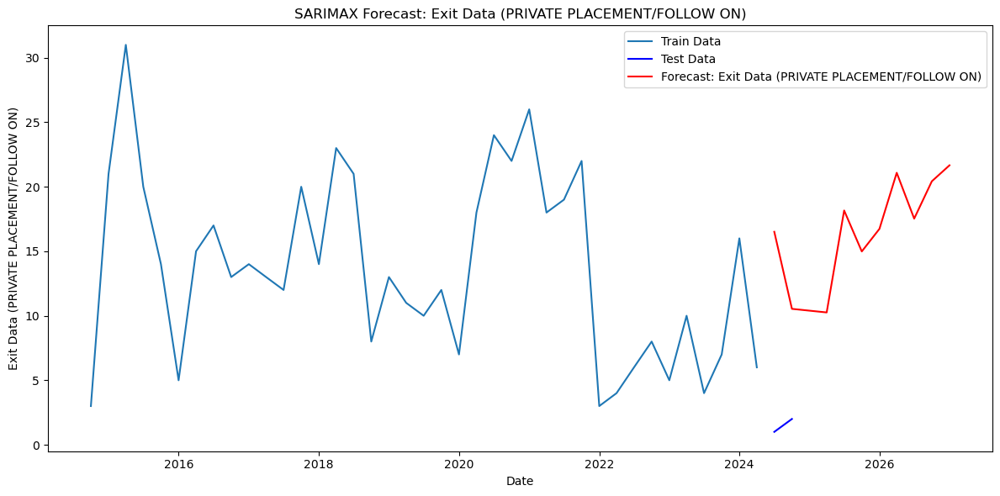

                                          SARIMAX Results                                          
Dep. Variable:     Exit Data (PRIVATE PLACEMENT/FOLLOW ON)   No. Observations:                   40
Model:                       SARIMAX(1, 1, 1)x(1, 1, 1, 4)   Log Likelihood                 -89.027
Date:                                     Wed, 04 Dec 2024   AIC                            198.054
Time:                                             15:26:25   BIC                            211.727
Sample:                                                  0   HQIC                           202.336
                                                      - 40                                         
Covariance Type:                                       opg                                         
                                                      coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

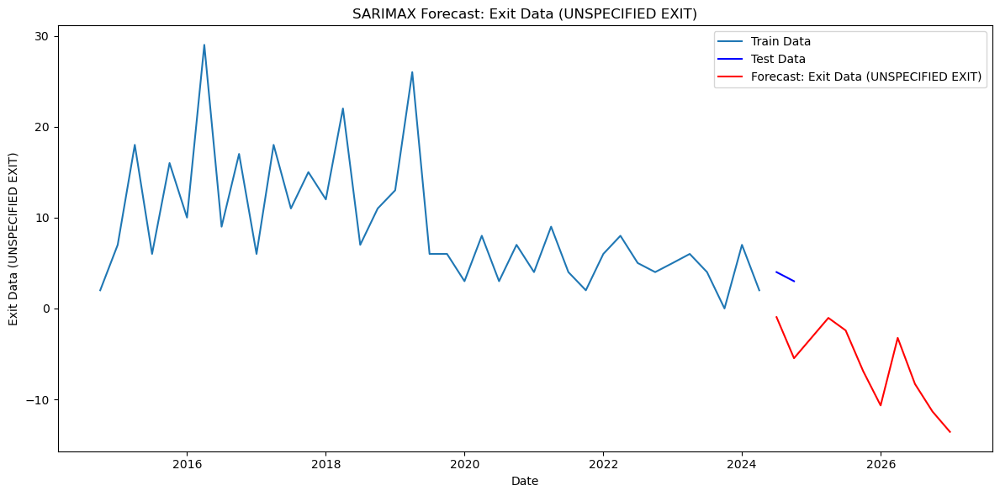

                                     SARIMAX Results                                     
Dep. Variable:      Exit Data (UNSPECIFIED EXIT)   No. Observations:                   40
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 4)   Log Likelihood                 -78.703
Date:                           Wed, 04 Dec 2024   AIC                            177.406
Time:                                   15:26:25   BIC                            191.079
Sample:                                        0   HQIC                           181.688
                                            - 40                                         
Covariance Type:                             opg                                         
                                                      coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------
Dry Powder (NORTH AMERICA)                      

In [104]:
'''-------------------SARIMAX EXIT STRATEGIES-------------------------'''
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
import matplotlib.pyplot as plt
import os

# Define paths
desktop_path = os.path.join(os.path.expanduser("~"), 'Desktop')
final_project_folder = os.path.join(desktop_path, 'Final Project')
merged_file_path = os.path.join(final_project_folder, 'Merged_Data_Sorted_Cleaned.xlsx')

# Load the merged data
data = pd.read_excel(merged_file_path)

def convert_quarter_to_datetime(quarter):
    year = int(quarter.split(' ')[1])
    quarter_num = int(quarter.split(' ')[0][-1])
    month = {1: 1, 2: 4, 3: 7, 4: 10}[quarter_num]  # Map Q1-Q4 to the first month of the quarter
    return pd.Timestamp(year=year, month=month, day=1)

data['DATE'] = data['DATE'].apply(convert_quarter_to_datetime)
data.set_index('DATE', inplace=True)
data = data.sort_index()

# Define exit strategies and exogenous variables
exit_strategies = [
    'Exit Data (IPO)',
    'Exit Data (TRADE SALE)',
    'Exit Data (SECONDARY BUYOUT)',
    'Exit Data (SALE TO MANAGEMENT)',
    'Exit Data (BANKRUPTCY/WRITE-OFF)',
    'Exit Data (PRIVATE PLACEMENT/FOLLOW ON)',
    'Exit Data (UNSPECIFIED EXIT)'
]

exogenous_variables = [
    'Dry Powder (NORTH AMERICA)',
    'Fundraising (AGGREGATE CAPITAL RAISED (USD BN))',
    'Interest Rate (Rate)',
    'LBO Data (NUMBER OF DEALS (aggregated))',
    'SBO Data (NUMBER OF DEALS (aggregated))'
]

data = data[exit_strategies + exogenous_variables].dropna()

# Train-Test Split
train = data.loc[:'2024-06-30']
test = data.loc['2024-07-01':]

# Predict for each exit strategy
predictions = {}
for strategy in exit_strategies:
    print(f"Modeling {strategy}...")
    # SARIMAX Model
    model = SARIMAX(train[strategy],
                    exog=train[exogenous_variables],
                    order=(1, 1, 1),
                    seasonal_order=(1, 1, 1, 4),
                    enforce_stationarity=False,
                    enforce_invertibility=False)
    sarimax_results = model.fit()

    # Forecast for the next 8 quarters (2025-2026)
    future_steps = 8
    latest_exog = test[exogenous_variables].iloc[-1:]  
    future_exog = pd.concat([test[exogenous_variables], latest_exog] * future_steps, ignore_index=True).iloc[:len(test) + future_steps]

    forecast = sarimax_results.get_forecast(steps=len(test) + future_steps, exog=future_exog)
    forecast_values = forecast.predicted_mean

    # Create a timeline for future quarters
    future_dates = pd.date_range(start=test.index[-1], periods=future_steps + 1, freq='Q')[1:]
    forecast_values.index = test.index.union(future_dates)

    # Store results
    predictions[strategy] = forecast_values

    # Plot Results
    plt.figure(figsize=(12, 6))
    plt.plot(train[strategy], label="Train Data")
    plt.plot(test[strategy], label="Test Data", color='blue')
    plt.plot(forecast_values, label=f"Forecast: {strategy}", color='red')
    plt.title(f"SARIMAX Forecast: {strategy}")
    plt.xlabel("Date")
    plt.ylabel(strategy)
    plt.legend()
    plt.tight_layout()
    plt.show()

    print(sarimax_results.summary())


Modeling SBO Data (NUMBER OF DEALS (aggregated))...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.96373D+00    |proj g|=  2.49558D-01

At iterate    5    f=  2.87225D+00    |proj g|=  1.07850D-01

At iterate   10    f=  2.84531D+00    |proj g|=  1.25832D-01

At iterate   15    f=  2.84065D+00    |proj g|=  1.54839D-01

At iterate   20    f=  2.82597D+00    |proj g|=  2.71094D-01

At iterate   25    f=  2.78253D+00    |proj g|=  1.86222D-01

At iterate   30    f=  2.76073D+00    |proj g|=  1.27401D-01

At iterate   35    f=  2.74939D+00    |proj g|=  2.04866D-01

At iterate   40    f=  2.74399D+00    |proj g|=  1.49544D-01

At iterate   45    f=  2.73843D+00    |proj g|=  6.52510D-02

At iterate   50    f=  2.73762D+00    |proj g|=  1.09783D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations


/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

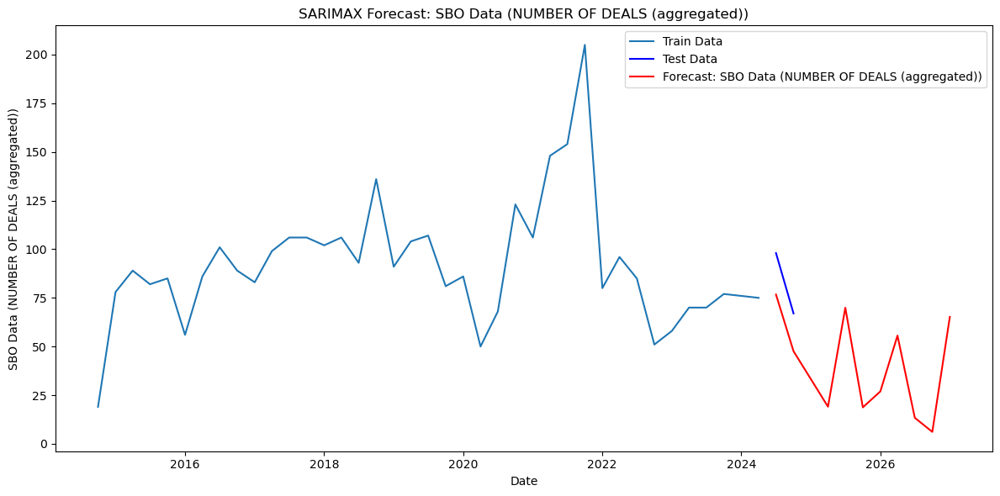

                                          SARIMAX Results                                          
Dep. Variable:     SBO Data (NUMBER OF DEALS (aggregated))   No. Observations:                   40
Model:                       SARIMAX(1, 1, 1)x(1, 1, 1, 4)   Log Likelihood                -109.505
Date:                                     Wed, 04 Dec 2024   AIC                            239.009
Time:                                             15:26:25   BIC                            252.682
Sample:                                                  0   HQIC                           243.292
                                                      - 40                                         
Covariance Type:                                       opg                                         
                                                      coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

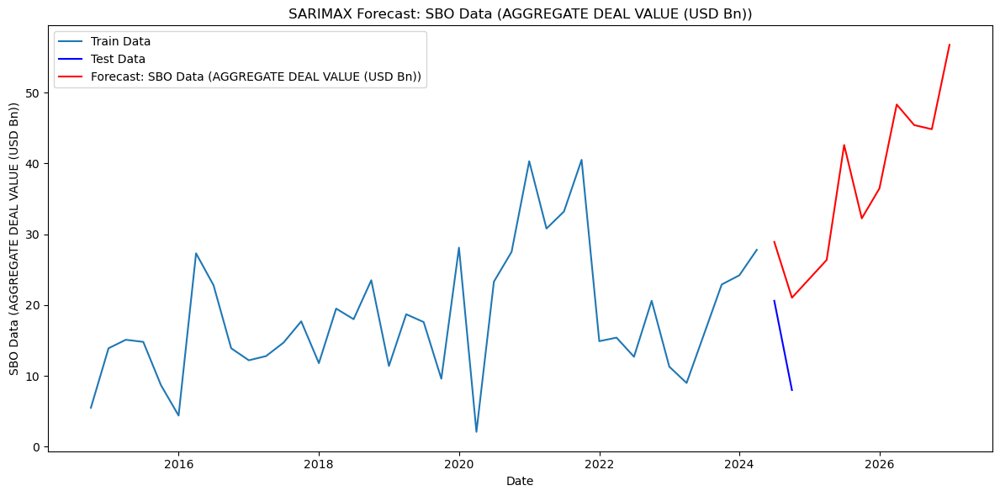

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                                          SARIMAX Results                                           
Dep. Variable:     SBO Data (AGGREGATE DEAL VALUE (USD Bn))   No. Observations:                   40
Model:                        SARIMAX(1, 1, 1)x(1, 1, 1, 4)   Log Likelihood                -100.270
Date:                                      Wed, 04 Dec 2024   AIC                            220.541
Time:                                              15:26:25   BIC                            234.214
Sample:                                                   0   HQIC                           224.823
                                                       - 40                                         
Covariance Type:                                        opg                                         
                                                      coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------

 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


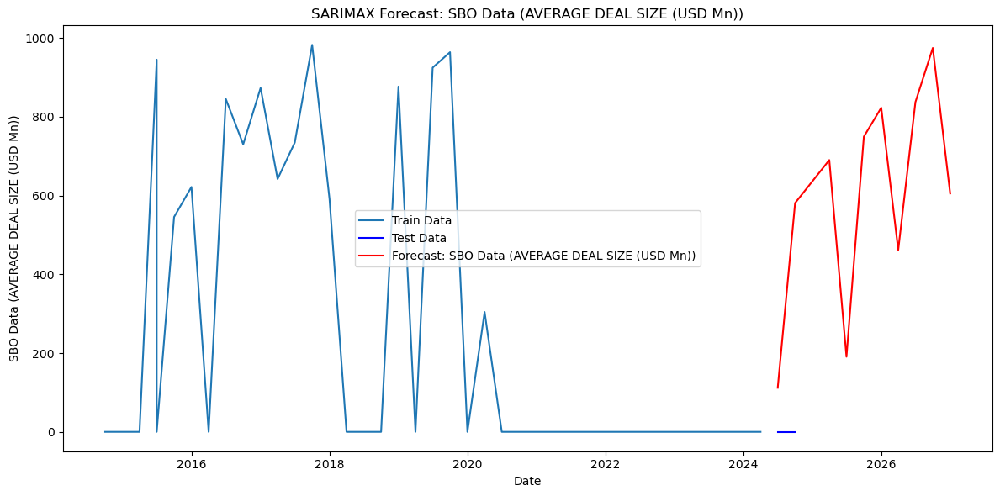

                                         SARIMAX Results                                         
Dep. Variable:     SBO Data (AVERAGE DEAL SIZE (USD Mn))   No. Observations:                   40
Model:                     SARIMAX(1, 1, 1)x(1, 1, 1, 4)   Log Likelihood                -210.761
Date:                                   Wed, 04 Dec 2024   AIC                            441.521
Time:                                           15:26:25   BIC                            455.194
Sample:                                                0   HQIC                           445.803
                                                    - 40                                         
Covariance Type:                                     opg                                         
                                                      coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.96373D+00    |proj g|=  2.49558D-01

At iterate    5    f=  2.87225D+00    |proj g|=  1.07850D-01

At iterate   10    f=  2.84531D+00    |proj g|=  1.25832D-01

At iterate   15    f=  2.84065D+00    |proj g|=  1.54839D-01

At iterate   20    f=  2.82597D+00    |proj g|=  2.71094D-01

At iterate   25    f=  2.78253D+00    |proj g|=  1.86222D-01

At iterate   30    f=  2.76073D+00    |proj g|=  1.27401D-01

At iterate   35    f=  2.74939D+00    |proj g|=  2.04866D-01

At iterate   40    f=  2.74399D+00    |proj g|=  1.49544D-01

At iterate   45    f=  2.73843D+00    |proj g|=  6.52510D-02

At iterate   50    f=  2.73762D+00    |proj g|=  1.09783D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


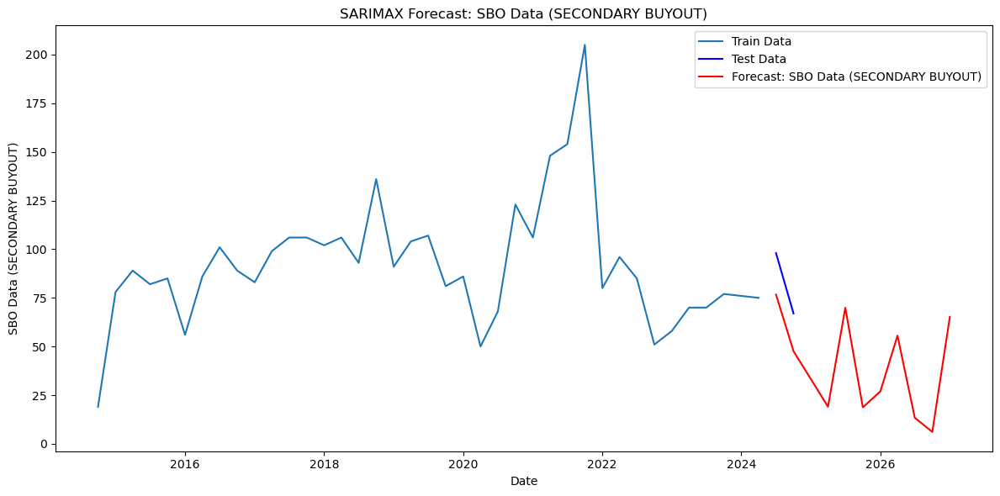

                                     SARIMAX Results                                     
Dep. Variable:       SBO Data (SECONDARY BUYOUT)   No. Observations:                   40
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 4)   Log Likelihood                -109.505
Date:                           Wed, 04 Dec 2024   AIC                            239.009
Time:                                   15:26:26   BIC                            252.682
Sample:                                        0   HQIC                           243.292
                                            - 40                                         
Covariance Type:                             opg                                         
                                                      coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------
Dry Powder (NORTH AMERICA)                      

In [105]:
'''---------------------SARIMAX SBO DEALS DATA-------------------------'''
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
import matplotlib.pyplot as plt
import os

# Define paths
desktop_path = os.path.join(os.path.expanduser("~"), 'Desktop')
final_project_folder = os.path.join(desktop_path, 'Final Project')
merged_file_path = os.path.join(final_project_folder, 'Merged_Data_Sorted_Cleaned.xlsx')

# Load the merged data
data = pd.read_excel(merged_file_path)

def convert_quarter_to_datetime(quarter):
    year = int(quarter.split(' ')[1])
    quarter_num = int(quarter.split(' ')[0][-1])
    month = {1: 1, 2: 4, 3: 7, 4: 10}[quarter_num] 
    return pd.Timestamp(year=year, month=month, day=1)

data['DATE'] = data['DATE'].apply(convert_quarter_to_datetime)
data.set_index('DATE', inplace=True)
data = data.sort_index()

# Define SBO-related targets and exogenous variables
sbo_targets = [
    'SBO Data (NUMBER OF DEALS (aggregated))',
    'SBO Data (AGGREGATE DEAL VALUE (USD Bn))',
    'SBO Data (AVERAGE DEAL SIZE (USD Mn))',
    'SBO Data (SECONDARY BUYOUT)'
]

exogenous_variables = [
    'Dry Powder (NORTH AMERICA)',
    'Fundraising (AGGREGATE CAPITAL RAISED (USD BN))',
    'Interest Rate (Rate)',
    'LBO Data (NUMBER OF DEALS (aggregated))',
    'Exit Data (NUMBER OF DEALS (aggregated))'
]

# Ensure all columns are numeric
numeric_cols = sbo_targets + exogenous_variables
data[numeric_cols] = data[numeric_cols].replace("-", pd.NA).apply(pd.to_numeric, errors='coerce')

# Handle missing values
data[numeric_cols] = data[numeric_cols].fillna(0)  
# Train-Test Split
train = data.loc[:'2024-06-30']
test = data.loc['2024-07-01':]

# Predict for each SBO target
predictions = {}
for target in sbo_targets:
    print(f"Modeling {target}...")
    # SARIMAX Model
    model = SARIMAX(train[target],
                    exog=train[exogenous_variables],
                    order=(1, 1, 1),
                    seasonal_order=(1, 1, 1, 4),
                    enforce_stationarity=False,
                    enforce_invertibility=False)
    sarimax_results = model.fit()

    # Forecast for the next 8 quarters (2025-2026)
    future_steps = 8
    latest_exog = test[exogenous_variables].iloc[-1:]  
    future_exog = pd.concat([test[exogenous_variables], latest_exog] * future_steps, ignore_index=True).iloc[:len(test) + future_steps]

    forecast = sarimax_results.get_forecast(steps=len(test) + future_steps, exog=future_exog)
    forecast_values = forecast.predicted_mean

    # Create a timeline for future quarters
    future_dates = pd.date_range(start=test.index[-1], periods=future_steps + 1, freq='Q')[1:]
    forecast_values.index = test.index.union(future_dates)

    # Store results
    predictions[target] = forecast_values

    # Plot Results
    plt.figure(figsize=(12, 6))
    plt.plot(train[target], label="Train Data")
    plt.plot(test[target], label="Test Data", color='blue')
    plt.plot(forecast_values, label=f"Forecast: {target}", color='red')
    plt.title(f"SARIMAX Forecast: {target}")
    plt.xlabel("Date")
    plt.ylabel(target)
    plt.legend()
    plt.tight_layout()
    plt.show()

    print(sarimax_results.summary())


Modeling for Industry: Telecoms & Media...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.64321D+00    |proj g|=  4.25882D+00

At iterate    5    f=  1.60160D+00    |proj g|=  5.48765D-01

At iterate   10    f=  1.54388D+00    |proj g|=  1.43458D+00

At iterate   15    f=  1.48429D+00    |proj g|=  1.02061D-01
  ys=-8.800E-02  -gs= 2.469E-03 BFGS update SKIPPED

At iterate   20    f=  1.43967D+00    |proj g|=  6.17935D-01

At iterate   25    f=  1.41881D+00    |proj g|=  7.11984D-01

At iterate   30    f=  1.38455D+00    |proj g|=  1.62109D-01

At iterate   35    f=  1.37733D+00    |proj g|=  1.62051D+00

At iterate   40    f=  1.33273D+00    |proj g|=  1.98355D+00

At iterate   45    f=  1.31541D+00    |proj g|=  1.36193D+00

At iterate   50    f=  1.28689D+00    |proj g|=  8.36060D+00

           * * *

Tit   = total number of iterations
Tn

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

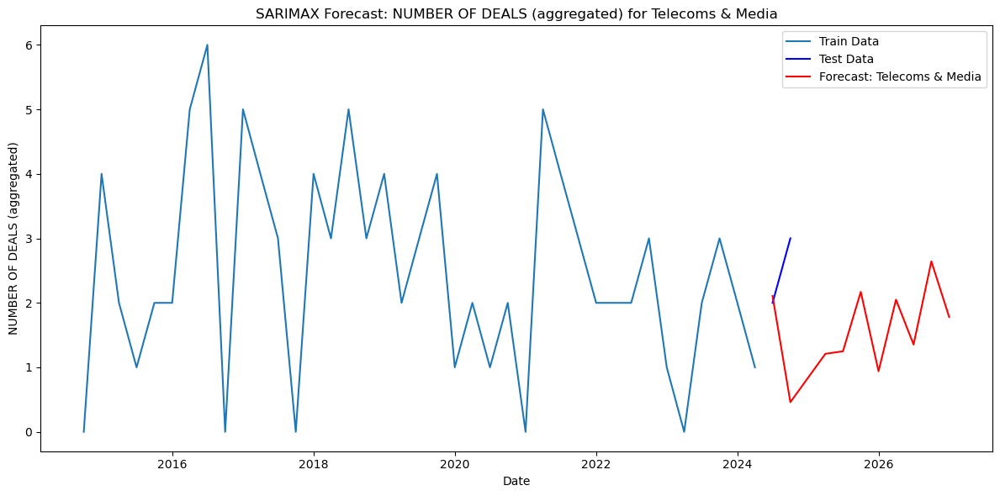

                                     SARIMAX Results                                     
Dep. Variable:      NUMBER OF DEALS (aggregated)   No. Observations:                   40
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 4)   Log Likelihood                 -51.476
Date:                           Wed, 04 Dec 2024   AIC                            122.951
Time:                                   15:31:07   BIC                            136.624
Sample:                                        0   HQIC                           127.233
                                            - 40                                         
Covariance Type:                             opg                                         
                                                      coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------
Dry Powder (NORTH AMERICA)                      

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

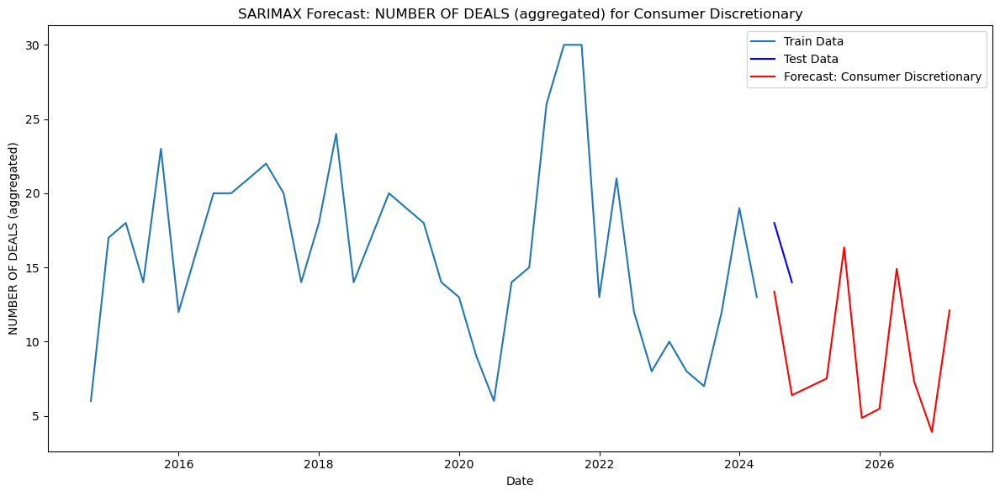

                                     SARIMAX Results                                     
Dep. Variable:      NUMBER OF DEALS (aggregated)   No. Observations:                   40
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 4)   Log Likelihood                 -83.216
Date:                           Wed, 04 Dec 2024   AIC                            186.433
Time:                                   15:31:07   BIC                            200.106
Sample:                                        0   HQIC                           190.715
                                            - 40                                         
Covariance Type:                             opg                                         
                                                      coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------
Dry Powder (NORTH AMERICA)                      

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

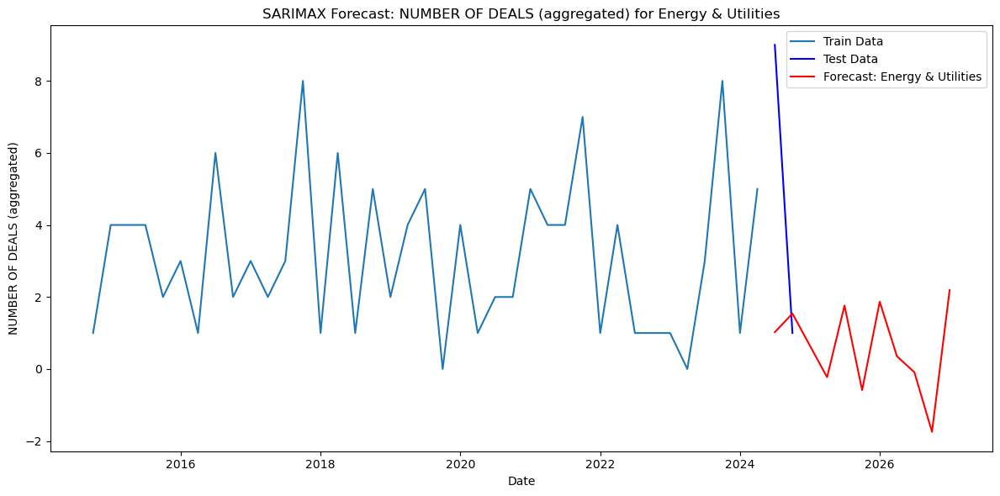

                                     SARIMAX Results                                     
Dep. Variable:      NUMBER OF DEALS (aggregated)   No. Observations:                   40
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 4)   Log Likelihood                 -60.921
Date:                           Wed, 04 Dec 2024   AIC                            141.843
Time:                                   15:31:08   BIC                            155.516
Sample:                                        0   HQIC                           146.125
                                            - 40                                         
Covariance Type:                             opg                                         
                                                      coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------
Dry Powder (NORTH AMERICA)                      

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

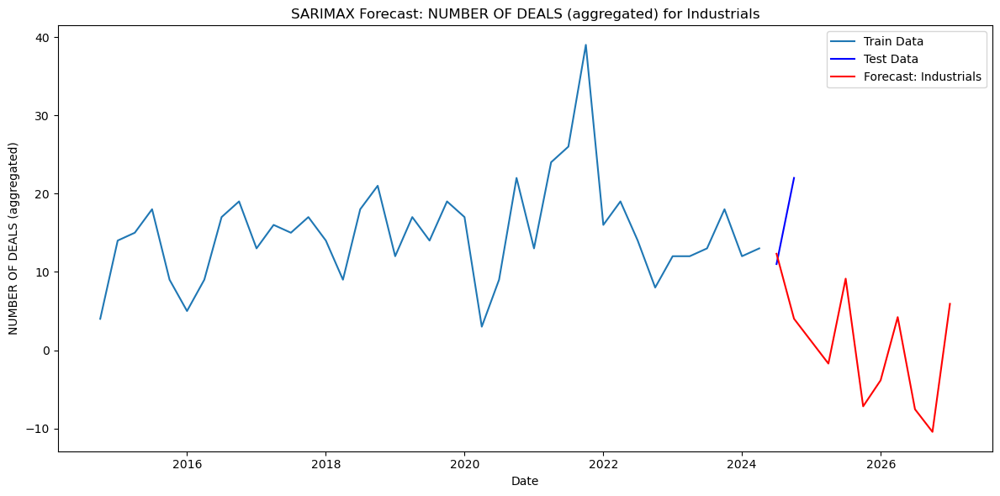

                                     SARIMAX Results                                     
Dep. Variable:      NUMBER OF DEALS (aggregated)   No. Observations:                   40
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 4)   Log Likelihood                 -72.490
Date:                           Wed, 04 Dec 2024   AIC                            164.981
Time:                                   15:31:08   BIC                            178.653
Sample:                                        0   HQIC                           169.263
                                            - 40                                         
Covariance Type:                             opg                                         
                                                      coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------
Dry Powder (NORTH AMERICA)                      

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

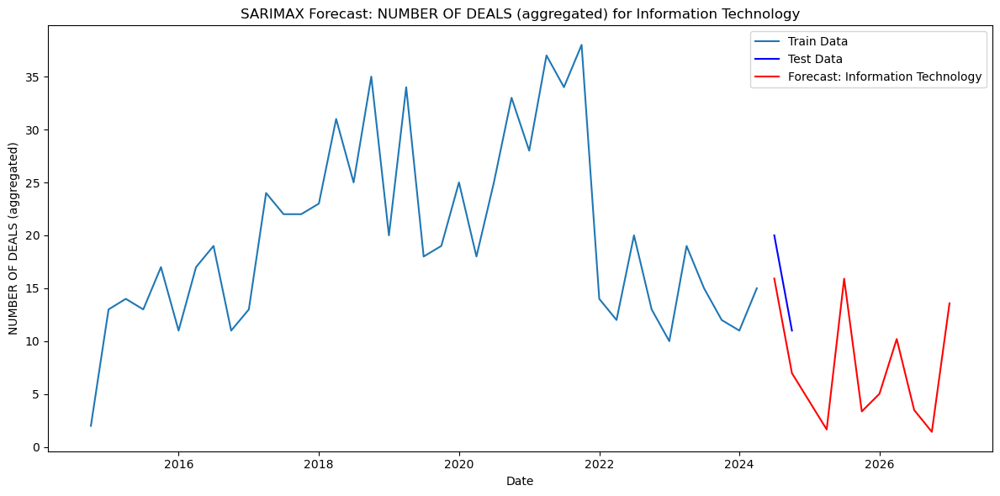

                                     SARIMAX Results                                     
Dep. Variable:      NUMBER OF DEALS (aggregated)   No. Observations:                   40
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 4)   Log Likelihood                 -84.177
Date:                           Wed, 04 Dec 2024   AIC                            188.355
Time:                                   15:31:08   BIC                            202.028
Sample:                                        0   HQIC                           192.637
                                            - 40                                         
Covariance Type:                             opg                                         
                                                      coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------
Dry Powder (NORTH AMERICA)                      

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

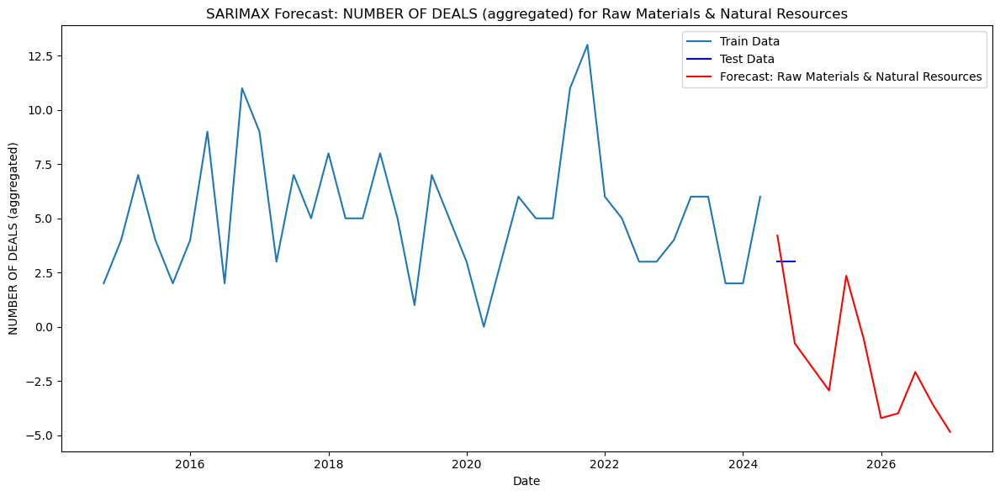

                                     SARIMAX Results                                     
Dep. Variable:      NUMBER OF DEALS (aggregated)   No. Observations:                   40
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 4)   Log Likelihood                 -67.620
Date:                           Wed, 04 Dec 2024   AIC                            155.240
Time:                                   15:31:08   BIC                            168.913
Sample:                                        0   HQIC                           159.522
                                            - 40                                         
Covariance Type:                             opg                                         
                                                      coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------
Dry Powder (NORTH AMERICA)                      

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

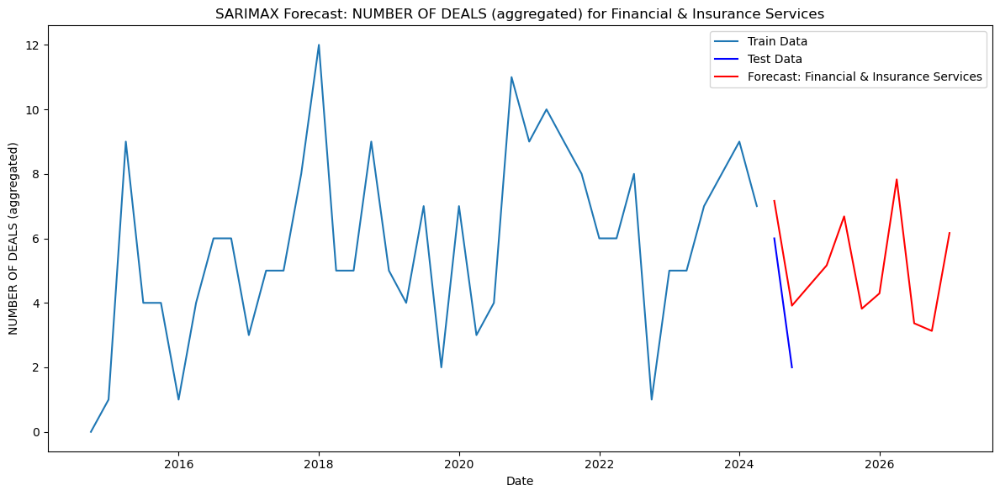

                                     SARIMAX Results                                     
Dep. Variable:      NUMBER OF DEALS (aggregated)   No. Observations:                   40
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 4)   Log Likelihood                 -63.751
Date:                           Wed, 04 Dec 2024   AIC                            147.503
Time:                                   15:31:08   BIC                            161.176
Sample:                                        0   HQIC                           151.785
                                            - 40                                         
Covariance Type:                             opg                                         
                                                      coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------
Dry Powder (NORTH AMERICA)                      

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

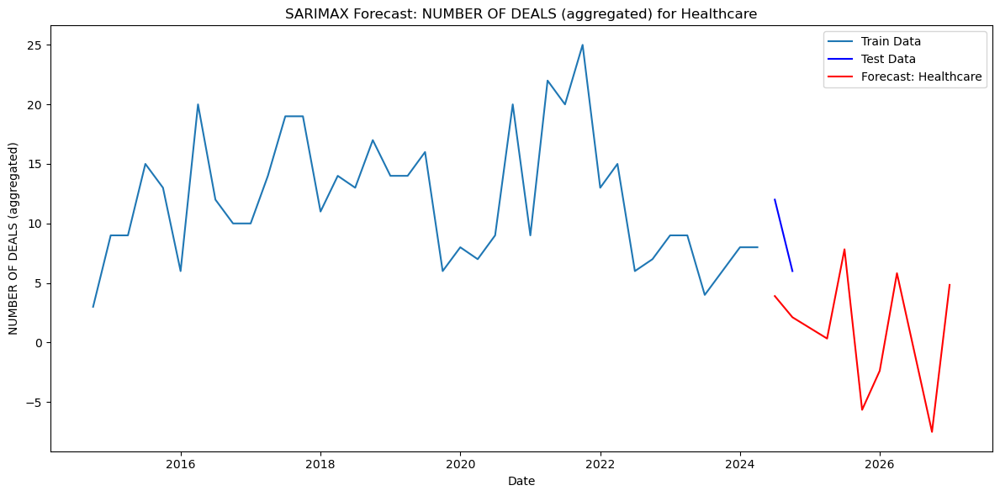

                                     SARIMAX Results                                     
Dep. Variable:      NUMBER OF DEALS (aggregated)   No. Observations:                   40
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 4)   Log Likelihood                 -80.593
Date:                           Wed, 04 Dec 2024   AIC                            181.186
Time:                                   15:31:09   BIC                            194.859
Sample:                                        0   HQIC                           185.468
                                            - 40                                         
Covariance Type:                             opg                                         
                                                      coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------
Dry Powder (NORTH AMERICA)                      

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

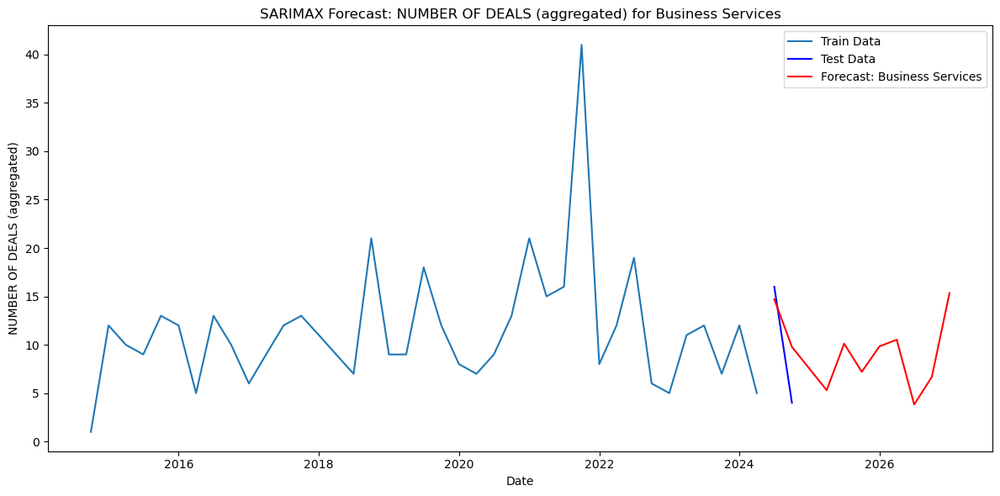

                                     SARIMAX Results                                     
Dep. Variable:      NUMBER OF DEALS (aggregated)   No. Observations:                   40
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 4)   Log Likelihood                 -88.766
Date:                           Wed, 04 Dec 2024   AIC                            197.531
Time:                                   15:31:09   BIC                            211.204
Sample:                                        0   HQIC                           201.813
                                            - 40                                         
Covariance Type:                             opg                                         
                                                      coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------
Dry Powder (NORTH AMERICA)                      

In [107]:
'''--------------------SARIMAX SBO ACTIVITIES BY INDUSTRY---------------------------'''
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
import matplotlib.pyplot as plt
import os

# Define paths
desktop_path = os.path.join(os.path.expanduser("~"), 'Desktop')
final_project_folder = os.path.join(desktop_path, 'Final Project')

# Load datasets
merged_file_path = os.path.join(final_project_folder, 'Merged_Data_Sorted_Cleaned.xlsx')
industry_file_path = os.path.join(final_project_folder, 'Merged_Industry_SBO_Simple.xlsx')

merged_data = pd.read_excel(merged_file_path)
industry_data = pd.read_excel(industry_file_path)

def convert_quarter_to_datetime(quarter):
    year = int(quarter.split(' ')[1])
    quarter_num = int(quarter.split(' ')[0][-1])
    month = {1: 1, 2: 4, 3: 7, 4: 10}[quarter_num]
    return pd.Timestamp(year=year, month=month, day=1)

merged_data['DATE'] = merged_data['DATE'].apply(convert_quarter_to_datetime)
industry_data['DATE'] = industry_data['DATE'].apply(convert_quarter_to_datetime)

# Merge datasets
combined_data = industry_data.merge(merged_data, on='DATE', how='left')
combined_data.set_index('DATE', inplace=True)
combined_data.sort_index(inplace=True)

numeric_cols = combined_data.columns.difference(['Industry'])
combined_data[numeric_cols] = combined_data[numeric_cols].replace("-", 0).apply(pd.to_numeric, errors='coerce')

combined_data[numeric_cols] = combined_data[numeric_cols].fillna(0)

# Industry-specific modeling
industries = combined_data['Industry'].unique()
target_variable = 'NUMBER OF DEALS (aggregated)'  
exogenous_variables = [
    'Dry Powder (NORTH AMERICA)',
    'Fundraising (AGGREGATE CAPITAL RAISED (USD BN))',
    'Interest Rate (Rate)',
    'LBO Data (NUMBER OF DEALS (aggregated))',
    'Exit Data (NUMBER OF DEALS (aggregated))'
]

# Predict for each industry
for industry in industries:
    print(f"Modeling for Industry: {industry}...")
    industry_data = combined_data[combined_data['Industry'] == industry]
    
    # Train-Test Split
    train = industry_data.loc[:'2024-06-30']
    test = industry_data.loc['2024-07-01':]
    
    # SARIMAX Model
    model = SARIMAX(train[target_variable],
                    exog=train[exogenous_variables],
                    order=(1, 1, 1),
                    seasonal_order=(1, 1, 1, 4),
                    enforce_stationarity=False,
                    enforce_invertibility=False)
    sarimax_results = model.fit()

    # Forecast for the next 8 quarters (2025-2026)
    future_steps = 8
    latest_exog = test[exogenous_variables].iloc[-1:]  
    future_exog = pd.concat([test[exogenous_variables], latest_exog] * future_steps, ignore_index=True).iloc[:len(test) + future_steps]

    forecast = sarimax_results.get_forecast(steps=len(test) + future_steps, exog=future_exog)
    forecast_values = forecast.predicted_mean

    future_dates = pd.date_range(start=test.index[-1], periods=future_steps + 1, freq='Q')[1:]
    forecast_values.index = test.index.union(future_dates)

    # Plot Results
    plt.figure(figsize=(12, 6))
    plt.plot(train[target_variable], label="Train Data")
    plt.plot(test[target_variable], label="Test Data", color='blue')
    plt.plot(forecast_values, label=f"Forecast: {industry}", color='red')
    plt.title(f"SARIMAX Forecast: {target_variable} for {industry}")
    plt.xlabel("Date")
    plt.ylabel(target_variable)
    plt.legend()
    plt.tight_layout()
    plt.show()

    print(sarimax_results.summary())


Modeling Exit Data (IPO)...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.33805D+00    |proj g|=  4.63505D-01

At iterate    5    f=  2.23953D+00    |proj g|=  5.44473D-01

At iterate   10    f=  2.17450D+00    |proj g|=  5.49988D-02

At iterate   15    f=  2.16884D+00    |proj g|=  9.77453D-02

At iterate   20    f=  2.15423D+00    |proj g|=  6.69503D-02

At iterate   25    f=  2.14722D+00    |proj g|=  1.63889D-01

At iterate   30    f=  2.14319D+00    |proj g|=  1.45627D+00

At iterate   35    f=  2.14071D+00    |proj g|=  1.31859D-01

At iterate   40    f=  2.13327D+00    |proj g|=  7.83569D-01

At iterate   45    f=  2.11532D+00    |proj g|=  1.03816D+00

At iterate   50    f=  2.09695D+00    |proj g|=  1.24995D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of 

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

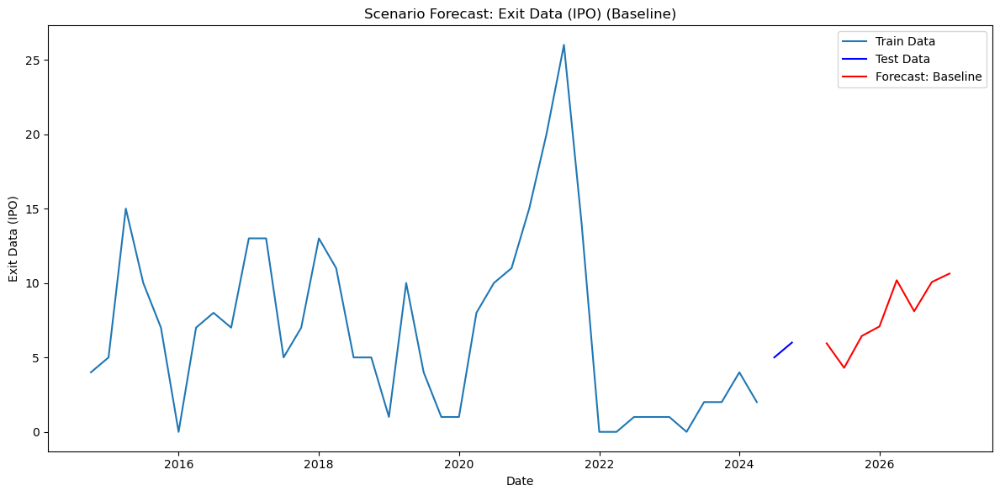

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


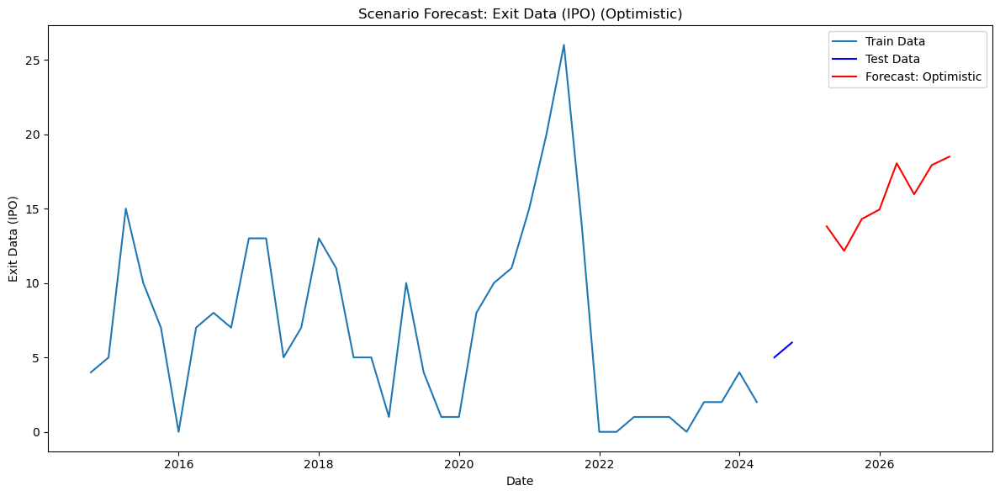

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


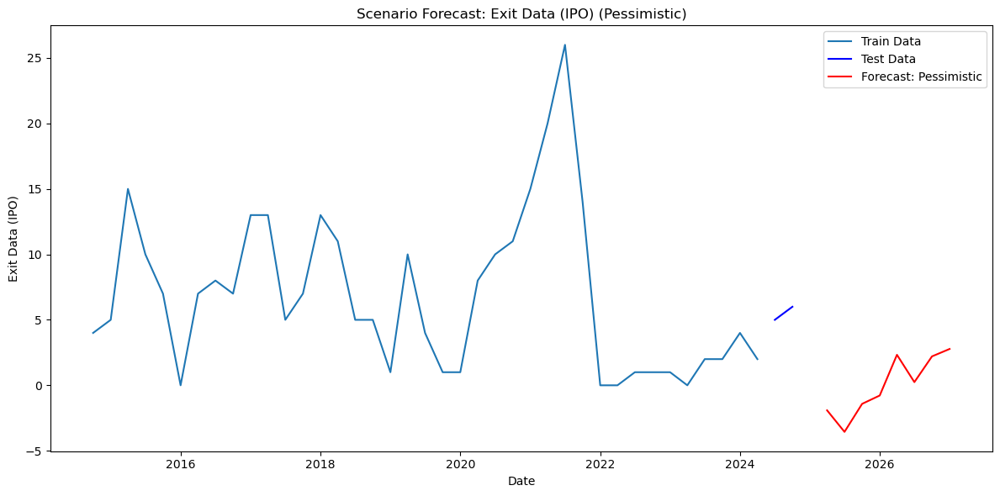

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.


Modeling Exit Data (TRADE SALE)...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.18116D+00    |proj g|=  1.51509D-01

At iterate    5    f=  3.10401D+00    |proj g|=  3.20459D-02

At iterate   10    f=  3.09319D+00    |proj g|=  1.66304D-02

At iterate   15    f=  3.07119D+00    |proj g|=  1.97740D-01

At iterate   20    f=  3.00407D+00    |proj g|=  7.24394D-02

At iterate   25    f=  3.00022D+00    |proj g|=  2.04117D-02

At iterate   30    f=  2.99926D+00    |proj g|=  2.05706D-02

At iterate   35    f=  2.98188D+00    |proj g|=  9.43901D-02

At iterate   40    f=  2.96236D+00    |proj g|=  1.28483D-02

At iterate   45    f=  2.96183D+00    |proj g|=  2.22660D-03

At iterate   50    f=  2.96182D+00    |proj g|=  2.62969D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total num

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


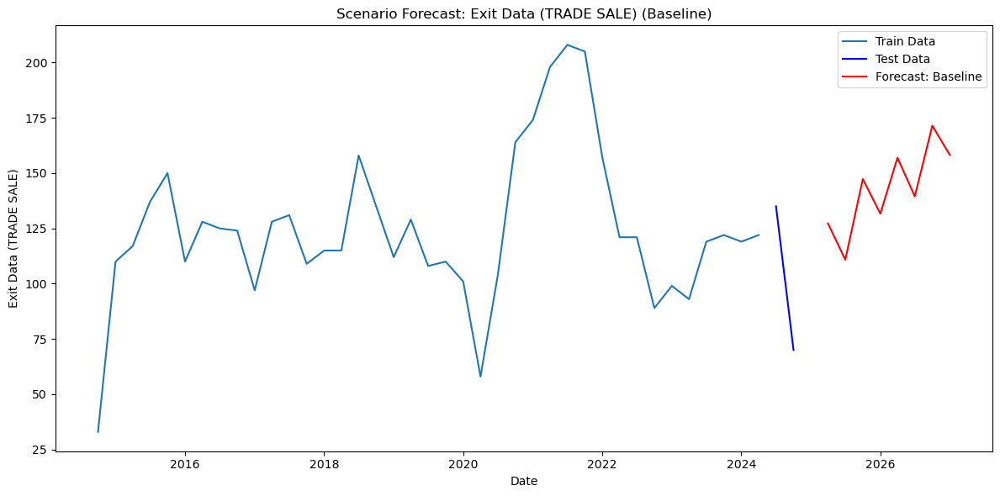

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


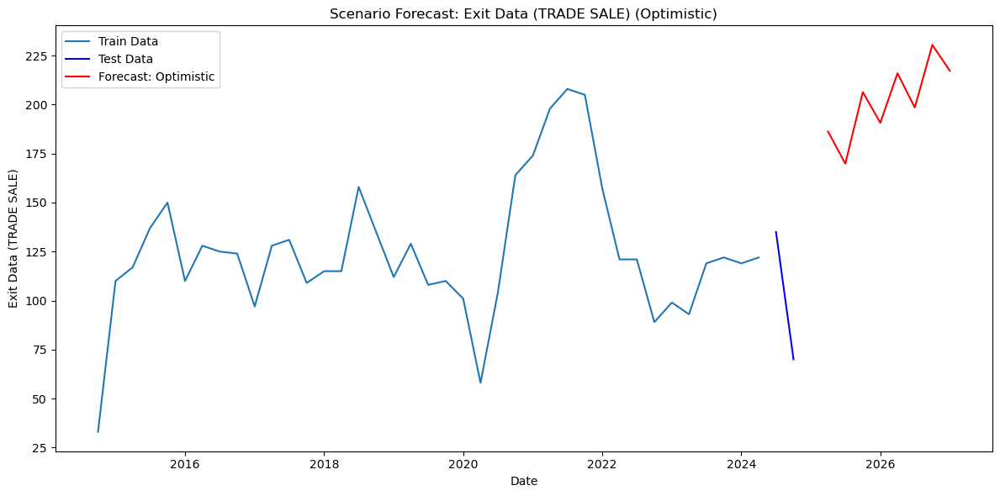

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


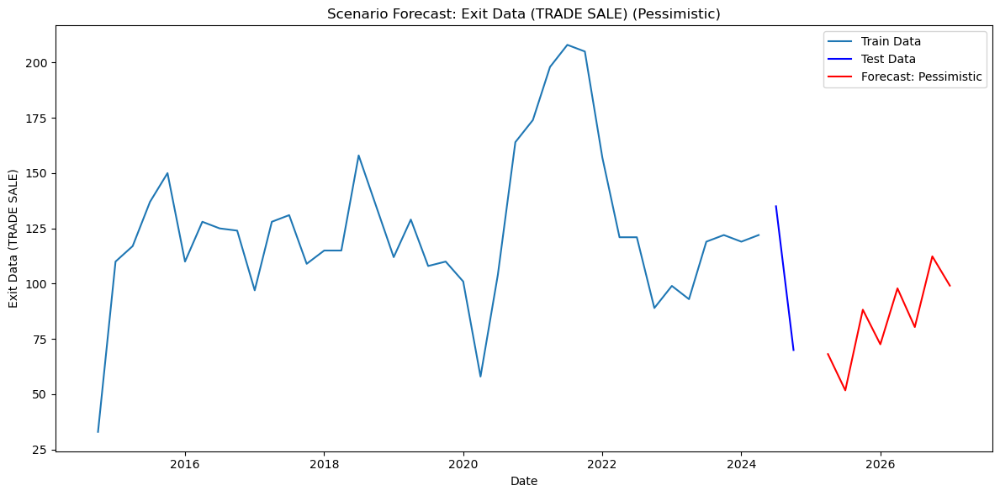

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.


Modeling Exit Data (SECONDARY BUYOUT)...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.67074D+00    |proj g|=  6.91898D+07
  ys=-3.128E-03  -gs= 1.610E-01 BFGS update SKIPPED
  ys=-5.259E-05  -gs= 1.079E-02 BFGS update SKIPPED


/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   10      3     40      3     2     0   7.149D+07  -7.691D+00
  F =  -7.6913371236186290     

ABNORMAL_TERMINATION_IN_LNSRCH                              


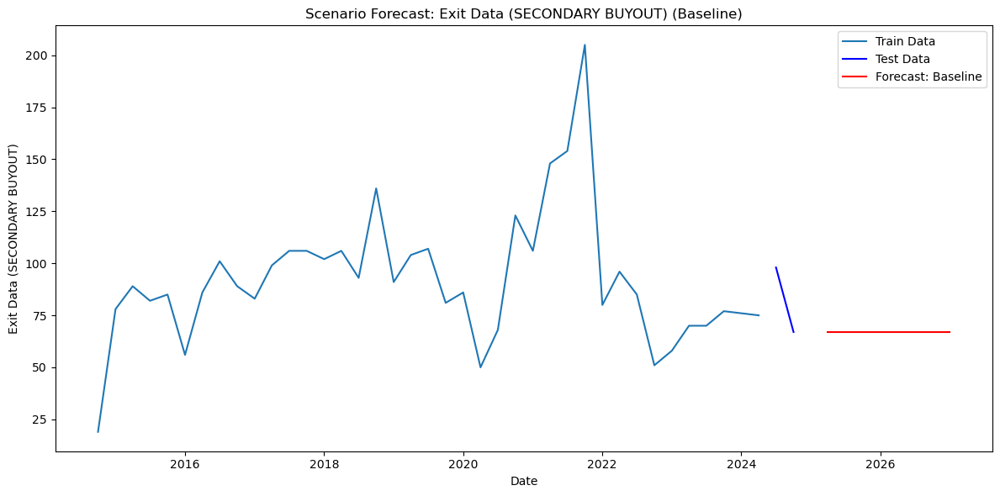

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


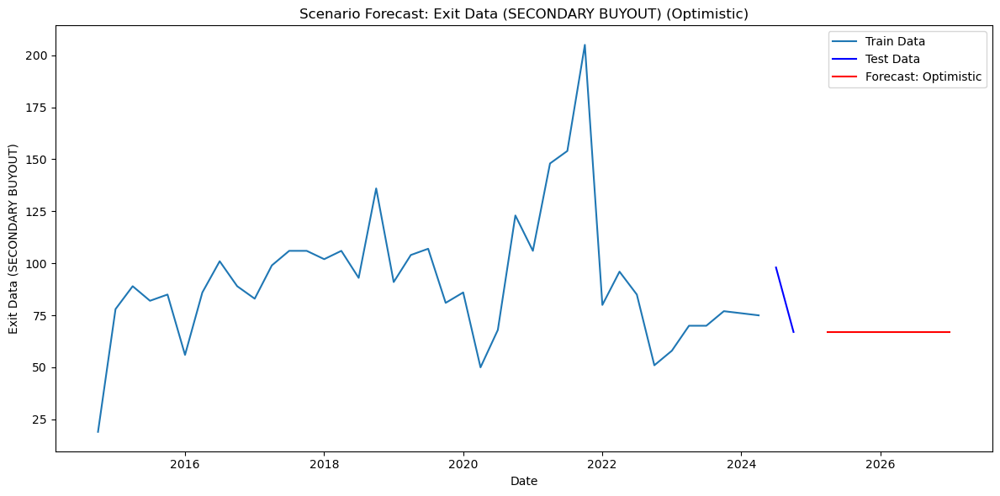

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


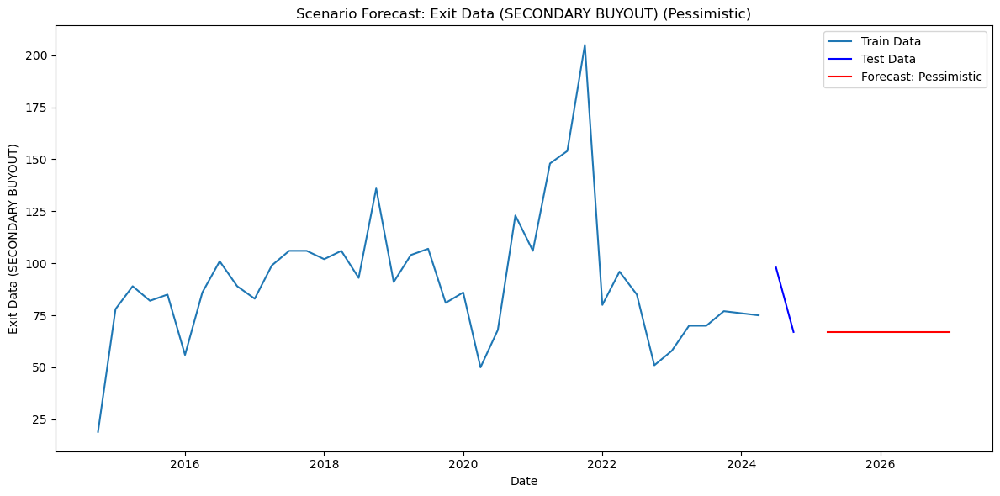

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling Exit Data (SALE TO MANAGEMENT)...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.48957D+00    |proj g|=  2.23805D+00

At iterate    5    f=  1.43066D+00    |proj g|=  6.52654D-01

At iterate   10    f=  1.42559D+00    |proj g|=  5.47148D-01

At iterate   15    f=  1.32408D+00    |proj g|=  5.13521D+00

At iterate   20    f=  1.29096D+00    |proj g|=  1.93754D+00

At iterate   25    f=  1.28983D+00    |proj g|=  9.75953D-01

At iterate   30    f=  1.27817D+00    |proj g|=  3.02018D+00

At iterate   35    f=  1.26878D+00    |proj g|=  1.18854D+00

At iterate   40    f=  1.25152D+00    |proj g|=  9.40511D-01

At iterate   45    f=  1.24917D+00    |proj g|=  1.76920D-01

At iterate   50    f=  1.24873D+00    |proj g|=  8.19665D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = t

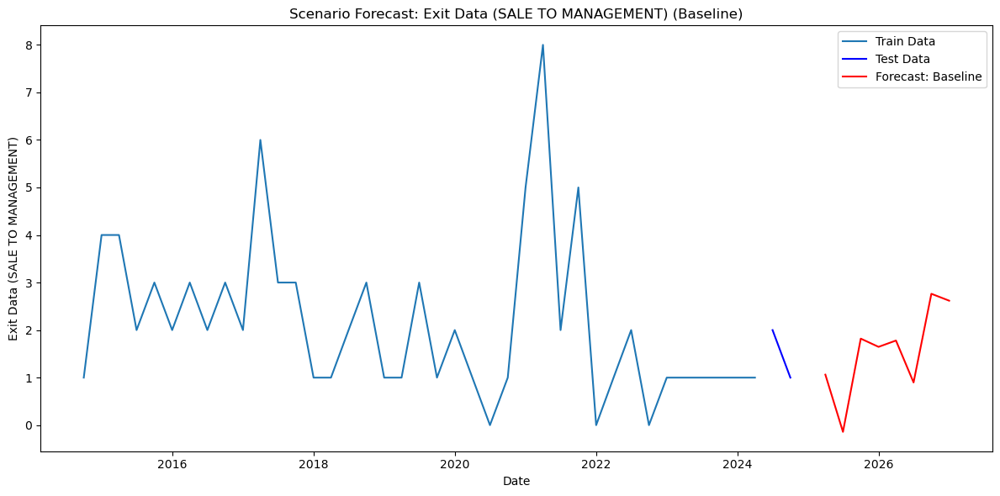

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


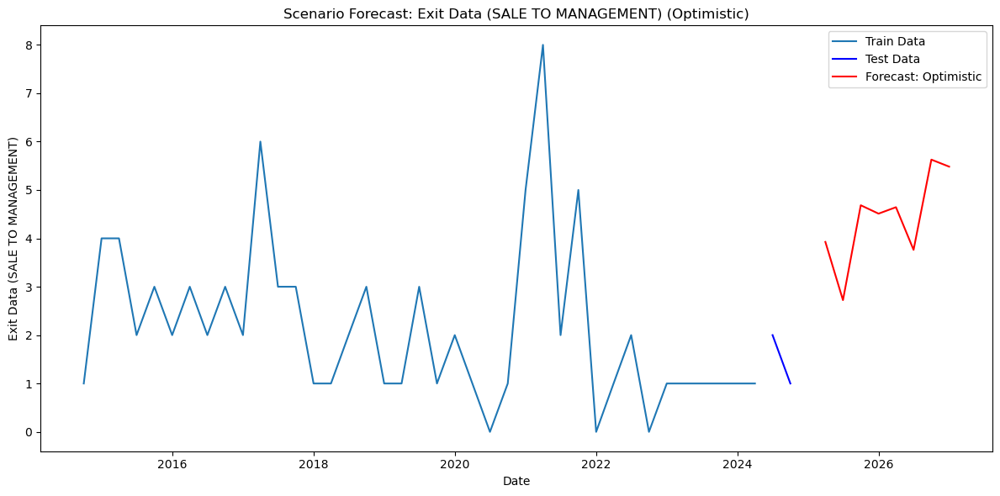

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


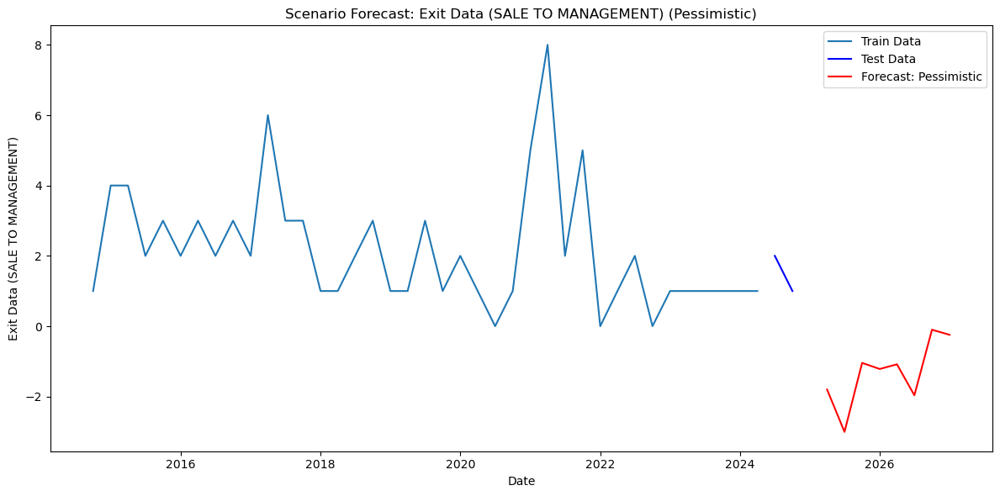

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling Exit Data (BANKRUPTCY/WRITE-OFF)...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.34482D+00    |proj g|=  9.90967D-01

At iterate    5    f=  2.29984D+00    |proj g|=  2.02618D-01

At iterate   10    f=  2.28902D+00    |proj g|=  9.72834D-02

At iterate   15    f=  2.26893D+00    |proj g|=  5.31201D-02

At iterate   20    f=  2.26086D+00    |proj g|=  8.26362D-02

At iterate   25    f=  2.24890D+00    |proj g|=  4.98185D-02

At iterate   30    f=  2.24610D+00    |proj g|=  1.27849D-02

At iterate   35    f=  2.24571D+00    |proj g|=  2.09802D-02

At iterate   40    f=  2.24472D+00    |proj g|=  1.84858D-02

At iterate   45    f=  2.24451D+00    |proj g|=  1.08422D-02

At iterate   50    f=  2.24394D+00    |proj g|=  1.42135D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint =

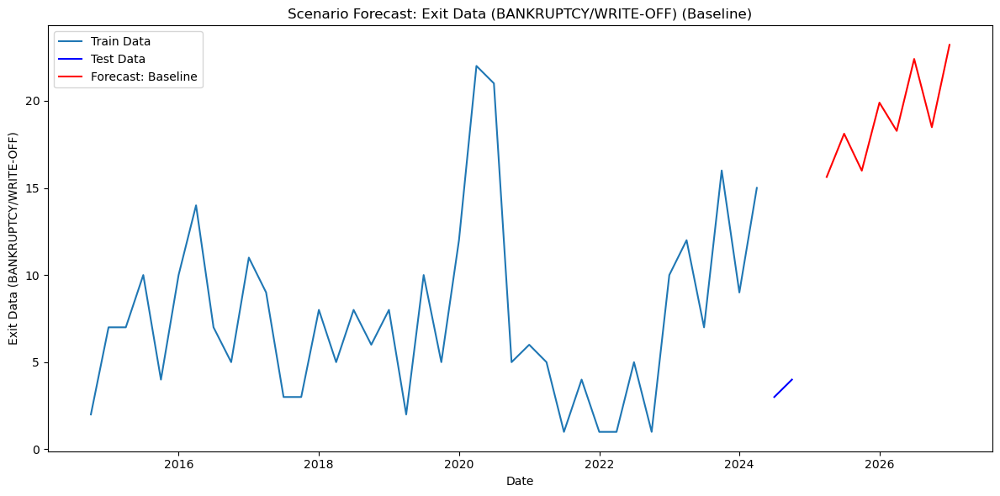

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


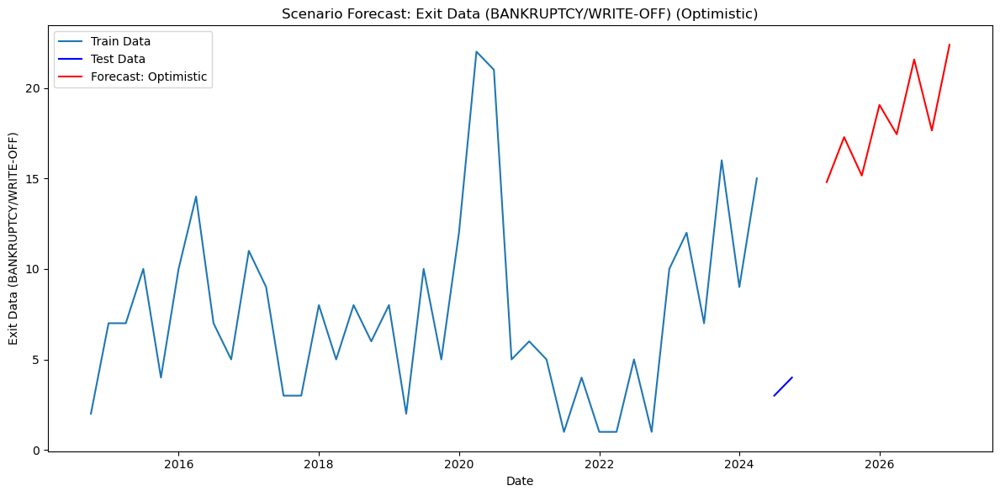

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


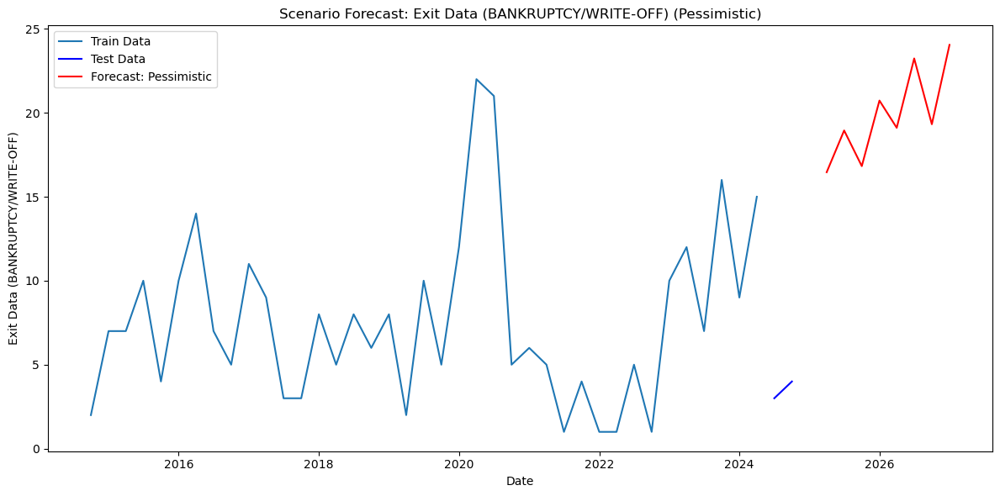

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling Exit Data (PRIVATE PLACEMENT/FOLLOW ON)...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.46248D+00    |proj g|=  5.12733D-01

At iterate    5    f=  2.44091D+00    |proj g|=  9.73566D-02

At iterate   10    f=  2.39808D+00    |proj g|=  1.90796D-01

At iterate   15    f=  2.29276D+00    |proj g|=  7.01284D-01

At iterate   20    f=  2.25194D+00    |proj g|=  2.39643D-02

At iterate   25    f=  2.24947D+00    |proj g|=  1.98451D-01

At iterate   30    f=  2.24111D+00    |proj g|=  3.75417D-01

At iterate   35    f=  2.23354D+00    |proj g|=  7.32045D-02

At iterate   40    f=  2.23106D+00    |proj g|=  3.80113D-02

At iterate   45    f=  2.22900D+00    |proj g|=  1.04114D-01

At iterate   50    f=  2.22567D+00    |proj g|=  6.85856D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations


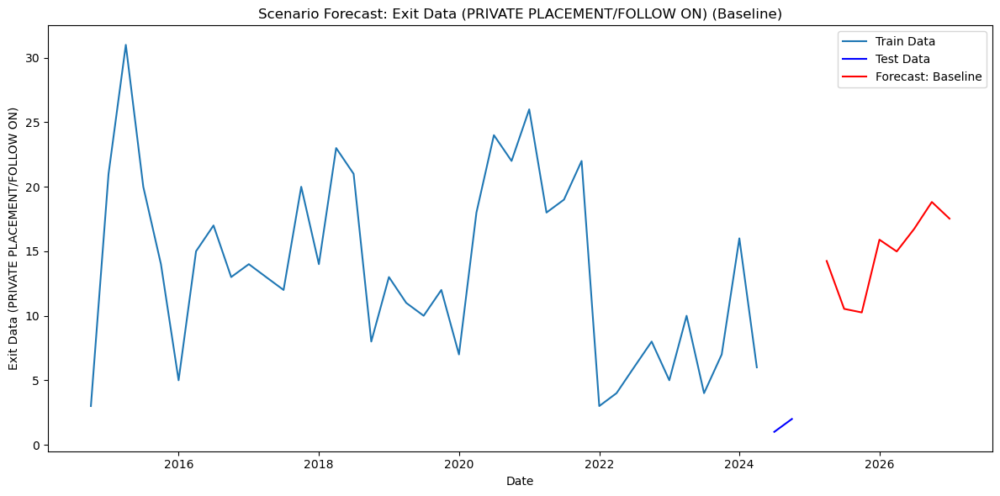

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


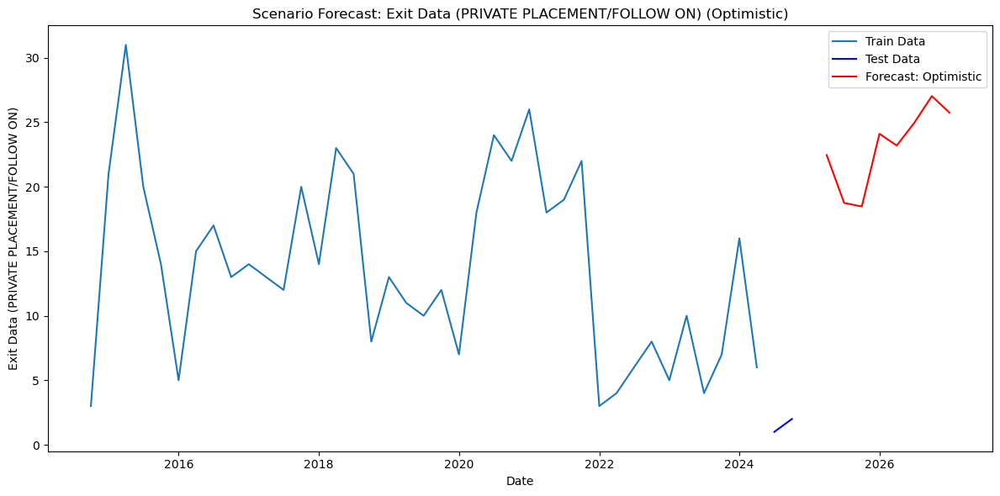

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


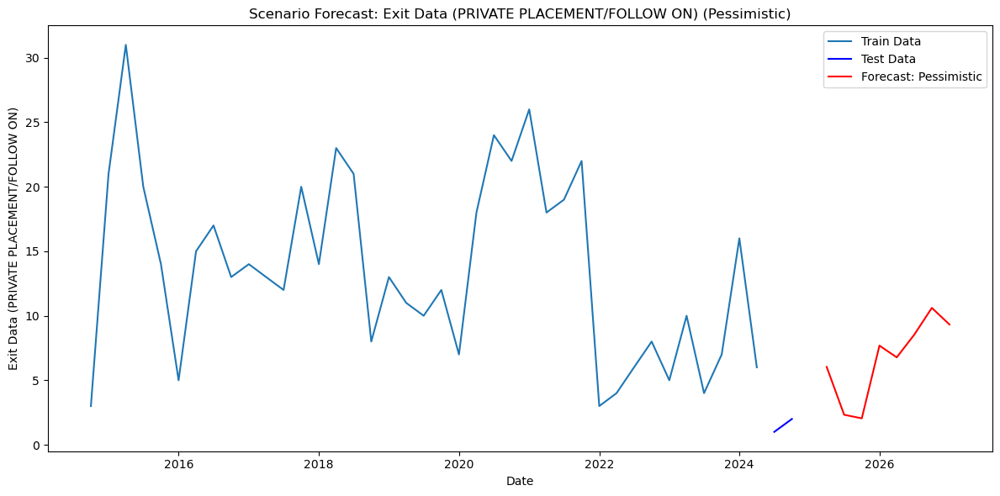

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling Exit Data (UNSPECIFIED EXIT)...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.38381D+00    |proj g|=  1.60553D+00

At iterate    5    f=  2.22834D+00    |proj g|=  2.87849D-01

At iterate   10    f=  2.21073D+00    |proj g|=  1.39921D-01

At iterate   15    f=  2.16963D+00    |proj g|=  3.28963D-01

At iterate   20    f=  2.14605D+00    |proj g|=  2.32348D-01

At iterate   25    f=  2.13186D+00    |proj g|=  1.24842D-01

At iterate   30    f=  2.12736D+00    |proj g|=  2.26711D-01

At iterate   35    f=  2.08900D+00    |proj g|=  2.52225D-01

At iterate   40    f=  2.07721D+00    |proj g|=  1.68955D-01

At iterate   45    f=  1.99963D+00    |proj g|=  4.53690D-01

At iterate   50    f=  1.96758D+00    |proj g|=  1.15186D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = tot

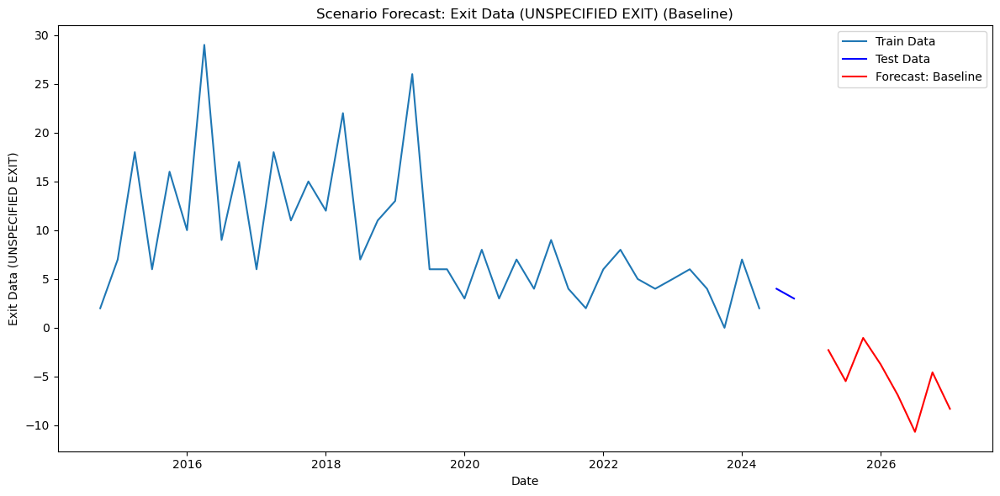

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


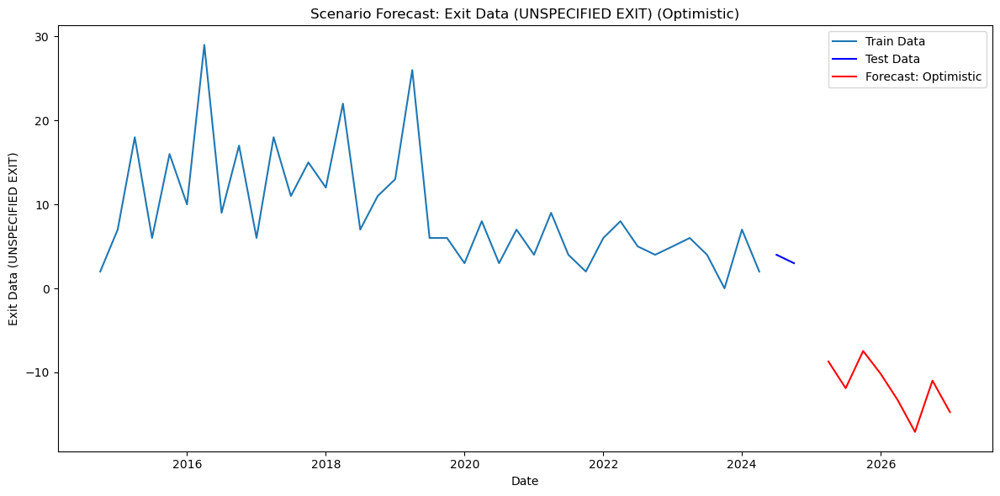

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


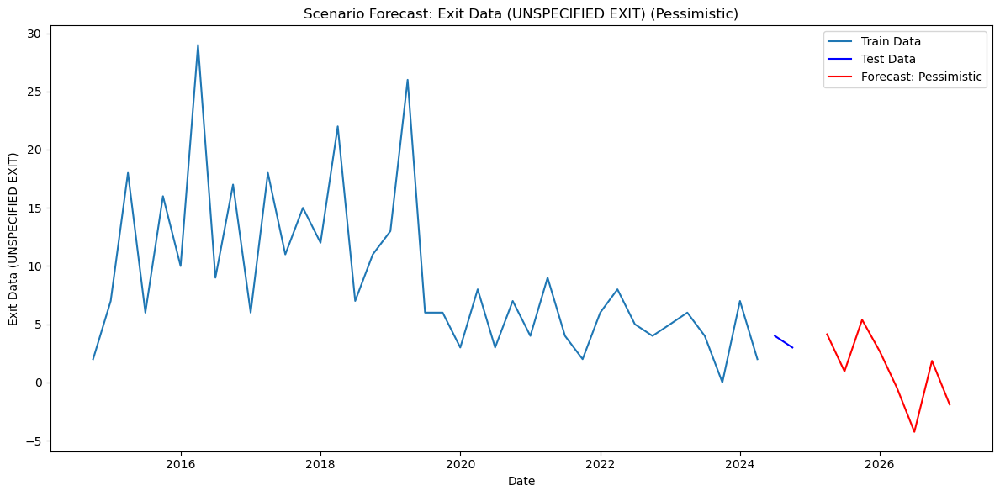

In [8]:
'''------------------SCENARIO ANALYSIS: EXIT STRATEGIES - TESTING SARIMAX THROUGH BASELINE, OPTIMISTIC, PESSIMISTIC-----------------------------'''
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
import matplotlib.pyplot as plt
import os

# Define paths
desktop_path = os.path.join(os.path.expanduser("~"), 'Desktop')
final_project_folder = os.path.join(desktop_path, 'Final Project')
merged_file_path = os.path.join(final_project_folder, 'Merged_Data_Sorted_Cleaned.xlsx')

# Load the merged data
data = pd.read_excel(merged_file_path)

def convert_quarter_to_datetime(quarter):
    year = int(quarter.split(' ')[1])
    quarter_num = int(quarter.split(' ')[0][-1])
    month = {1: 1, 2: 4, 3: 7, 4: 10}[quarter_num]
    return pd.Timestamp(year=year, month=month, day=1)

data['DATE'] = data['DATE'].apply(convert_quarter_to_datetime)
data.set_index('DATE', inplace=True)
data = data.sort_index()

numeric_cols = data.columns.difference(['DATE'])
data[numeric_cols] = data[numeric_cols].replace("-", 0).apply(pd.to_numeric, errors='coerce')
data[numeric_cols] = data[numeric_cols].fillna(0)

# Define target variables (exit strategies) and exogenous variables
exit_strategies = [
    'Exit Data (IPO)',
    'Exit Data (TRADE SALE)',
    'Exit Data (SECONDARY BUYOUT)',
    'Exit Data (SALE TO MANAGEMENT)',
    'Exit Data (BANKRUPTCY/WRITE-OFF)',
    'Exit Data (PRIVATE PLACEMENT/FOLLOW ON)',
    'Exit Data (UNSPECIFIED EXIT)'
]

exogenous_variables = [
    'Dry Powder (NORTH AMERICA)',
    'Fundraising (AGGREGATE CAPITAL RAISED (USD BN))',
    'Interest Rate (Rate)',
    'LBO Data (NUMBER OF DEALS (aggregated))',
    'SBO Data (NUMBER OF DEALS (aggregated))'
]

# Train-Test Split
train = data.loc[:'2024-06-30']
test = data.loc['2024-07-01':]

# Fit the SARIMAX model for each exit strategy
scenarios = {
    "Baseline": test[exogenous_variables].iloc[-1],
    "Optimistic": test[exogenous_variables].iloc[-1].copy(),
    "Pessimistic": test[exogenous_variables].iloc[-1].copy()
}

# Adjust scenarios
scenarios["Optimistic"]['Interest Rate (Rate)'] -= 0.5
scenarios["Optimistic"]['Dry Powder (NORTH AMERICA)'] *= 0.8
scenarios["Optimistic"]['Fundraising (AGGREGATE CAPITAL RAISED (USD BN))'] *= 1.2

scenarios["Pessimistic"]['Interest Rate (Rate)'] += 0.5
scenarios["Pessimistic"]['Dry Powder (NORTH AMERICA)'] *= 1.2
scenarios["Pessimistic"]['Fundraising (AGGREGATE CAPITAL RAISED (USD BN))'] *= 0.8

# Forecast for each scenario and exit strategy
forecast_results = {}

for strategy in exit_strategies:
    print(f"Modeling {strategy}...")
    model = SARIMAX(train[strategy],
                    exog=train[exogenous_variables],
                    order=(1, 1, 1),
                    seasonal_order=(1, 1, 1, 4),
                    enforce_stationarity=False,
                    enforce_invertibility=False)
    sarimax_results = model.fit()

    # Store scenario-based forecasts
    scenario_forecasts = {}
    for scenario_name, scenario_exog in scenarios.items():
        future_steps = 8
        future_exog = pd.DataFrame([scenario_exog] * future_steps, columns=exogenous_variables)

        forecast = sarimax_results.get_forecast(steps=future_steps, exog=future_exog)
        forecast_values = forecast.predicted_mean

        # Create a timeline for future quarters
        future_dates = pd.date_range(start=test.index[-1], periods=future_steps + 1, freq='Q')[1:]
        forecast_values.index = future_dates

        scenario_forecasts[scenario_name] = forecast_values

        # Plot Results
        plt.figure(figsize=(12, 6))
        plt.plot(train[strategy], label="Train Data")
        plt.plot(test[strategy], label="Test Data", color='blue')
        plt.plot(forecast_values, label=f"Forecast: {scenario_name}", color='red')
        plt.title(f"Scenario Forecast: {strategy} ({scenario_name})")
        plt.xlabel("Date")
        plt.ylabel(strategy)
        plt.legend()
        plt.tight_layout()
        plt.show()

    forecast_results[strategy] = scenario_forecasts


/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.


Modeling SBO Data (NUMBER OF DEALS (aggregated))...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.96373D+00    |proj g|=  2.49558D-01

At iterate    5    f=  2.87225D+00    |proj g|=  1.07850D-01

At iterate   10    f=  2.84531D+00    |proj g|=  1.25832D-01

At iterate   15    f=  2.84065D+00    |proj g|=  1.54839D-01

At iterate   20    f=  2.82597D+00    |proj g|=  2.71094D-01

At iterate   25    f=  2.78253D+00    |proj g|=  1.86222D-01

At iterate   30    f=  2.76073D+00    |proj g|=  1.27401D-01

At iterate   35    f=  2.74939D+00    |proj g|=  2.04866D-01

At iterate   40    f=  2.74399D+00    |proj g|=  1.49544D-01

At iterate   45    f=  2.73843D+00    |proj g|=  6.52510D-02

At iterate   50    f=  2.73762D+00    |proj g|=  1.09783D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations


/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


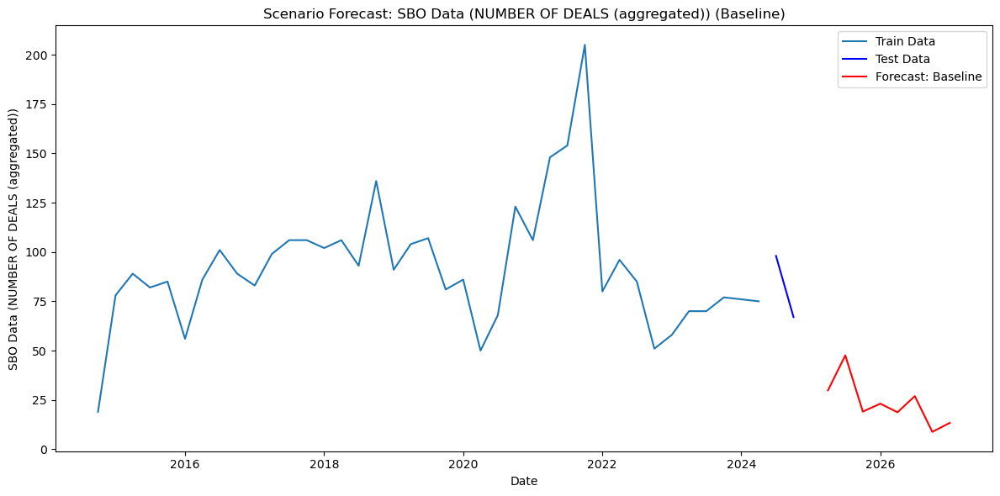

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


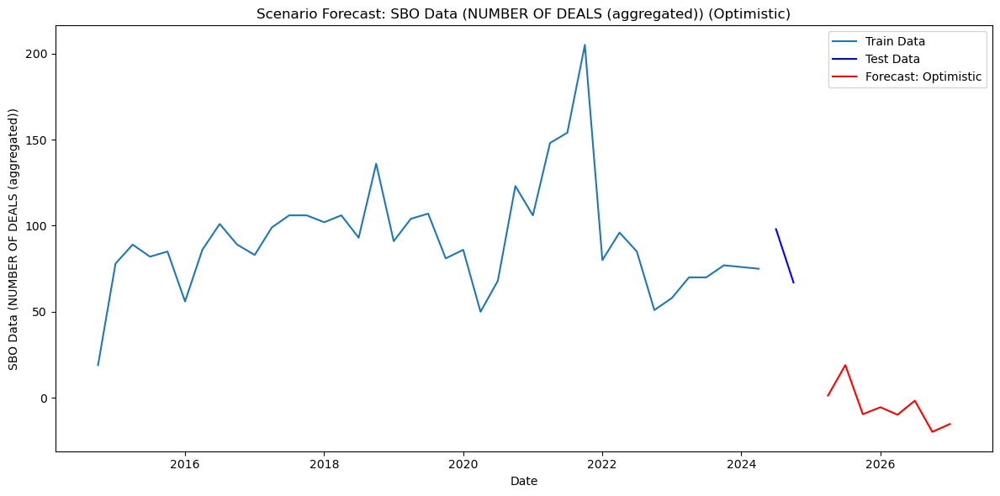

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


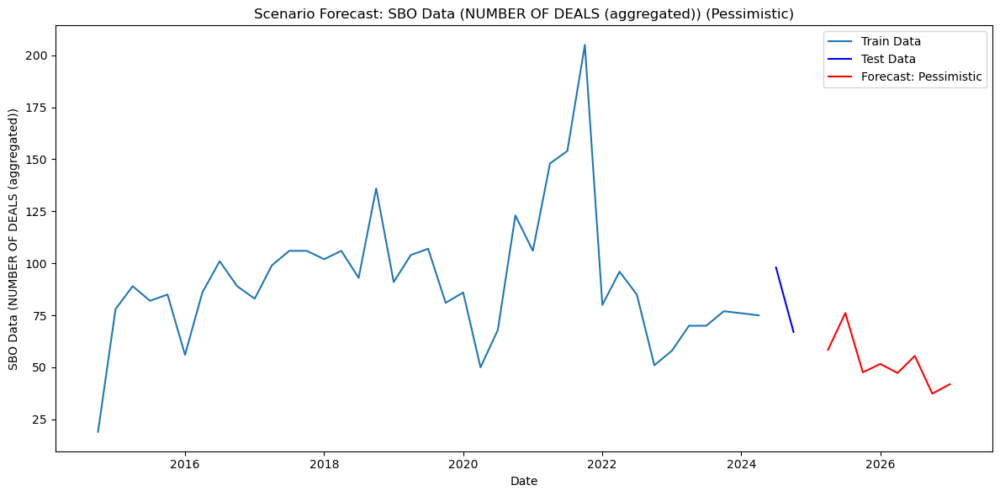

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling SBO Data (AGGREGATE DEAL VALUE (USD Bn))...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.63318D+00    |proj g|=  8.05629D-01

At iterate    5    f=  2.60415D+00    |proj g|=  7.32122D-01

At iterate   10    f=  2.58764D+00    |proj g|=  7.75250D-02

At iterate   15    f=  2.58403D+00    |proj g|=  5.65331D-02

At iterate   20    f=  2.55667D+00    |proj g|=  1.71574D-01

At iterate   25    f=  2.53971D+00    |proj g|=  2.47802D-02

At iterate   30    f=  2.53903D+00    |proj g|=  1.46466D-01

At iterate   35    f=  2.53265D+00    |proj g|=  3.35730D-01

At iterate   40    f=  2.53017D+00    |proj g|=  7.66202D-02

At iterate   45    f=  2.52394D+00    |proj g|=  7.55065D-01

At iterate   50    f=  2.50676D+00    |proj g|=  4.97261D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations

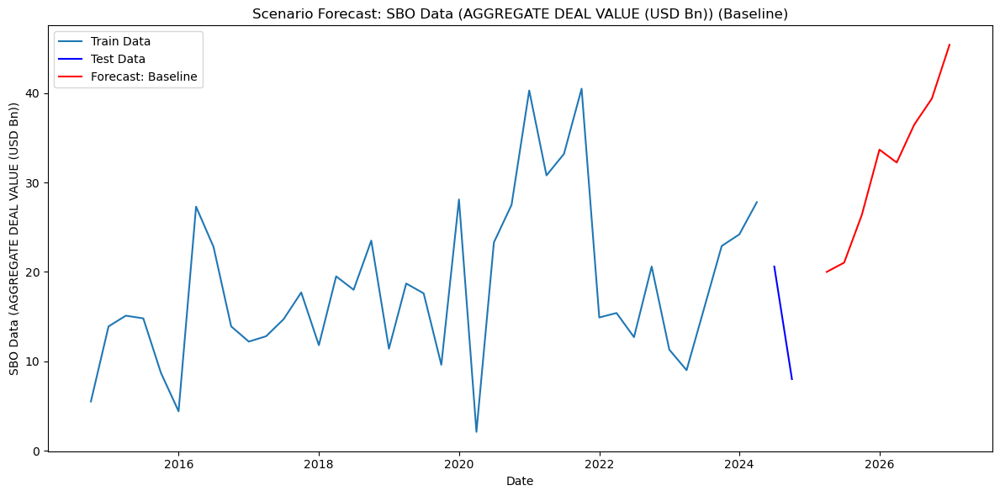

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


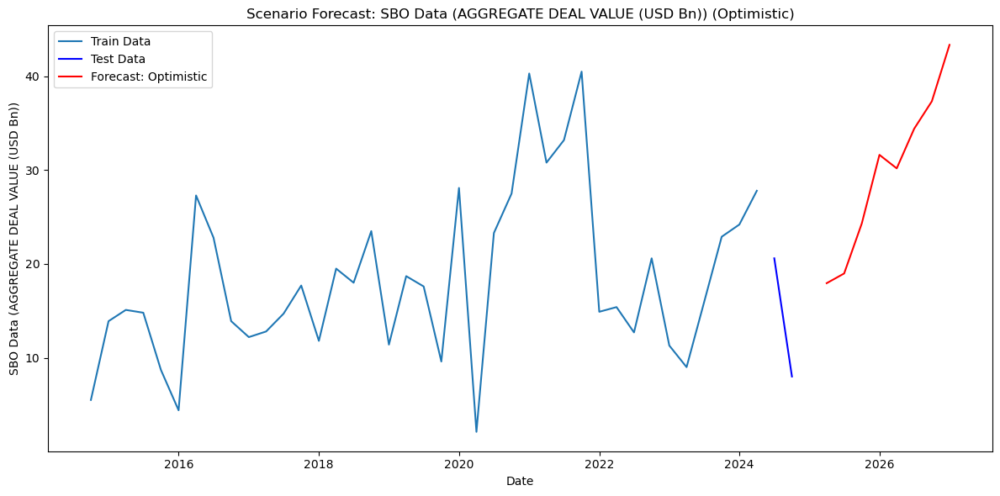

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


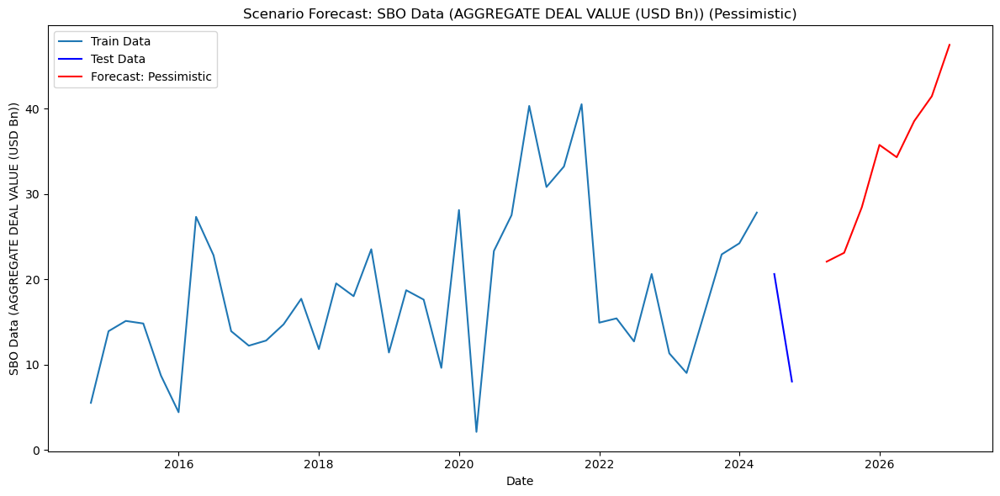

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling SBO Data (AVERAGE DEAL SIZE (USD Mn))...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.37900D+00    |proj g|=  1.12201D-01

At iterate    5    f=  5.33995D+00    |proj g|=  3.50533D-02

At iterate   10    f=  5.31952D+00    |proj g|=  5.92477D-02

At iterate   15    f=  5.29289D+00    |proj g|=  6.10770D-03

At iterate   20    f=  5.28984D+00    |proj g|=  1.72179D-02

At iterate   25    f=  5.28914D+00    |proj g|=  1.75047D-03

At iterate   30    f=  5.28891D+00    |proj g|=  1.58622D-03

At iterate   35    f=  5.28573D+00    |proj g|=  9.67168D-03

At iterate   40    f=  5.28025D+00    |proj g|=  1.30500D-02

At iterate   45    f=  5.26973D+00    |proj g|=  6.19427D-03

At iterate   50    f=  5.26901D+00    |proj g|=  1.51194D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tn

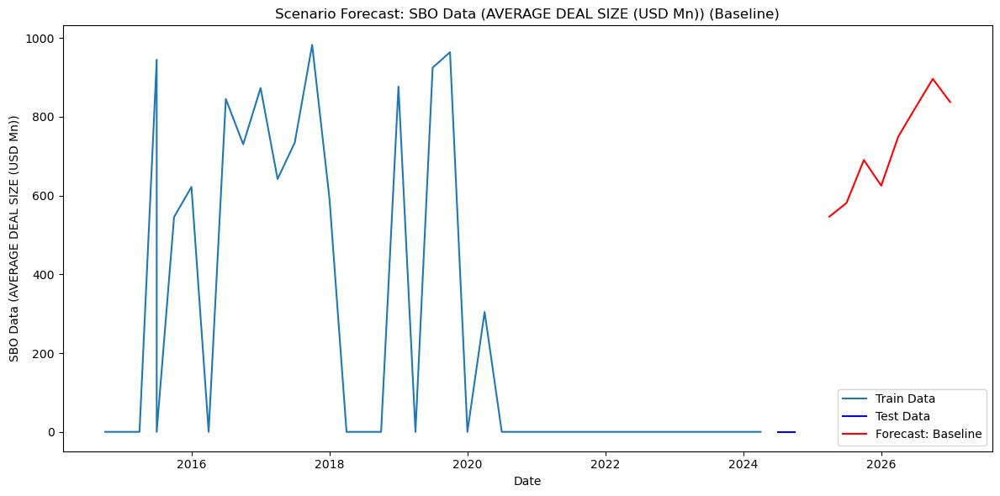

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


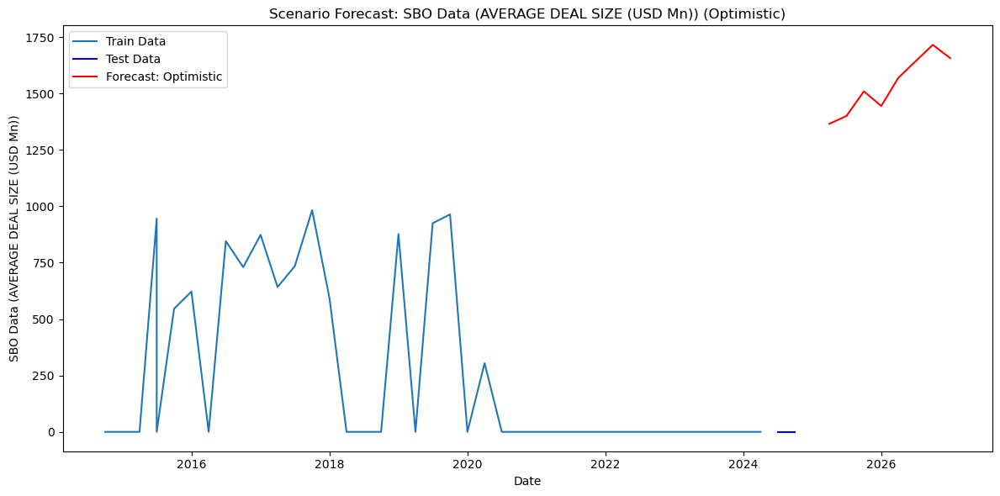

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


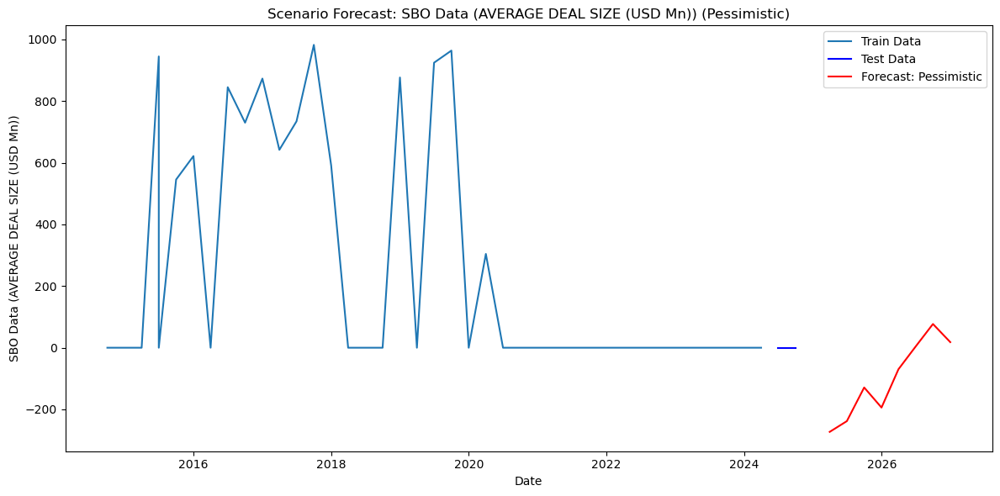

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling SBO Data (SECONDARY BUYOUT)...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.96373D+00    |proj g|=  2.49558D-01

At iterate    5    f=  2.87225D+00    |proj g|=  1.07850D-01

At iterate   10    f=  2.84531D+00    |proj g|=  1.25832D-01

At iterate   15    f=  2.84065D+00    |proj g|=  1.54839D-01

At iterate   20    f=  2.82597D+00    |proj g|=  2.71094D-01

At iterate   25    f=  2.78253D+00    |proj g|=  1.86222D-01

At iterate   30    f=  2.76073D+00    |proj g|=  1.27401D-01

At iterate   35    f=  2.74939D+00    |proj g|=  2.04866D-01

At iterate   40    f=  2.74399D+00    |proj g|=  1.49544D-01

At iterate   45    f=  2.73843D+00    |proj g|=  6.52510D-02

At iterate   50    f=  2.73762D+00    |proj g|=  1.09783D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = tota

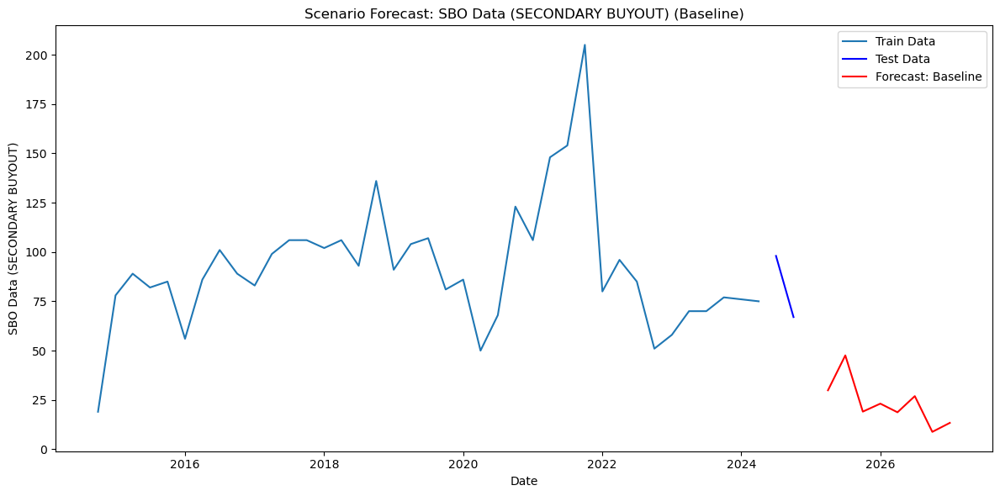

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


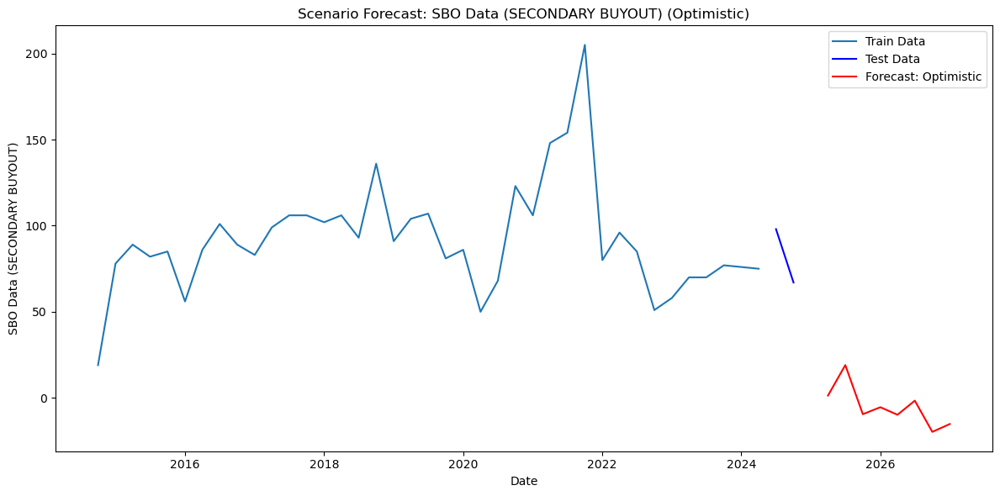

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


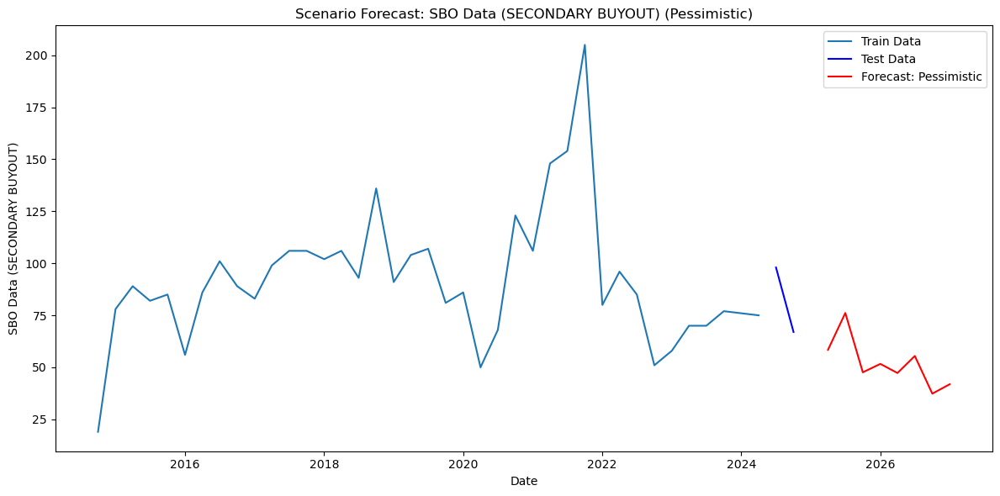

In [9]:
'''------------------SCENARIO ANALYSIS: SBO ACTIVITIES RELATED DATA - TESTING SARIMAX THROUGH BASELINE, OPTIMISTIC, PESSIMISTIC-----------------------------'''
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
import matplotlib.pyplot as plt
import os

# Define paths
desktop_path = os.path.join(os.path.expanduser("~"), 'Desktop')
final_project_folder = os.path.join(desktop_path, 'Final Project')
merged_file_path = os.path.join(final_project_folder, 'Merged_Data_Sorted_Cleaned.xlsx')

# Load the merged data
data = pd.read_excel(merged_file_path)

def convert_quarter_to_datetime(quarter):
    year = int(quarter.split(' ')[1])
    quarter_num = int(quarter.split(' ')[0][-1])
    month = {1: 1, 2: 4, 3: 7, 4: 10}[quarter_num]
    return pd.Timestamp(year=year, month=month, day=1)

data['DATE'] = data['DATE'].apply(convert_quarter_to_datetime)
data.set_index('DATE', inplace=True)
data = data.sort_index()

numeric_cols = data.columns.difference(['DATE'])
data[numeric_cols] = data[numeric_cols].replace("-", 0).apply(pd.to_numeric, errors='coerce')
data[numeric_cols] = data[numeric_cols].fillna(0)

sbo_targets = [
    'SBO Data (NUMBER OF DEALS (aggregated))',
    'SBO Data (AGGREGATE DEAL VALUE (USD Bn))',
    'SBO Data (AVERAGE DEAL SIZE (USD Mn))',
    'SBO Data (SECONDARY BUYOUT)'
]

exogenous_variables = [
    'Dry Powder (NORTH AMERICA)',
    'Fundraising (AGGREGATE CAPITAL RAISED (USD BN))',
    'Interest Rate (Rate)',
    'LBO Data (NUMBER OF DEALS (aggregated))',
    'Exit Data (NUMBER OF DEALS (aggregated))'
]

# Train-Test Split
train = data.loc[:'2024-06-30']
test = data.loc['2024-07-01':]

# Fit the SARIMAX model for each SBO aspect
scenarios = {
    "Baseline": test[exogenous_variables].iloc[-1],
    "Optimistic": test[exogenous_variables].iloc[-1].copy(),
    "Pessimistic": test[exogenous_variables].iloc[-1].copy()
}

# Adjust scenarios
scenarios["Optimistic"]['Interest Rate (Rate)'] -= 0.5
scenarios["Optimistic"]['Dry Powder (NORTH AMERICA)'] *= 0.8
scenarios["Optimistic"]['Fundraising (AGGREGATE CAPITAL RAISED (USD BN))'] *= 1.2

scenarios["Pessimistic"]['Interest Rate (Rate)'] += 0.5
scenarios["Pessimistic"]['Dry Powder (NORTH AMERICA)'] *= 1.2
scenarios["Pessimistic"]['Fundraising (AGGREGATE CAPITAL RAISED (USD BN))'] *= 0.8

forecast_results = {}

for target in sbo_targets:
    print(f"Modeling {target}...")
    model = SARIMAX(train[target],
                    exog=train[exogenous_variables],
                    order=(1, 1, 1),
                    seasonal_order=(1, 1, 1, 4),
                    enforce_stationarity=False,
                    enforce_invertibility=False)
    sarimax_results = model.fit()

    # Store scenario-based forecasts
    scenario_forecasts = {}
    for scenario_name, scenario_exog in scenarios.items():
        future_steps = 8
        future_exog = pd.DataFrame([scenario_exog] * future_steps, columns=exogenous_variables)

        forecast = sarimax_results.get_forecast(steps=future_steps, exog=future_exog)
        forecast_values = forecast.predicted_mean

        # Create a timeline for future quarters
        future_dates = pd.date_range(start=test.index[-1], periods=future_steps + 1, freq='Q')[1:]
        forecast_values.index = future_dates

        scenario_forecasts[scenario_name] = forecast_values

        # Plot Results
        plt.figure(figsize=(12, 6))
        plt.plot(train[target], label="Train Data")
        plt.plot(test[target], label="Test Data", color='blue')
        plt.plot(forecast_values, label=f"Forecast: {scenario_name}", color='red')
        plt.title(f"Scenario Forecast: {target} ({scenario_name})")
        plt.xlabel("Date")
        plt.ylabel(target)
        plt.legend()
        plt.tight_layout()
        plt.show()

    forecast_results[target] = scenario_forecasts


Processing Industry: Telecoms & Media...
Modeling NUMBER OF DEALS (aggregated) for Telecoms & Media...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.64321D+00    |proj g|=  4.25882D+00

At iterate    5    f=  1.60160D+00    |proj g|=  5.48765D-01

At iterate   10    f=  1.54388D+00    |proj g|=  1.43458D+00

At iterate   15    f=  1.48429D+00    |proj g|=  1.02061D-01
  ys=-8.800E-02  -gs= 2.469E-03 BFGS update SKIPPED

At iterate   20    f=  1.43967D+00    |proj g|=  6.17935D-01

At iterate   25    f=  1.41881D+00    |proj g|=  7.11984D-01

At iterate   30    f=  1.38455D+00    |proj g|=  1.62109D-01

At iterate   35    f=  1.37733D+00    |proj g|=  1.62051D+00

At iterate   40    f=  1.33273D+00    |proj g|=  1.98355D+00

At iterate   45    f=  1.31541D+00    |proj g|=  1.36193D+00

At iterate   50    f=  1.28689D+00    |proj g|=  8.36060D

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

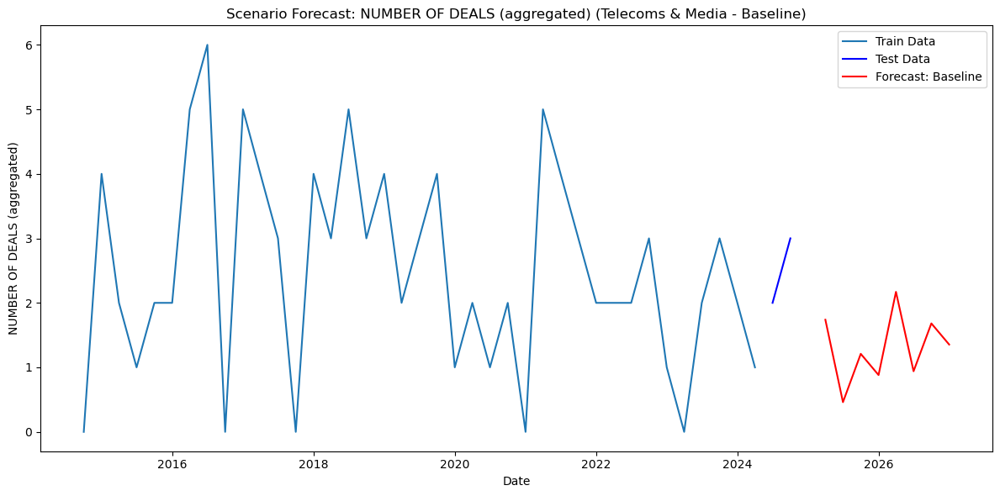

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


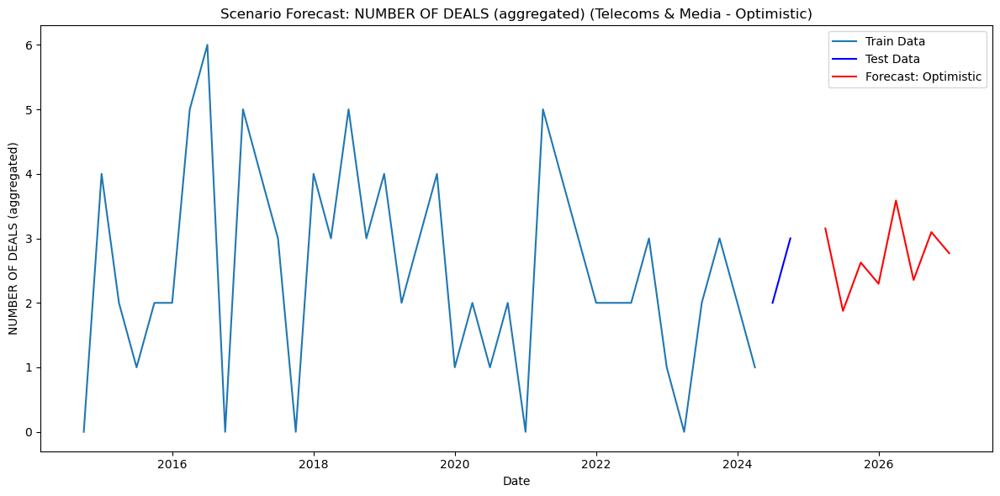

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


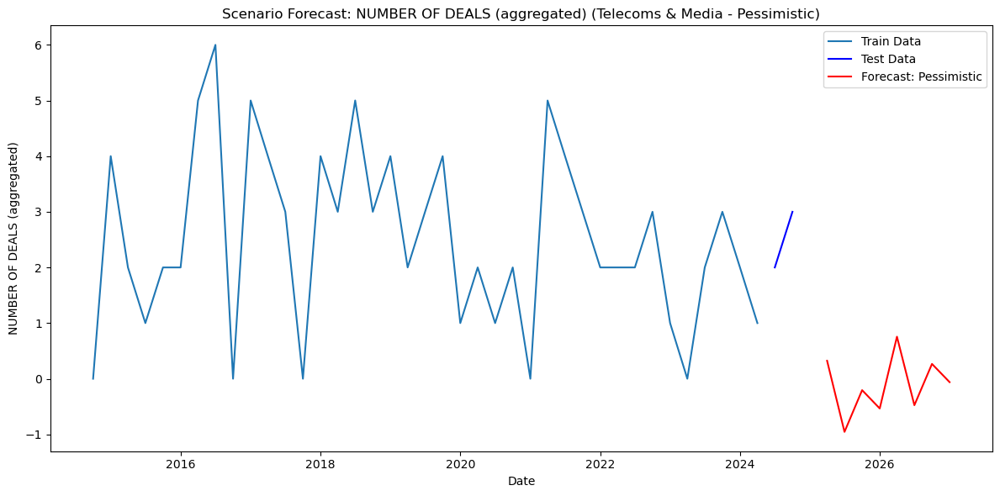

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling AGGREGATE DEAL VALUE (USD Bn) for Telecoms & Media...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.15312D+00    |proj g|=  1.07453D+00

At iterate    5    f=  2.13308D+00    |proj g|=  1.19459D+00

At iterate   10    f=  2.07173D+00    |proj g|=  4.73610D+00

At iterate   15    f=  1.85817D+00    |proj g|=  1.36953D+00

At iterate   20    f=  1.79526D+00    |proj g|=  7.21555D+00

At iterate   25    f=  1.68254D+00    |proj g|=  5.15516D-01

At iterate   30    f=  1.68150D+00    |proj g|=  6.72456D-02

At iterate   35    f=  1.67814D+00    |proj g|=  9.29429D-01

At iterate   40    f=  1.66489D+00    |proj g|=  2.86910D-01

At iterate   45    f=  1.66421D+00    |proj g|=  5.14299D-02

At iterate   50    f=  1.66401D+00    |proj g|=  3.41324D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function e

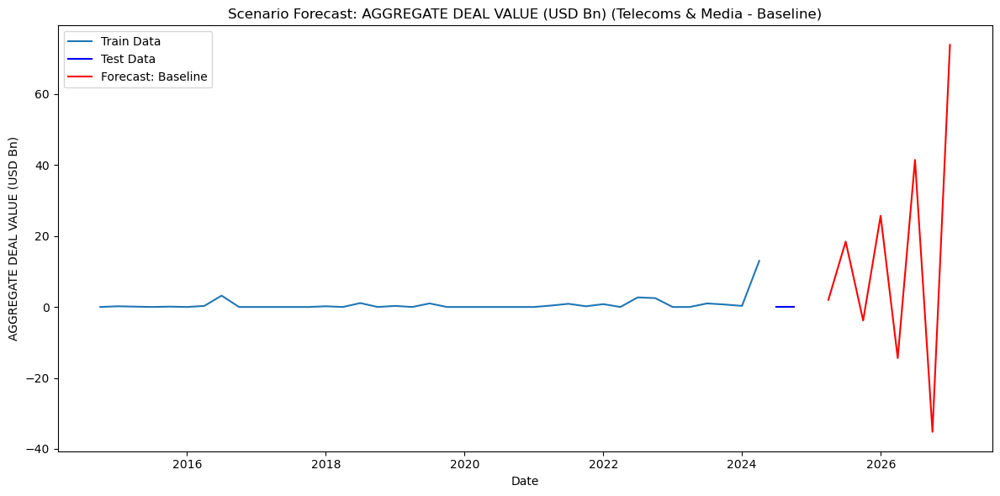

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


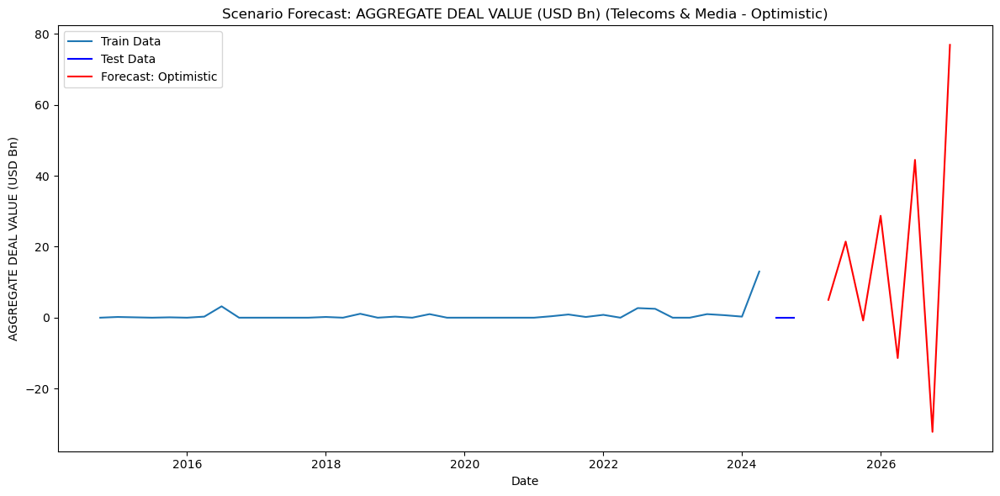

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


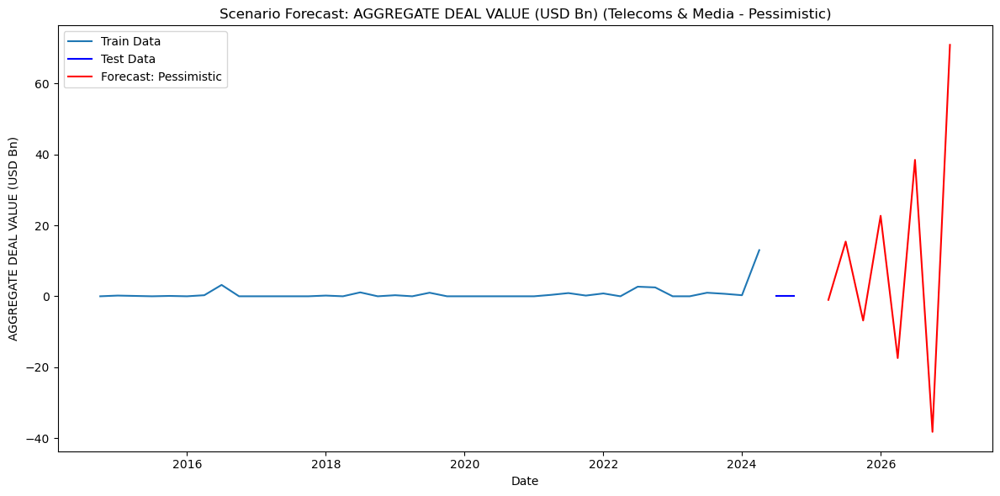

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling AVERAGE DEAL SIZE (USD Mn) for Telecoms & Media...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.43361D+00    |proj g|=  6.65049D-02

At iterate    5    f=  5.39447D+00    |proj g|=  2.25446D-02

At iterate   10    f=  5.39312D+00    |proj g|=  1.37785D-02

At iterate   15    f=  5.38753D+00    |proj g|=  3.26471D-02

At iterate   20    f=  5.38626D+00    |proj g|=  4.15176D-03

At iterate   25    f=  5.38596D+00    |proj g|=  4.64733D-03

At iterate   30    f=  5.38344D+00    |proj g|=  1.16708D-02

At iterate   35    f=  5.38200D+00    |proj g|=  1.43115D-02

At iterate   40    f=  5.37975D+00    |proj g|=  1.57854D-03

At iterate   45    f=  5.37931D+00    |proj g|=  3.53446D-03

At iterate   50    f=  5.37919D+00    |proj g|=  1.11782D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function eval

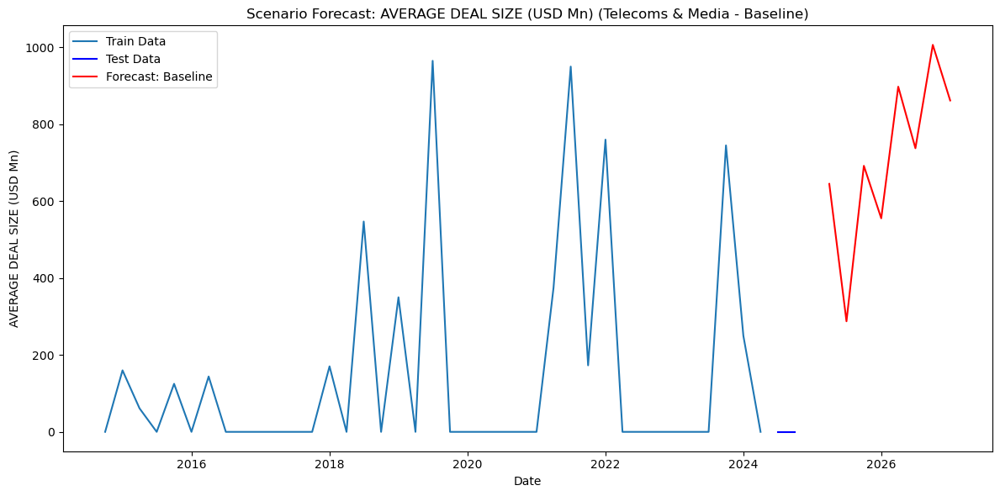

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


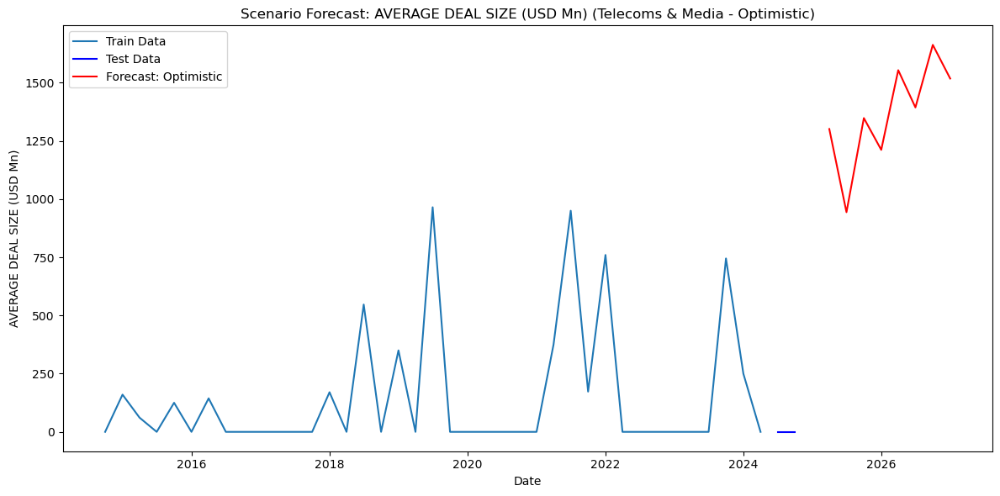

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


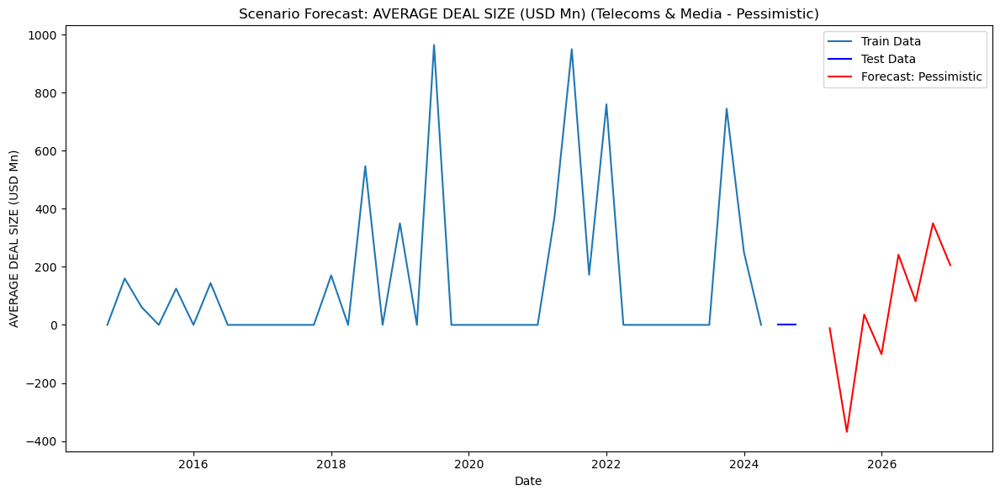

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.


Modeling SECONDARY BUYOUT for Telecoms & Media...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.64321D+00    |proj g|=  4.25882D+00

At iterate    5    f=  1.60160D+00    |proj g|=  5.48765D-01

At iterate   10    f=  1.54388D+00    |proj g|=  1.43458D+00

At iterate   15    f=  1.48429D+00    |proj g|=  1.02061D-01
  ys=-8.800E-02  -gs= 2.469E-03 BFGS update SKIPPED

At iterate   20    f=  1.43967D+00    |proj g|=  6.17935D-01

At iterate   25    f=  1.41881D+00    |proj g|=  7.11984D-01

At iterate   30    f=  1.38455D+00    |proj g|=  1.62109D-01

At iterate   35    f=  1.37733D+00    |proj g|=  1.62051D+00

At iterate   40    f=  1.33273D+00    |proj g|=  1.98355D+00

At iterate   45    f=  1.31541D+00    |proj g|=  1.36193D+00

At iterate   50    f=  1.28689D+00    |proj g|=  8.36060D+00

           * * *

Tit   = total number of iterat

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


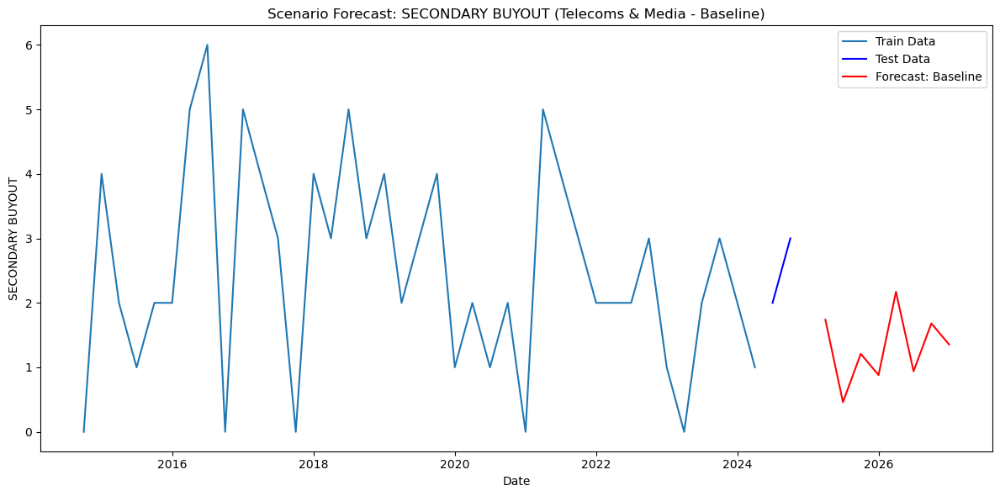

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


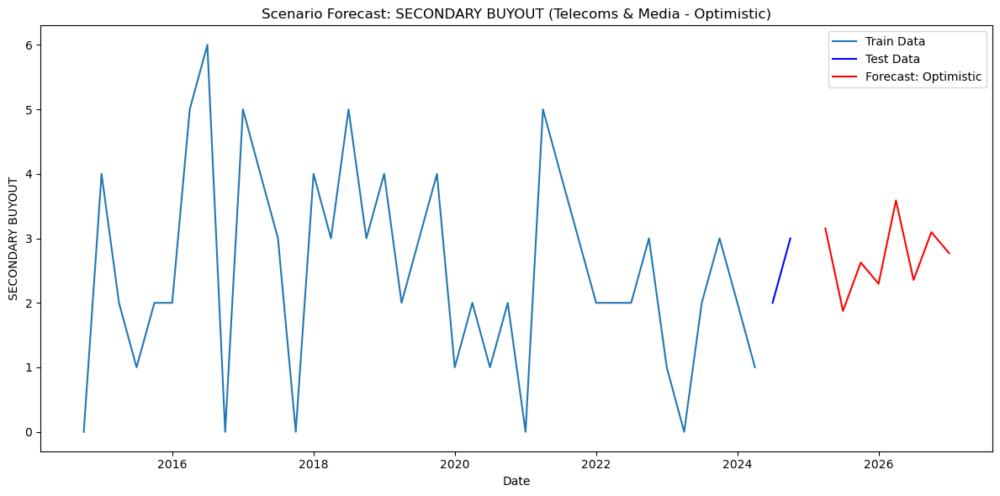

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


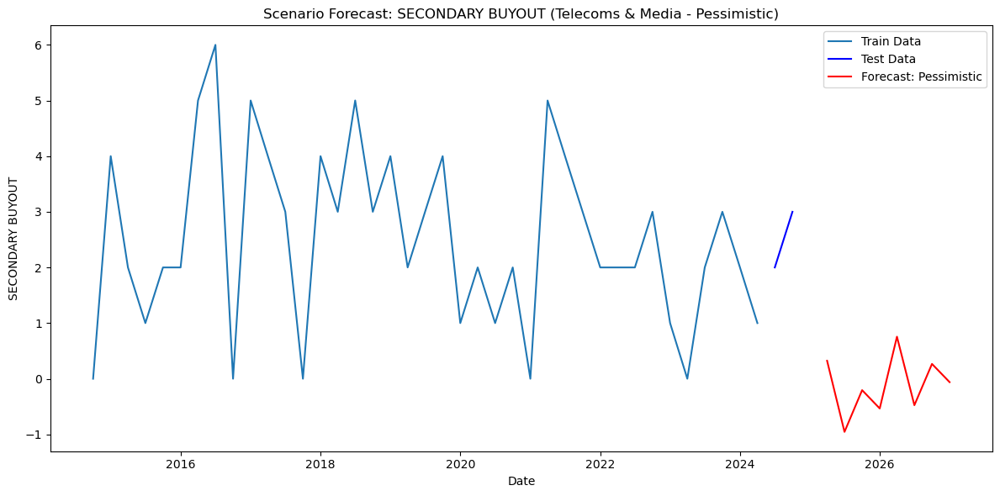

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Processing Industry: Consumer Discretionary...
Modeling NUMBER OF DEALS (aggregated) for Consumer Discretionary...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.25336D+00    |proj g|=  2.47301D+00

At iterate    5    f=  2.22764D+00    |proj g|=  2.01929D-01

At iterate   10    f=  2.20805D+00    |proj g|=  3.07584D-01

At iterate   15    f=  2.16924D+00    |proj g|=  1.18960D-01

At iterate   20    f=  2.15024D+00    |proj g|=  2.85812D-01

At iterate   25    f=  2.11177D+00    |proj g|=  6.00022D-02

At iterate   30    f=  2.08804D+00    |proj g|=  6.36277D-01

At iterate   35    f=  2.08320D+00    |proj g|=  2.38846D-01

At iterate   40    f=  2.08087D+00    |proj g|=  3.89202D-02

At iterate   45    f=  2.08059D+00    |proj g|=  3.17894D-02

At iterate   50    f=  2.08041D+00    |proj g|=  1.53190D-02

           * * *

Tit   = total num

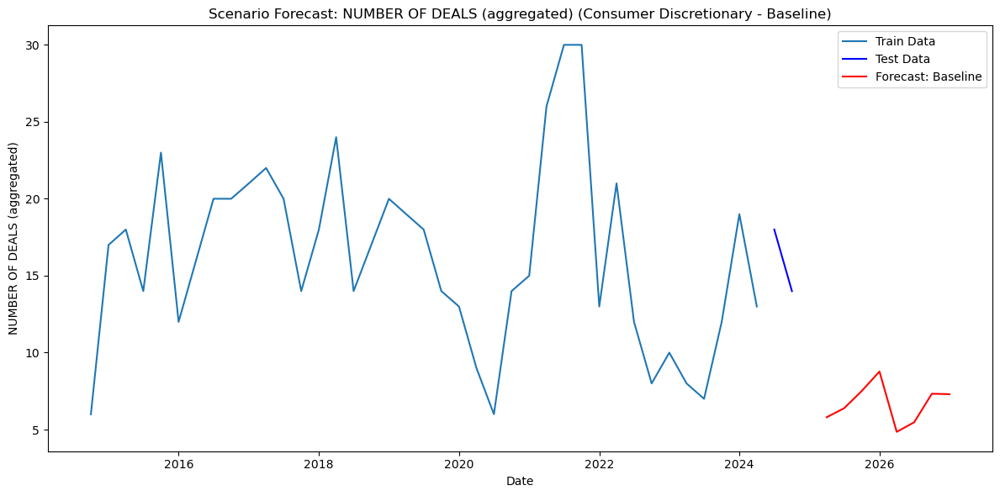

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


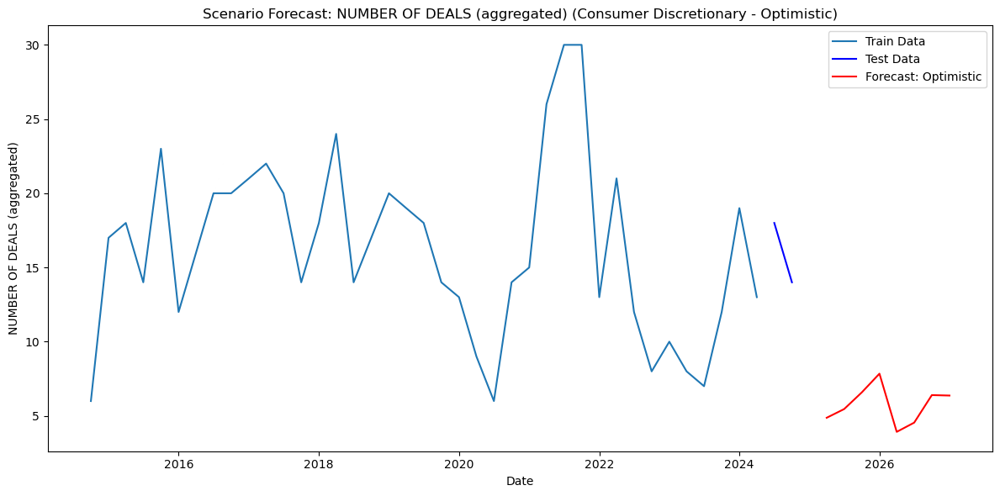

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


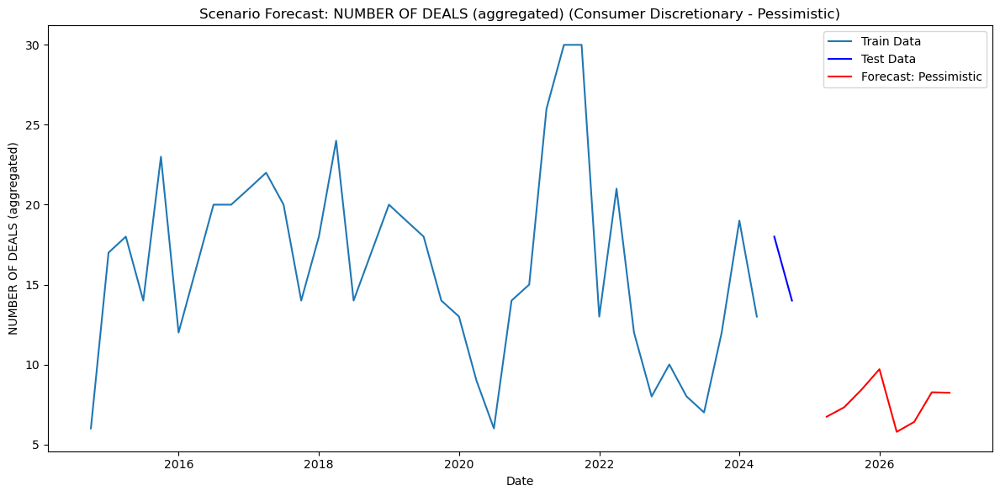

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling AGGREGATE DEAL VALUE (USD Bn) for Consumer Discretionary...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.84812D+00    |proj g|=  6.70442D+00

At iterate    5    f=  1.79473D+00    |proj g|=  3.51423D-01

At iterate   10    f=  1.74522D+00    |proj g|=  3.81879D-01

At iterate   15    f=  1.71928D+00    |proj g|=  1.21625D+00

At iterate   20    f=  1.70463D+00    |proj g|=  8.31596D-02

At iterate   25    f=  1.66815D+00    |proj g|=  1.46102D+00

At iterate   30    f=  1.66024D+00    |proj g|=  1.62032D-01

At iterate   35    f=  1.65899D+00    |proj g|=  5.01153D-01

At iterate   40    f=  1.65666D+00    |proj g|=  4.02580D-01

At iterate   45    f=  1.63981D+00    |proj g|=  2.22543D-01

At iterate   50    f=  1.63611D+00    |proj g|=  1.32947D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of func

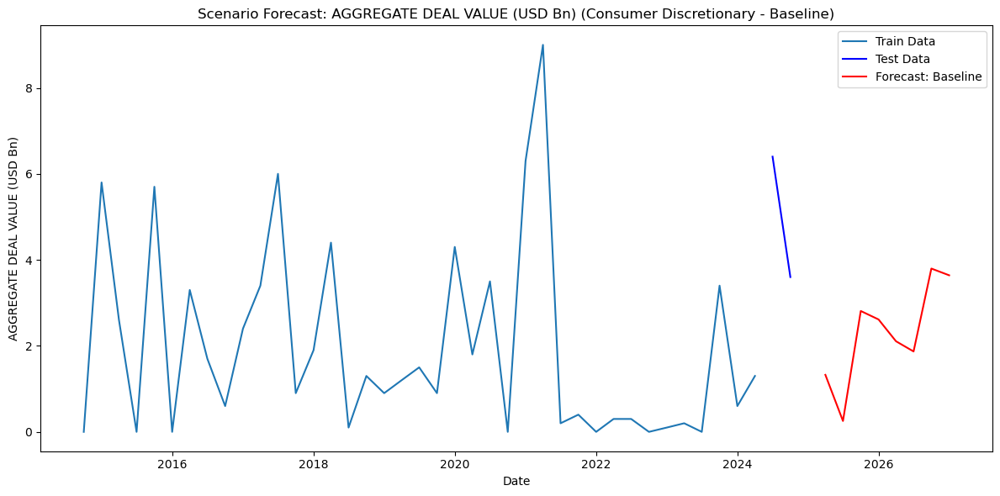

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


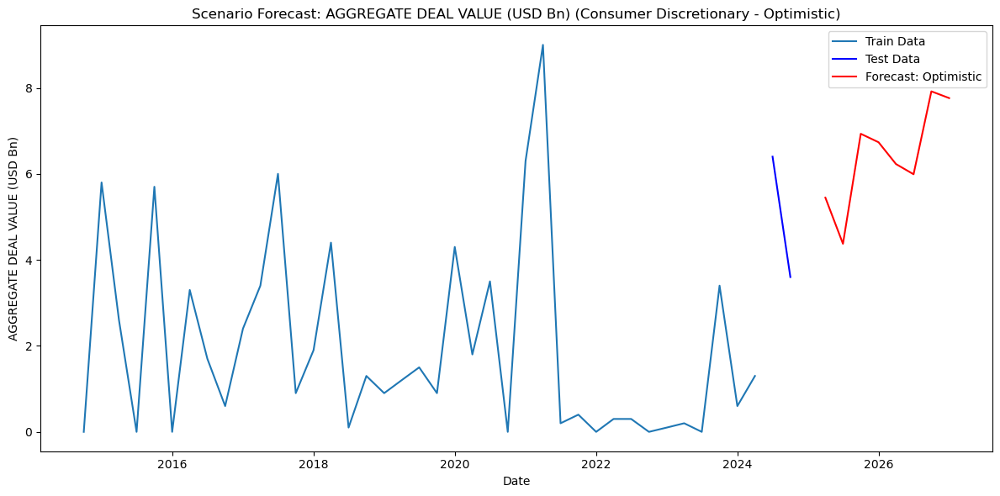

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


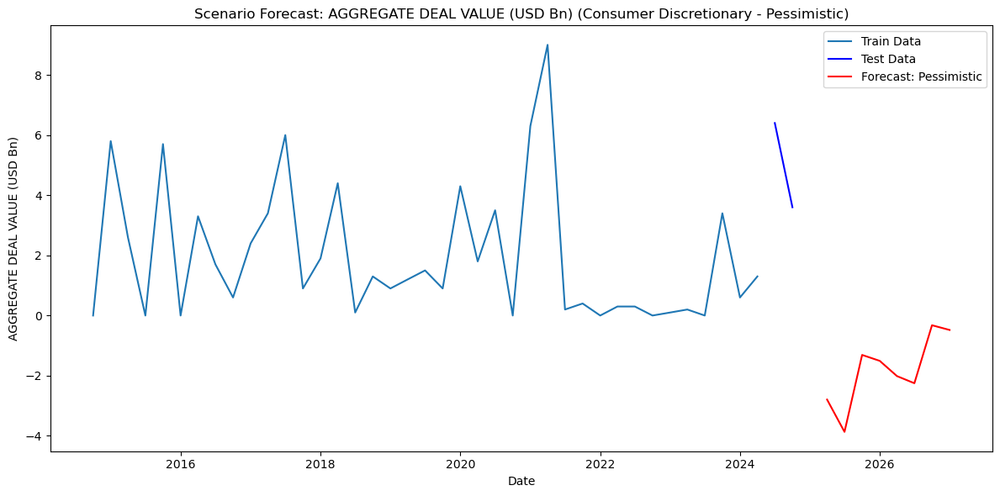

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling AVERAGE DEAL SIZE (USD Mn) for Consumer Discretionary...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.31993D+00    |proj g|=  5.73416D-02

At iterate    5    f=  5.28798D+00    |proj g|=  4.59584D-02

At iterate   10    f=  5.28481D+00    |proj g|=  2.62470D-03

At iterate   15    f=  5.28453D+00    |proj g|=  5.13633D-03

At iterate   20    f=  5.28437D+00    |proj g|=  1.00390D-03

At iterate   25    f=  5.28366D+00    |proj g|=  4.91440D-03

At iterate   30    f=  5.28286D+00    |proj g|=  5.17245D-03

At iterate   35    f=  5.26667D+00    |proj g|=  2.56619D-02

At iterate   40    f=  5.25955D+00    |proj g|=  2.84022D-03

At iterate   45    f=  5.25872D+00    |proj g|=  3.83331D-03

At iterate   50    f=  5.23470D+00    |proj g|=  2.02289D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of functio

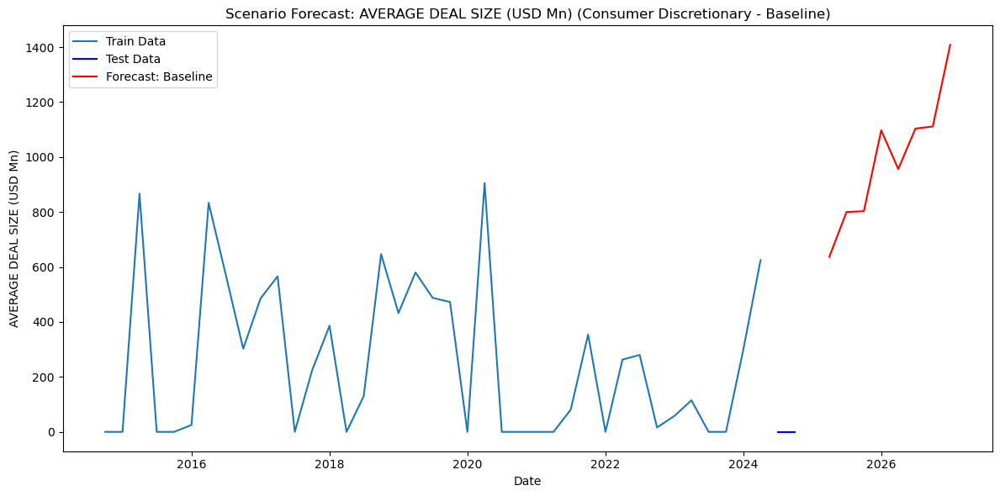

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


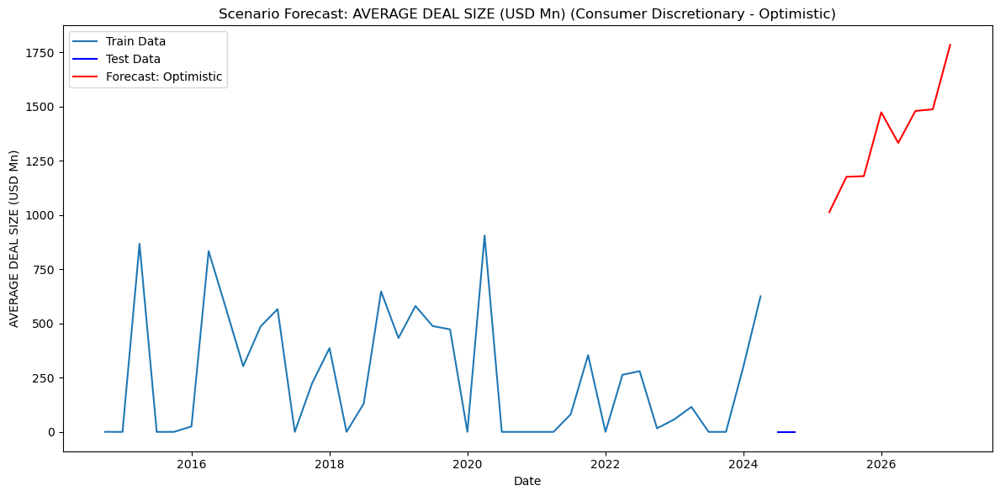

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


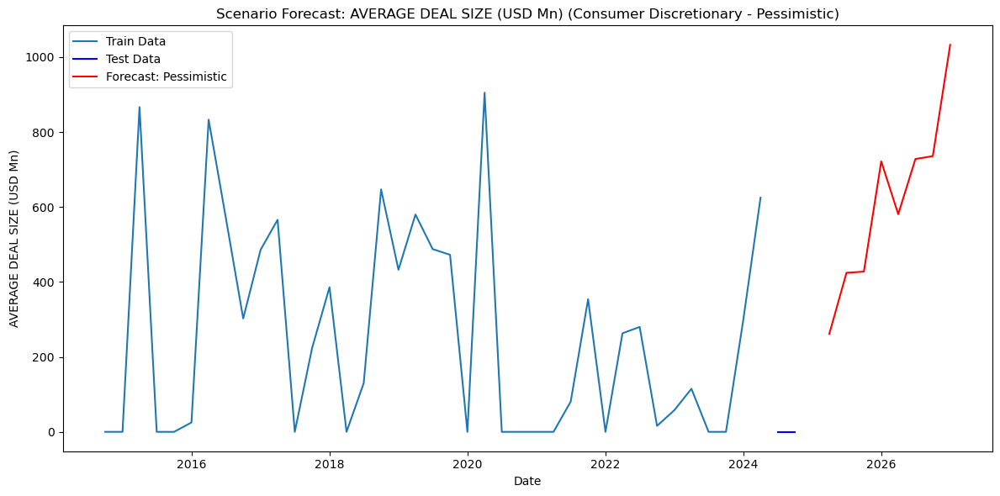

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling SECONDARY BUYOUT for Consumer Discretionary...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.25336D+00    |proj g|=  2.47301D+00

At iterate    5    f=  2.22764D+00    |proj g|=  2.01929D-01

At iterate   10    f=  2.20805D+00    |proj g|=  3.07584D-01

At iterate   15    f=  2.16924D+00    |proj g|=  1.18960D-01

At iterate   20    f=  2.15024D+00    |proj g|=  2.85812D-01

At iterate   25    f=  2.11177D+00    |proj g|=  6.00022D-02

At iterate   30    f=  2.08804D+00    |proj g|=  6.36277D-01

At iterate   35    f=  2.08320D+00    |proj g|=  2.38846D-01

At iterate   40    f=  2.08087D+00    |proj g|=  3.89202D-02

At iterate   45    f=  2.08059D+00    |proj g|=  3.17894D-02

At iterate   50    f=  2.08041D+00    |proj g|=  1.53190D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluati

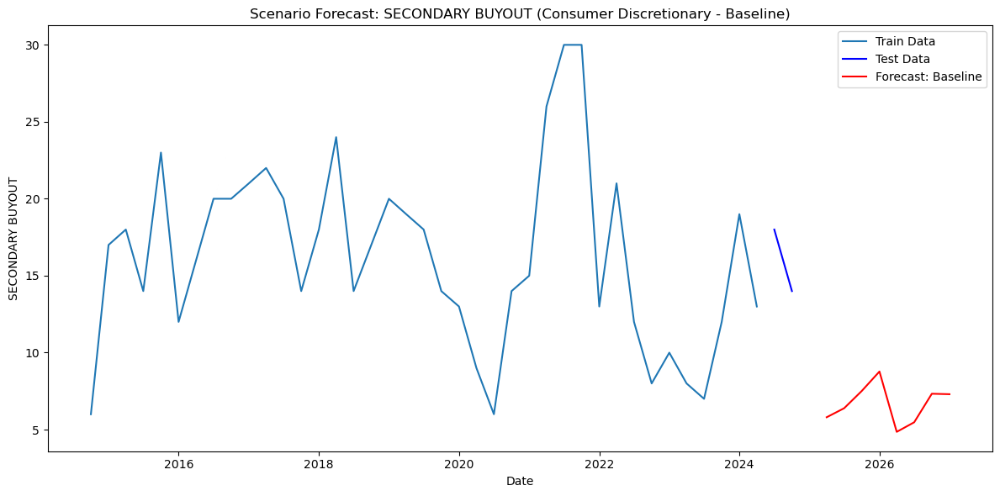

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


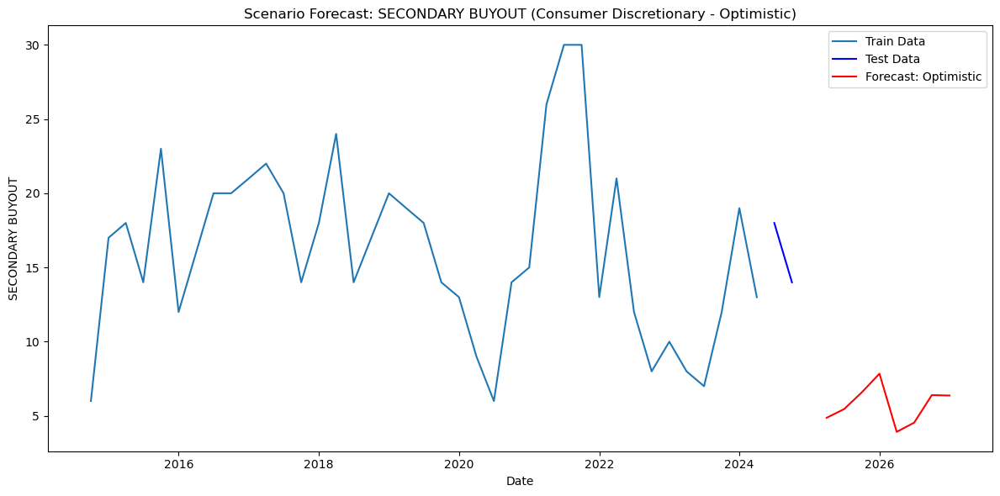

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


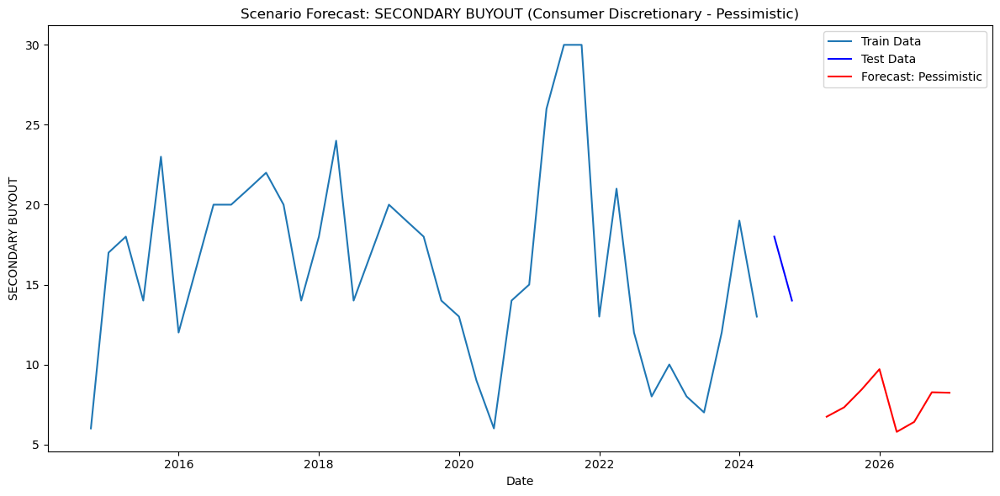

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Processing Industry: Energy & Utilities...
Modeling NUMBER OF DEALS (aggregated) for Energy & Utilities...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.72194D+00    |proj g|=  2.61120D+00

At iterate    5    f=  1.68918D+00    |proj g|=  1.27649D-01

At iterate   10    f=  1.62561D+00    |proj g|=  8.62898D-01

At iterate   15    f=  1.61901D+00    |proj g|=  1.68350D-01

At iterate   20    f=  1.57678D+00    |proj g|=  1.08345D+00

At iterate   25    f=  1.56569D+00    |proj g|=  8.25991D-01

At iterate   30    f=  1.55901D+00    |proj g|=  7.93536D-01

At iterate   35    f=  1.52596D+00    |proj g|=  3.24300D-01

At iterate   40    f=  1.52542D+00    |proj g|=  5.87730D-02

At iterate   45    f=  1.52427D+00    |proj g|=  1.15497D+00

At iterate   50    f=  1.52304D+00    |proj g|=  2.44185D-01

           * * *

Tit   = total number of i

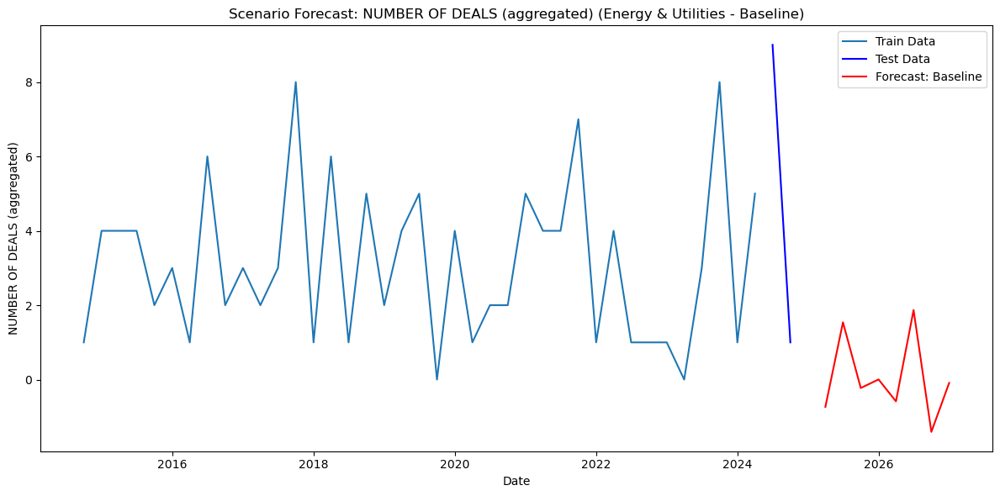

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


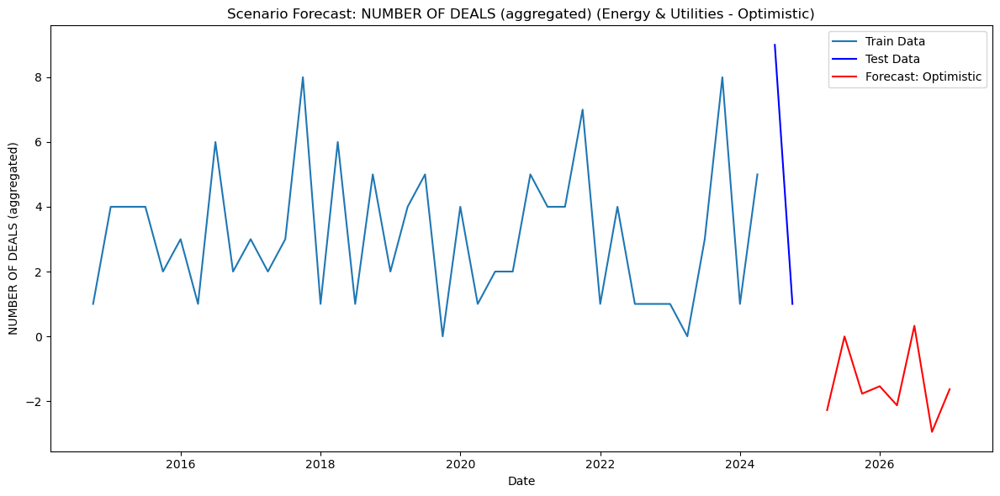

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


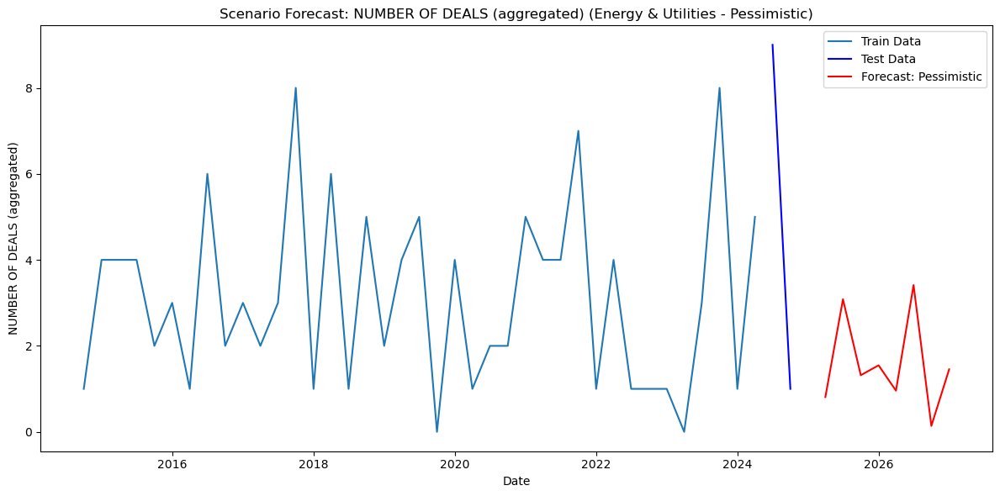

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling AGGREGATE DEAL VALUE (USD Bn) for Energy & Utilities...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.64432D+00    |proj g|=  1.81183D+00

At iterate    5    f=  1.62587D+00    |proj g|=  6.32091D-01

At iterate   10    f=  1.61690D+00    |proj g|=  1.40722D+00

At iterate   15    f=  1.61107D+00    |proj g|=  2.04182D-01

At iterate   20    f=  1.60595D+00    |proj g|=  4.30732D-01

At iterate   25    f=  1.57788D+00    |proj g|=  1.43377D+00

At iterate   30    f=  1.57651D+00    |proj g|=  4.68029D-01

At iterate   35    f=  1.54943D+00    |proj g|=  7.90646D+00

At iterate   40    f=  1.51383D+00    |proj g|=  7.40750D-01

At iterate   45    f=  1.51240D+00    |proj g|=  2.19107D-01

At iterate   50    f=  1.51132D+00    |proj g|=  4.26338D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function

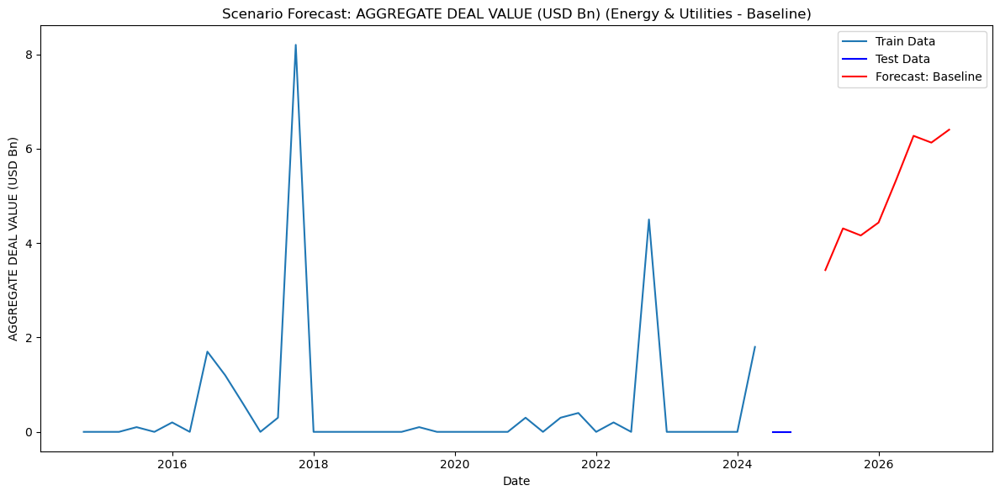

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


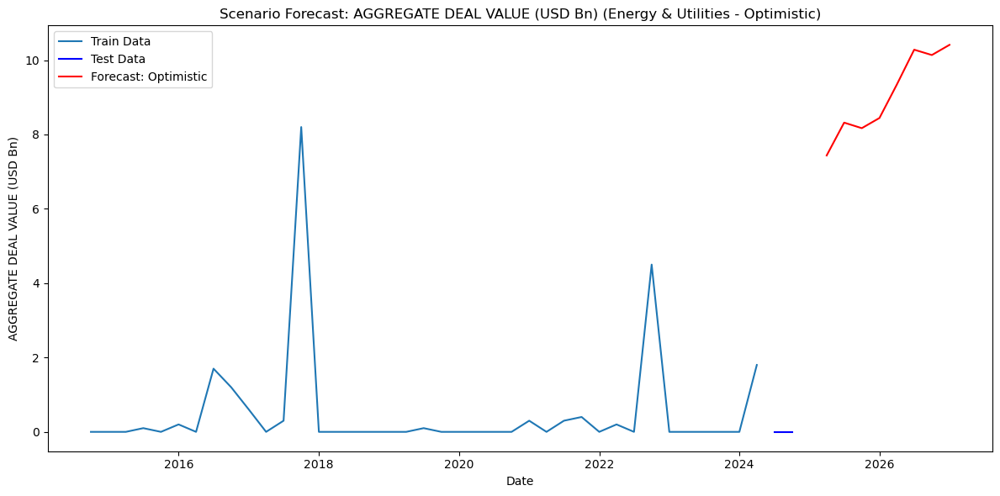

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


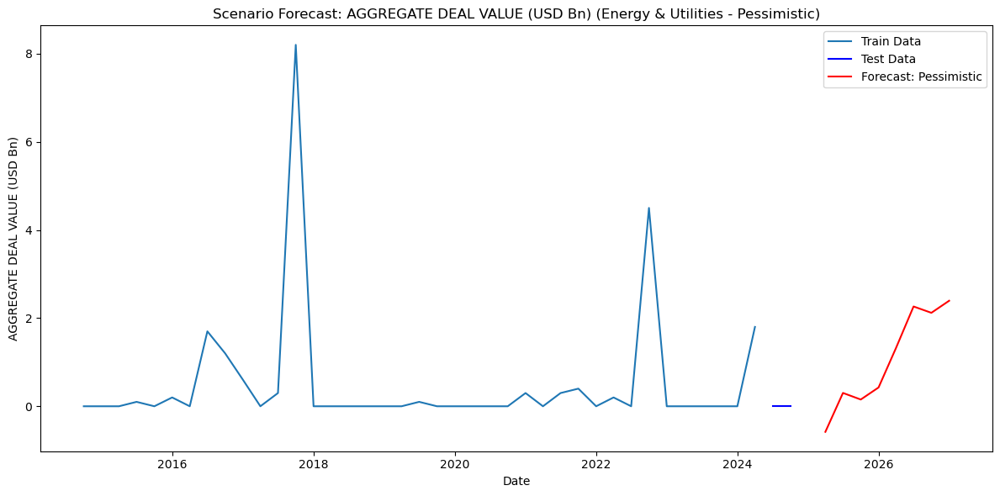

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling AVERAGE DEAL SIZE (USD Mn) for Energy & Utilities...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.02515D+00    |proj g|=  1.61065D-01

At iterate    5    f=  4.97593D+00    |proj g|=  3.29076D-02

At iterate   10    f=  4.97318D+00    |proj g|=  1.61636D-02

At iterate   15    f=  4.96944D+00    |proj g|=  2.19212D-02

At iterate   20    f=  4.96328D+00    |proj g|=  2.19358D-02

At iterate   25    f=  4.95276D+00    |proj g|=  3.95708D-02

At iterate   30    f=  4.94655D+00    |proj g|=  6.73588D-03

At iterate   35    f=  4.94400D+00    |proj g|=  3.51085D-03

At iterate   40    f=  4.94380D+00    |proj g|=  1.39940D-03

At iterate   45    f=  4.93944D+00    |proj g|=  3.15796D-02

At iterate   50    f=  4.88965D+00    |proj g|=  4.74100D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function ev

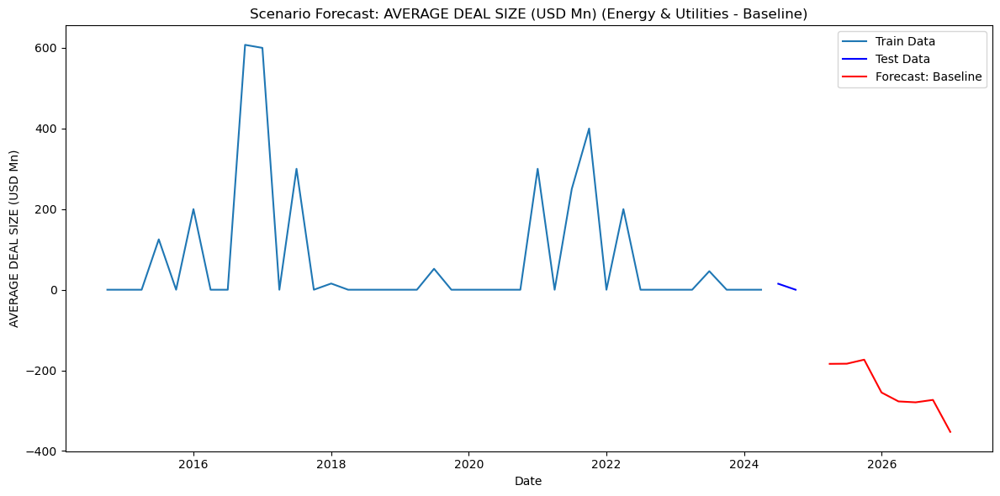

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


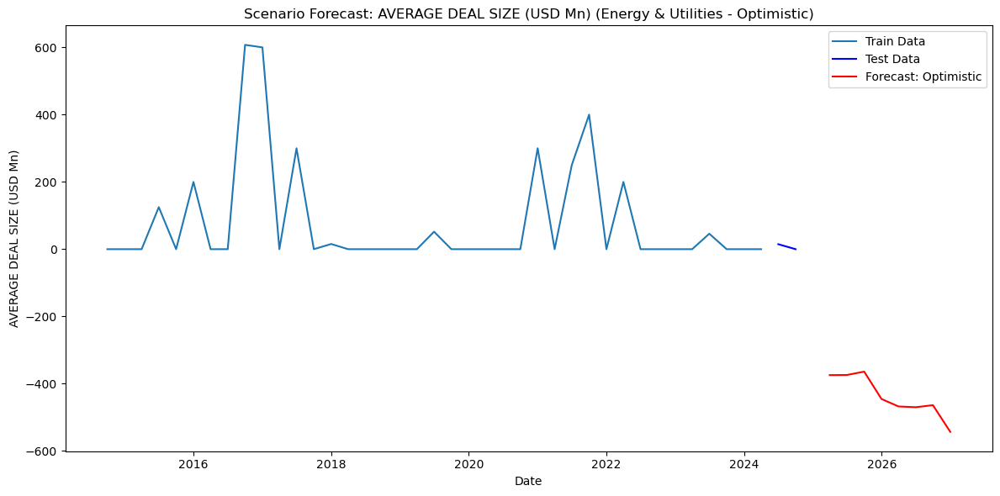

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


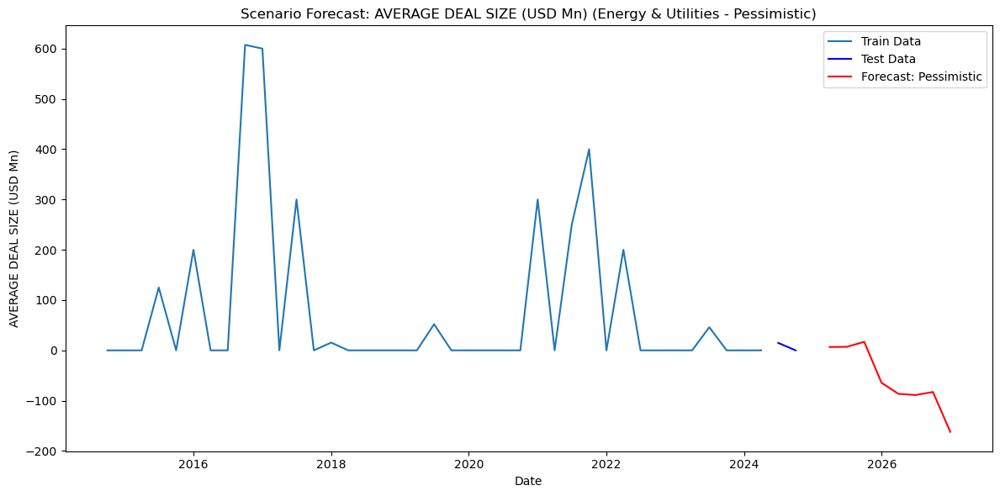

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.


Modeling SECONDARY BUYOUT for Energy & Utilities...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.72194D+00    |proj g|=  2.61120D+00

At iterate    5    f=  1.68918D+00    |proj g|=  1.27649D-01

At iterate   10    f=  1.62561D+00    |proj g|=  8.62898D-01

At iterate   15    f=  1.61901D+00    |proj g|=  1.68350D-01

At iterate   20    f=  1.57678D+00    |proj g|=  1.08345D+00

At iterate   25    f=  1.56569D+00    |proj g|=  8.25991D-01

At iterate   30    f=  1.55901D+00    |proj g|=  7.93536D-01

At iterate   35    f=  1.52596D+00    |proj g|=  3.24300D-01

At iterate   40    f=  1.52542D+00    |proj g|=  5.87730D-02

At iterate   45    f=  1.52427D+00    |proj g|=  1.15497D+00

At iterate   50    f=  1.52304D+00    |proj g|=  2.44185D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations


/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


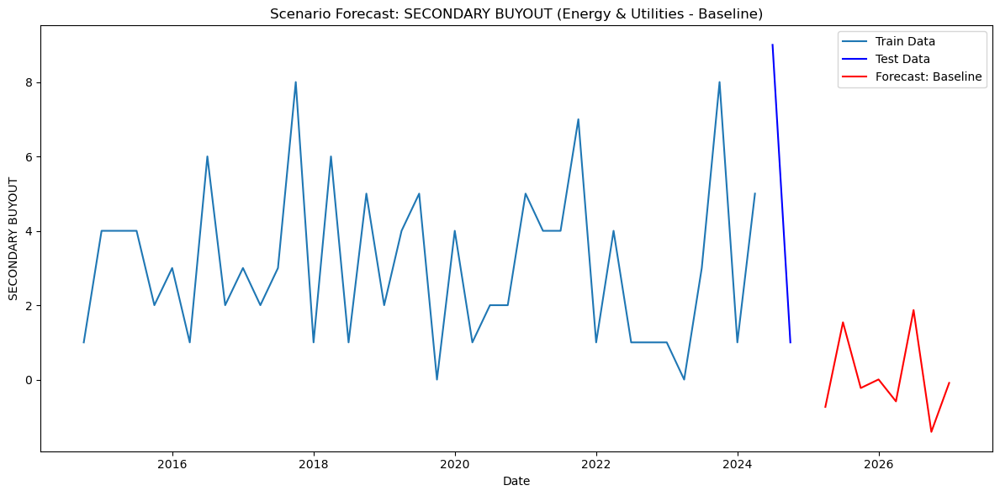

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


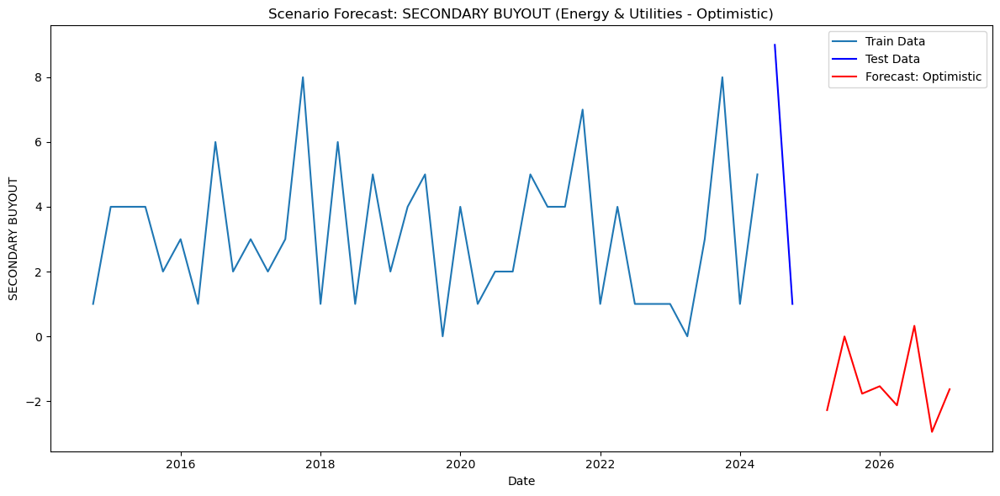

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


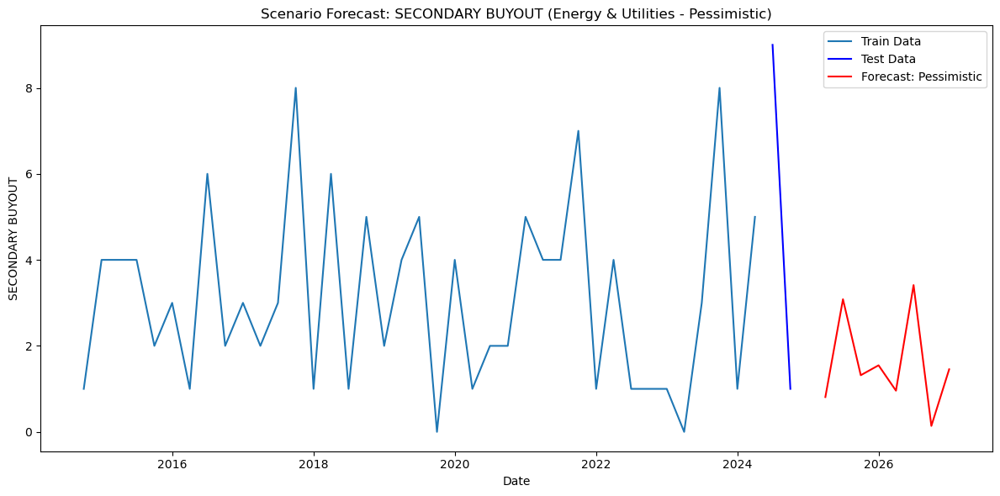

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Processing Industry: Industrials...
Modeling NUMBER OF DEALS (aggregated) for Industrials...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.01910D+00    |proj g|=  6.53751D-01

At iterate    5    f=  2.00491D+00    |proj g|=  1.64719D-01

At iterate   10    f=  1.96863D+00    |proj g|=  2.56324D-01

At iterate   15    f=  1.96083D+00    |proj g|=  1.34326D-01

At iterate   20    f=  1.88267D+00    |proj g|=  3.61049D+00

At iterate   25    f=  1.85204D+00    |proj g|=  2.21602D-01

At iterate   30    f=  1.83132D+00    |proj g|=  3.51038D-01

At iterate   35    f=  1.82855D+00    |proj g|=  8.59402D-01

At iterate   40    f=  1.81997D+00    |proj g|=  3.55084D-01

At iterate   45    f=  1.81272D+00    |proj g|=  9.10960D-02

At iterate   50    f=  1.81226D+00    |proj g|=  3.70112D-01

           * * *

Tit   = total number of iterations
Tnf 

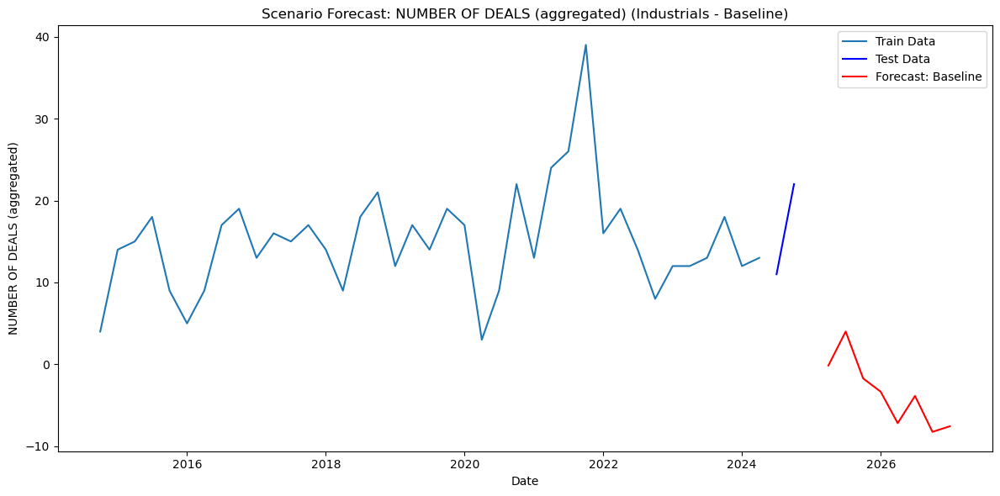

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


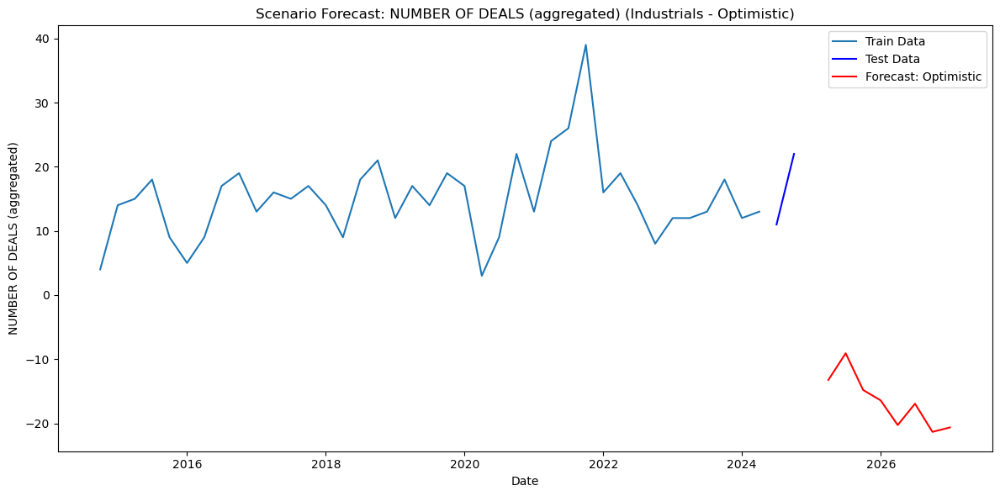

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


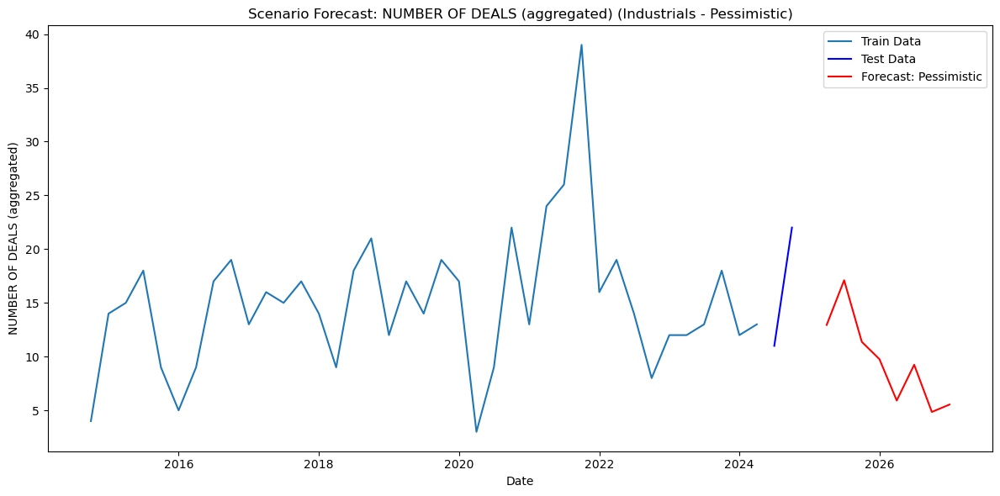

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling AGGREGATE DEAL VALUE (USD Bn) for Industrials...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.71233D+00    |proj g|=  2.78619D+00

At iterate    5    f=  1.65191D+00    |proj g|=  1.61857D-01

At iterate   10    f=  1.62462D+00    |proj g|=  5.26565D-01

At iterate   15    f=  1.58025D+00    |proj g|=  1.29549D-01

At iterate   20    f=  1.53726D+00    |proj g|=  6.32074D-01

At iterate   25    f=  1.53425D+00    |proj g|=  6.82458D-02

At iterate   30    f=  1.53105D+00    |proj g|=  2.46855D+00

At iterate   35    f=  1.51412D+00    |proj g|=  1.94005D-01

At iterate   40    f=  1.50878D+00    |proj g|=  6.95319D-01

At iterate   45    f=  1.49963D+00    |proj g|=  1.92822D+00

At iterate   50    f=  1.49004D+00    |proj g|=  3.52088D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evalua

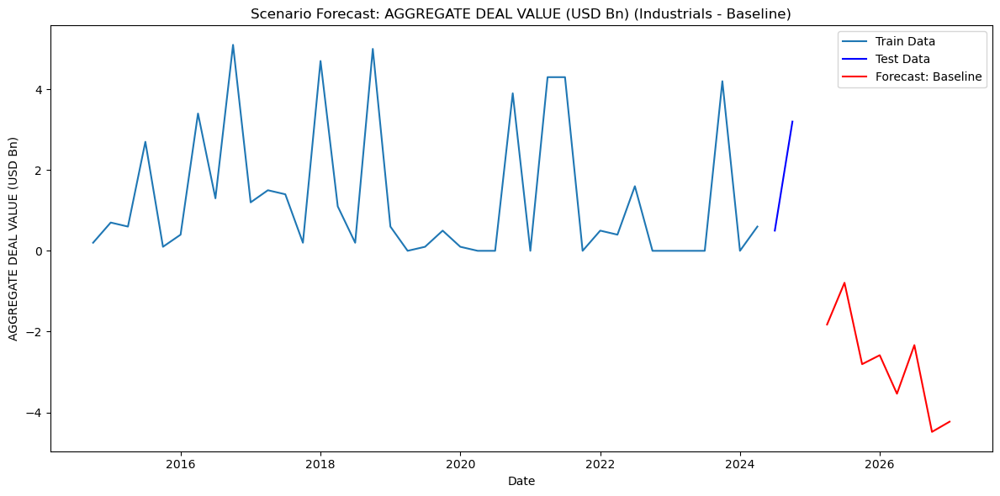

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


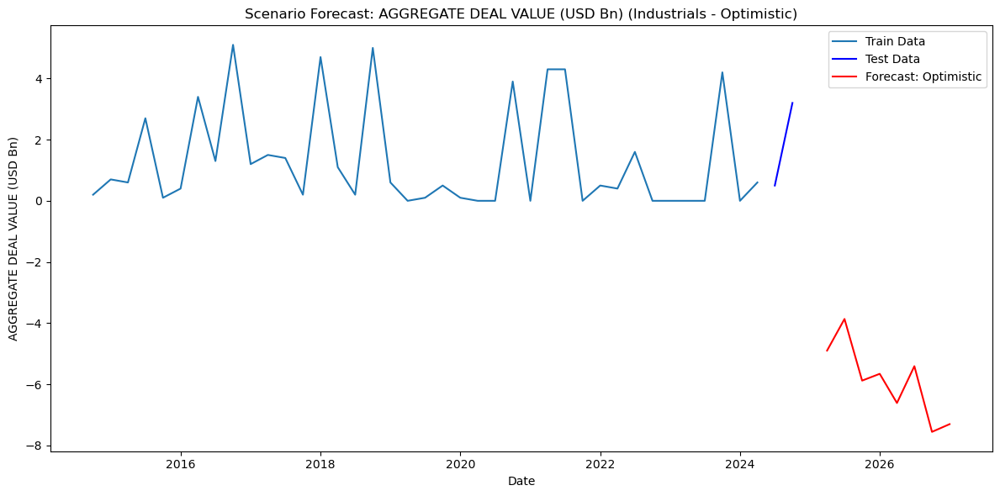

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


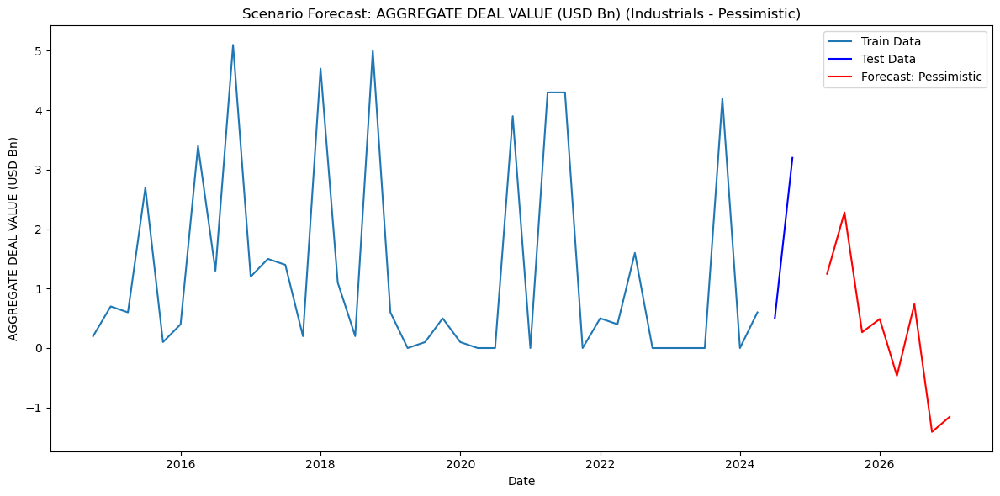

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling AVERAGE DEAL SIZE (USD Mn) for Industrials...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.15704D+00    |proj g|=  5.58431D-02

At iterate    5    f=  5.12125D+00    |proj g|=  9.69784D-03

At iterate   10    f=  5.11429D+00    |proj g|=  7.33465D-03

At iterate   15    f=  5.11316D+00    |proj g|=  7.58333D-03

At iterate   20    f=  5.10576D+00    |proj g|=  2.22731D-02

At iterate   25    f=  5.10187D+00    |proj g|=  1.16100D-02

At iterate   30    f=  5.09949D+00    |proj g|=  1.40990D-03

At iterate   35    f=  5.09893D+00    |proj g|=  3.86801D-03

At iterate   40    f=  5.07984D+00    |proj g|=  3.44866D-02

At iterate   45    f=  4.95179D+00    |proj g|=  1.08269D-01

At iterate   50    f=  4.92193D+00    |proj g|=  2.06379D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluatio

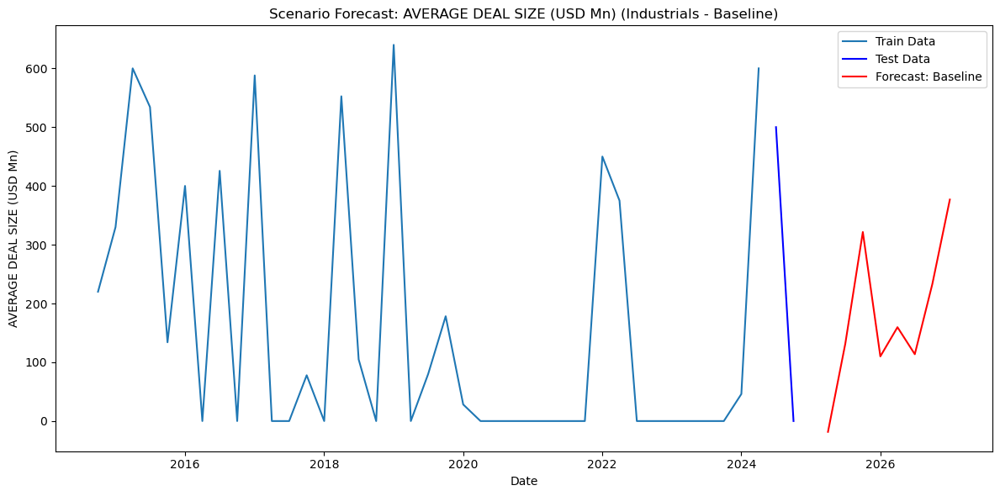

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


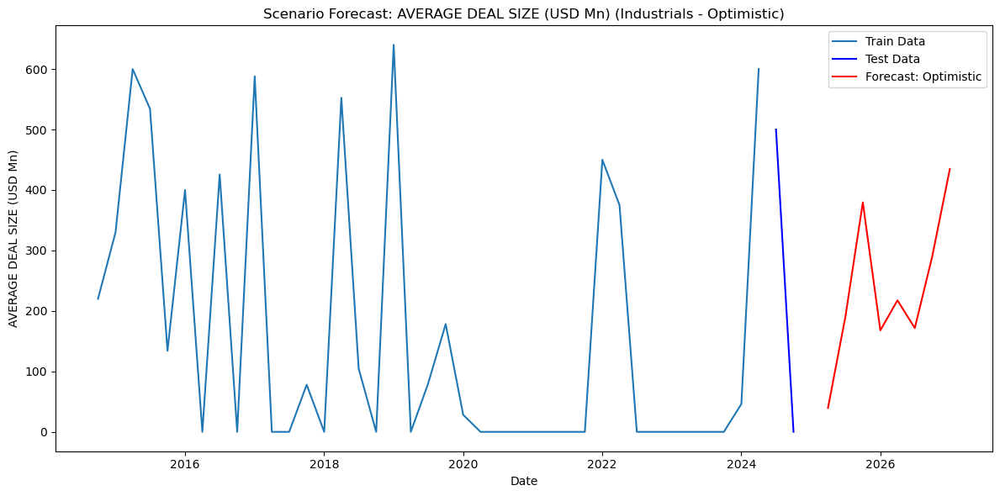

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


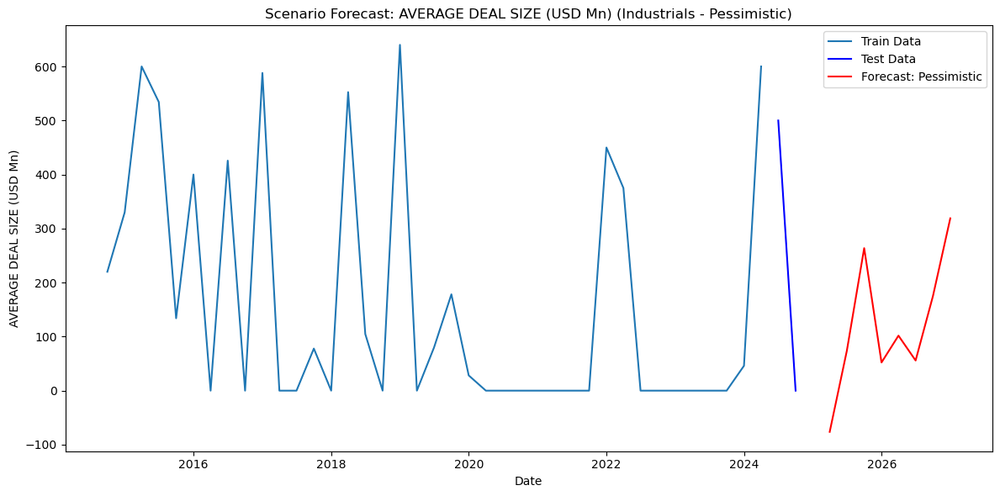

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling SECONDARY BUYOUT for Industrials...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.01910D+00    |proj g|=  6.53751D-01

At iterate    5    f=  2.00491D+00    |proj g|=  1.64719D-01

At iterate   10    f=  1.96863D+00    |proj g|=  2.56324D-01

At iterate   15    f=  1.96083D+00    |proj g|=  1.34326D-01

At iterate   20    f=  1.88267D+00    |proj g|=  3.61049D+00

At iterate   25    f=  1.85204D+00    |proj g|=  2.21602D-01

At iterate   30    f=  1.83132D+00    |proj g|=  3.51038D-01

At iterate   35    f=  1.82855D+00    |proj g|=  8.59402D-01

At iterate   40    f=  1.81997D+00    |proj g|=  3.55084D-01

At iterate   45    f=  1.81272D+00    |proj g|=  9.10960D-02

At iterate   50    f=  1.81226D+00    |proj g|=  3.70112D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint =

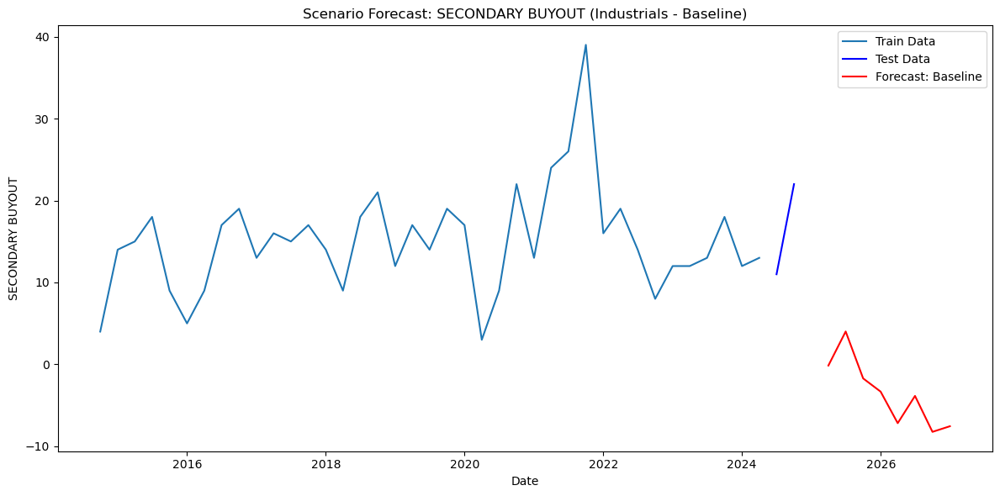

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


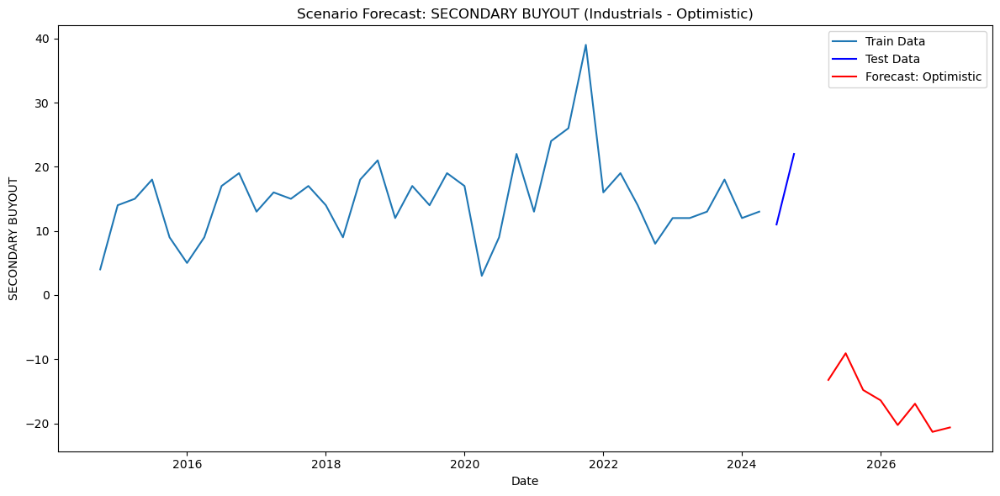

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


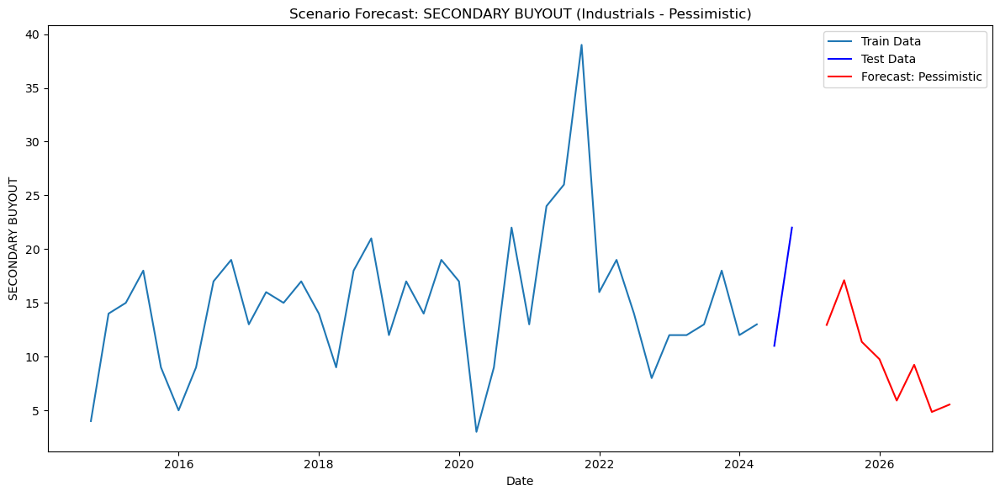

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Processing Industry: Information Technology...
Modeling NUMBER OF DEALS (aggregated) for Information Technology...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.22544D+00    |proj g|=  6.79383D-01

At iterate    5    f=  2.20857D+00    |proj g|=  3.00203D-01

At iterate   10    f=  2.19811D+00    |proj g|=  1.11772D-01

At iterate   15    f=  2.16635D+00    |proj g|=  1.39495D+00

At iterate   20    f=  2.14045D+00    |proj g|=  1.56397D-01

At iterate   25    f=  2.12924D+00    |proj g|=  1.32480D-01

At iterate   30    f=  2.11258D+00    |proj g|=  3.23301D-01

At iterate   35    f=  2.10997D+00    |proj g|=  4.24557D-01

At iterate   40    f=  2.10788D+00    |proj g|=  1.83233D-01

At iterate   45    f=  2.10492D+00    |proj g|=  1.45351D-01

At iterate   50    f=  2.10443D+00    |proj g|=  1.45804D-02

           * * *

Tit   = total num

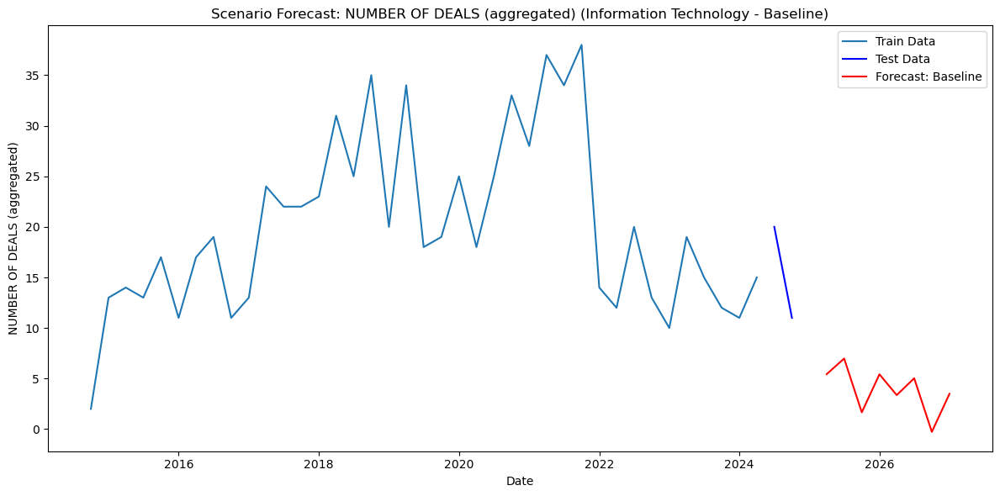

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


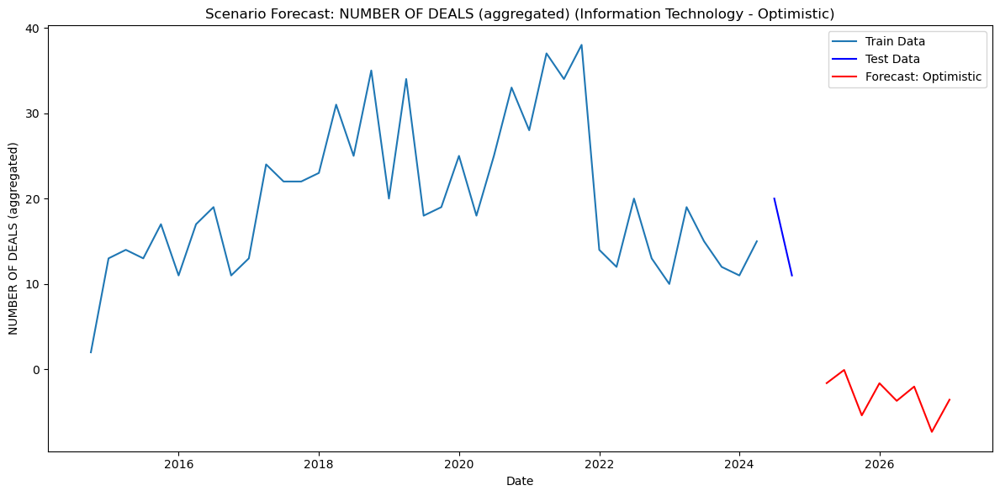

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


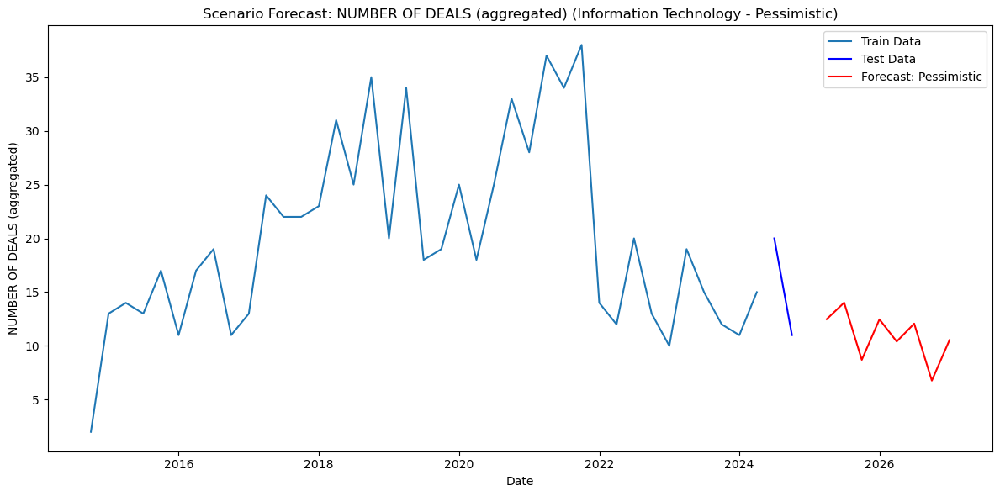

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling AGGREGATE DEAL VALUE (USD Bn) for Information Technology...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.37307D+00    |proj g|=  7.98997D-01

At iterate    5    f=  2.34555D+00    |proj g|=  1.37939D-01

At iterate   10    f=  2.33502D+00    |proj g|=  5.09711D-01

At iterate   15    f=  2.33227D+00    |proj g|=  7.60268D-02

At iterate   20    f=  2.32868D+00    |proj g|=  2.92366D-01

At iterate   25    f=  2.32121D+00    |proj g|=  1.82207D-01

At iterate   30    f=  2.31275D+00    |proj g|=  1.10967D-01

At iterate   35    f=  2.30801D+00    |proj g|=  1.56913D-01

At iterate   40    f=  2.29328D+00    |proj g|=  8.52531D-02

At iterate   45    f=  2.28998D+00    |proj g|=  5.95941D-02

At iterate   50    f=  2.28820D+00    |proj g|=  7.01697D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of func

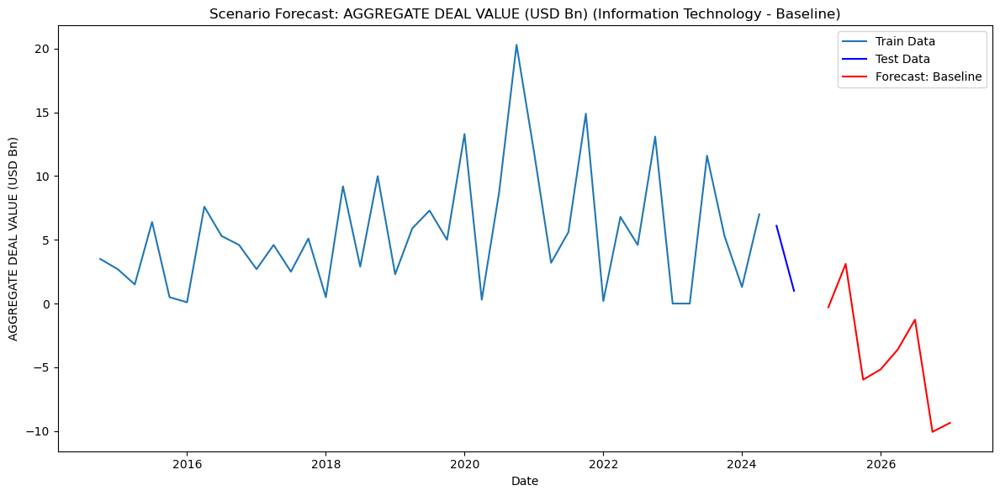

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


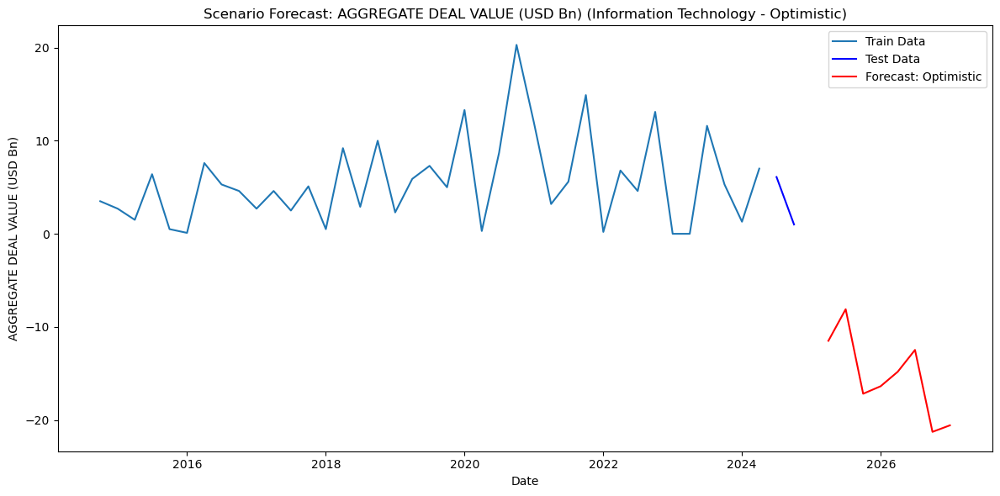

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


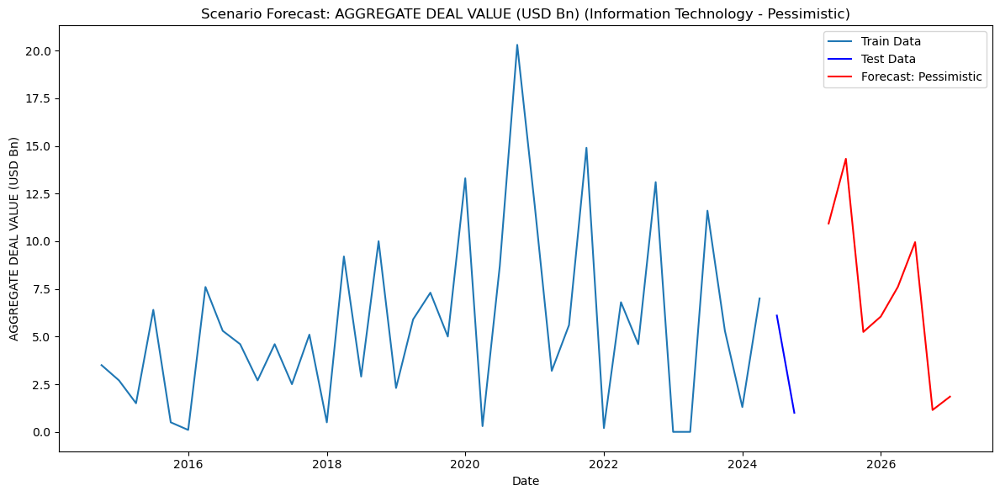

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling AVERAGE DEAL SIZE (USD Mn) for Information Technology...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.37660D+00    |proj g|=  4.02946D-02

At iterate    5    f=  5.32627D+00    |proj g|=  7.65314D-03

At iterate   10    f=  5.32280D+00    |proj g|=  1.43635D-02

At iterate   15    f=  5.31840D+00    |proj g|=  5.24681D-03

At iterate   20    f=  5.31760D+00    |proj g|=  6.02858D-03

At iterate   25    f=  5.31580D+00    |proj g|=  4.57089D-03

At iterate   30    f=  5.31531D+00    |proj g|=  5.08676D-03

At iterate   35    f=  5.30674D+00    |proj g|=  1.70062D-02

At iterate   40    f=  5.30498D+00    |proj g|=  1.20626D-03

At iterate   45    f=  5.30030D+00    |proj g|=  1.09369D-02

At iterate   50    f=  5.26724D+00    |proj g|=  1.06529D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of functio

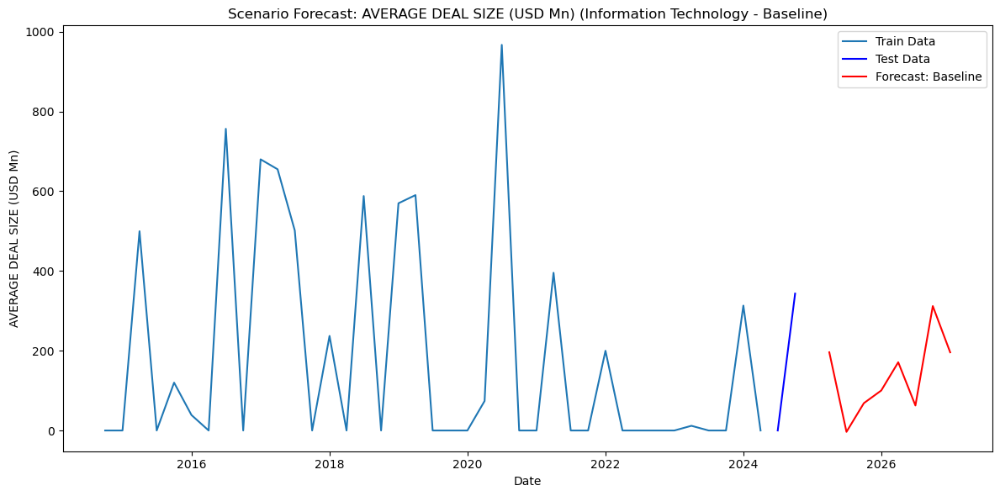

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


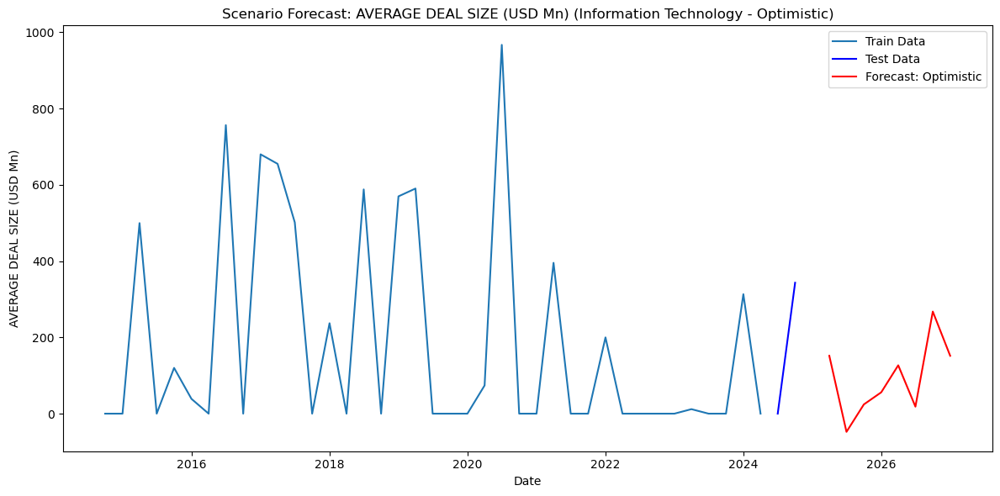

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


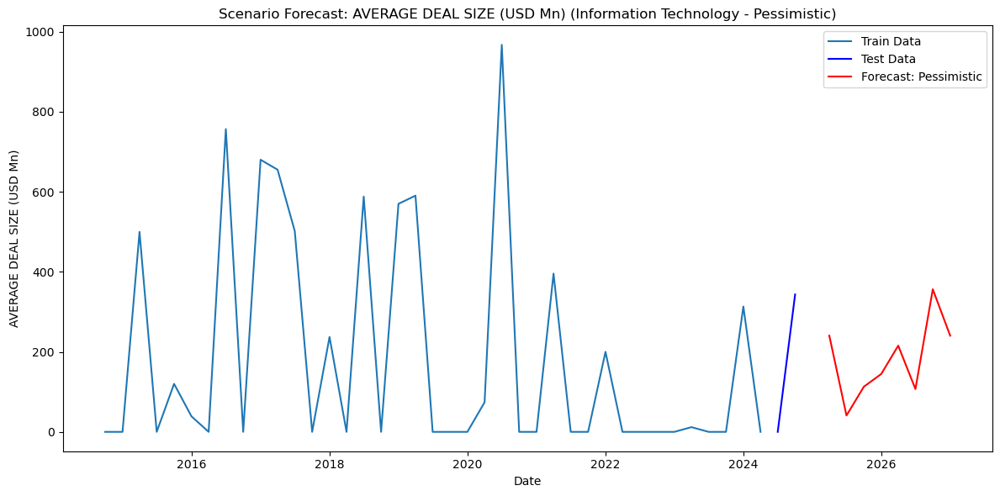

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling SECONDARY BUYOUT for Information Technology...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.22544D+00    |proj g|=  6.79383D-01

At iterate    5    f=  2.20857D+00    |proj g|=  3.00203D-01

At iterate   10    f=  2.19811D+00    |proj g|=  1.11772D-01

At iterate   15    f=  2.16635D+00    |proj g|=  1.39495D+00

At iterate   20    f=  2.14045D+00    |proj g|=  1.56397D-01

At iterate   25    f=  2.12924D+00    |proj g|=  1.32480D-01

At iterate   30    f=  2.11258D+00    |proj g|=  3.23301D-01

At iterate   35    f=  2.10997D+00    |proj g|=  4.24557D-01

At iterate   40    f=  2.10788D+00    |proj g|=  1.83233D-01

At iterate   45    f=  2.10492D+00    |proj g|=  1.45351D-01

At iterate   50    f=  2.10443D+00    |proj g|=  1.45804D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluati

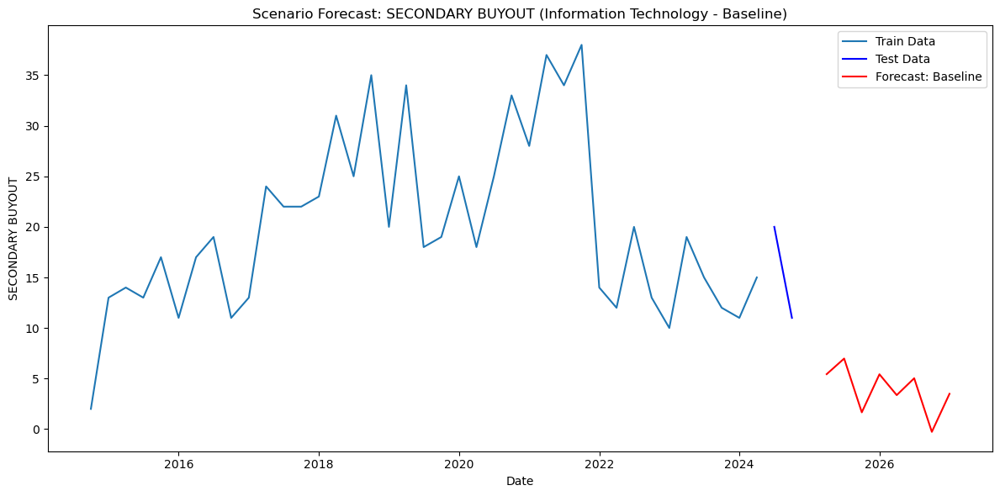

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


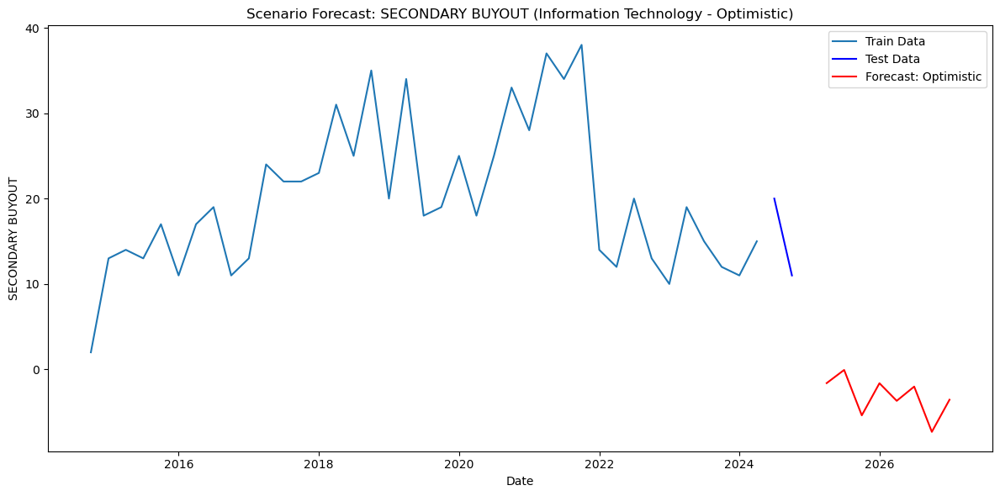

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


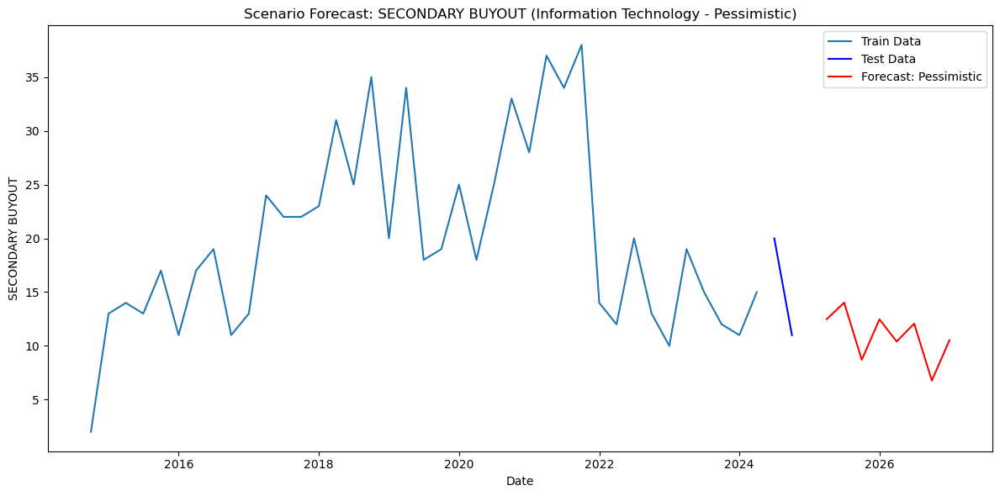

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.


Processing Industry: Raw Materials & Natural Resources...
Modeling NUMBER OF DEALS (aggregated) for Raw Materials & Natural Resources...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.91155D+00    |proj g|=  2.99687D+00

At iterate    5    f=  1.89523D+00    |proj g|=  2.78323D-01

At iterate   10    f=  1.86925D+00    |proj g|=  2.23298D-01

At iterate   15    f=  1.84680D+00    |proj g|=  7.79504D-01

At iterate   20    f=  1.80868D+00    |proj g|=  1.48231D-01

At iterate   25    f=  1.76187D+00    |proj g|=  2.08910D+00

At iterate   30    f=  1.73815D+00    |proj g|=  1.51981D-01

At iterate   35    f=  1.72995D+00    |proj g|=  7.88103D-02

At iterate   40    f=  1.71920D+00    |proj g|=  1.54711D+00

At iterate   45    f=  1.69167D+00    |proj g|=  2.52235D-01

At iterate   50    f=  1.69050D+00    |proj g|=  3.79174D-02

           * 

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


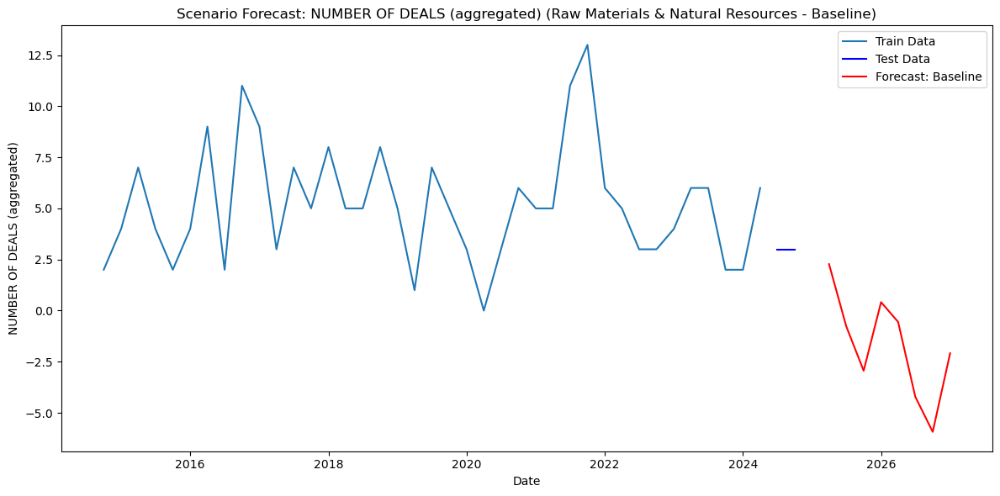

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


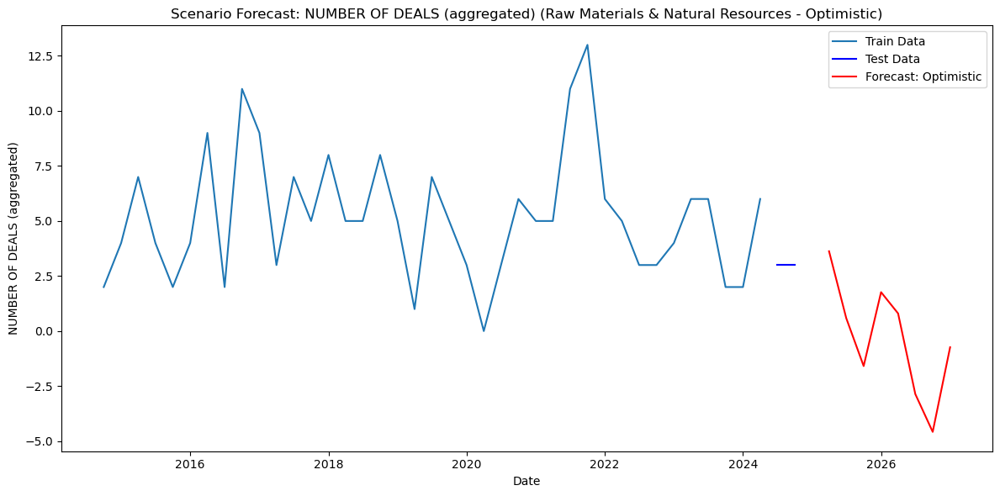

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


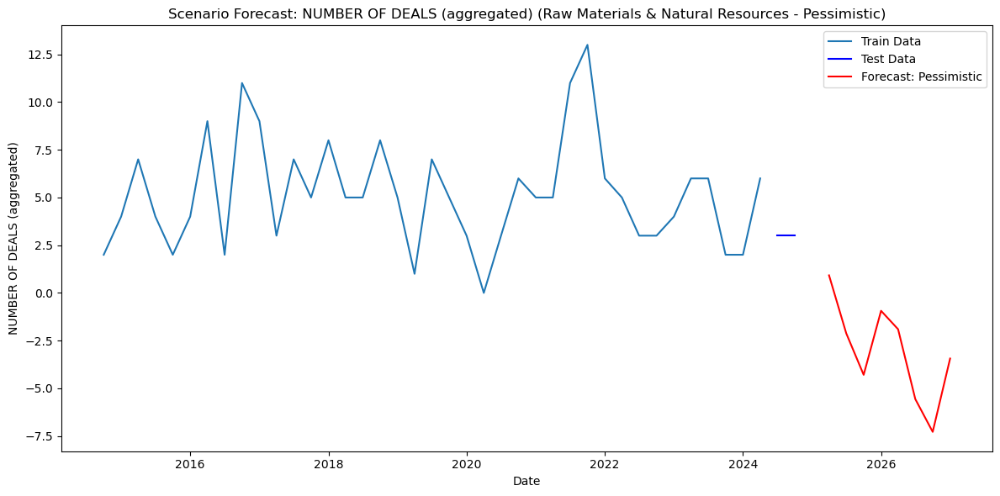

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Modeling AGGREGATE DEAL VALUE (USD Bn) for Raw Materials & Natural Resources...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.90594D+00    |proj g|=  1.34935D+00

At iterate    5    f=  1.86272D+00    |proj g|=  1.17171D+00

At iterate   10    f=  1.69040D+00    |proj g|=  2.42767D-01

At iterate   15    f=  1.67135D+00    |proj g|=  4.39381D-01

At iterate   20    f=  1.65022D+00    |proj g|=  2.02058D+00

At iterate   25    f=  1.57455D+00    |proj g|=  3.59995D+00

At iterate   30    f=  1.55951D+00    |proj g|=  1.50610D-01

At iterate   35    f=  1.49617D+00    |proj g|=  1.78900D+01

At iterate   40    f=  1.43212D+00    |proj g|=  8.07841D-01

At iterate   45    f=  1.42260D+00    |proj g|=  7.62206D-01

At iterate   50    f=  1.41773D+00    |proj g|=  2.21474D+00

           * * *

Tit   = total number of iterations
Tnf   = total num

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


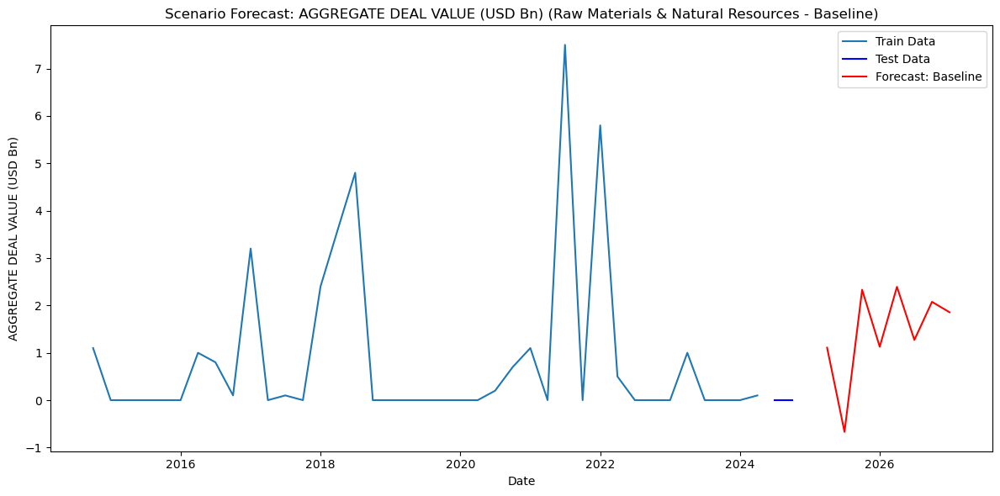

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


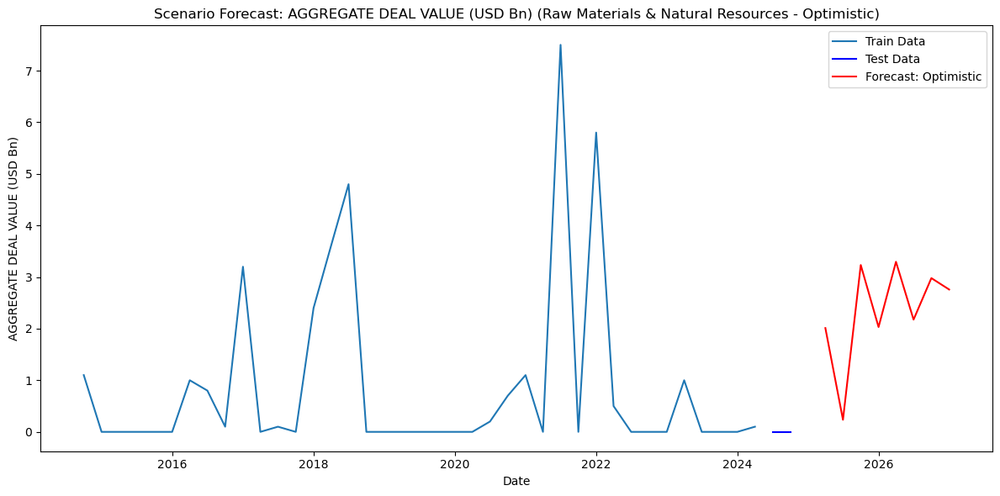

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


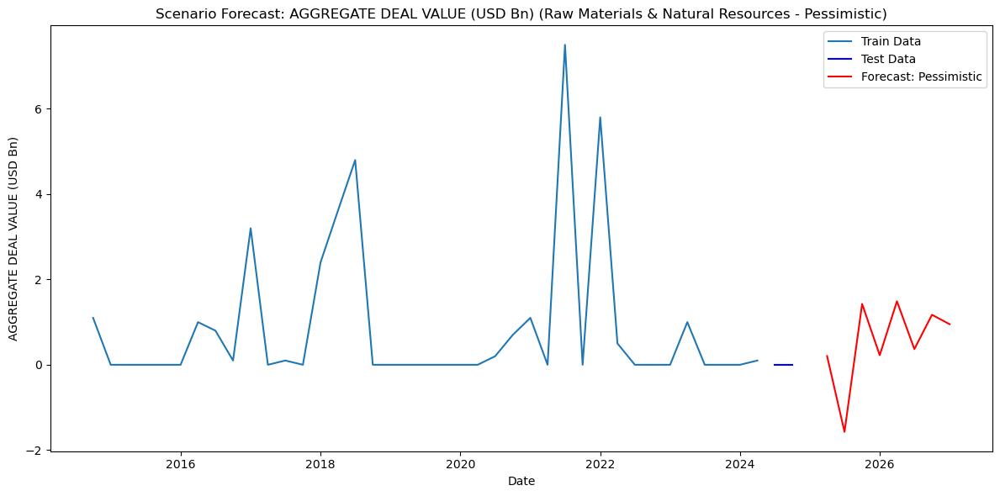

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling AVERAGE DEAL SIZE (USD Mn) for Raw Materials & Natural Resources...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.05619D+00    |proj g|=  1.12234D-01

At iterate    5    f=  5.01046D+00    |proj g|=  1.94260D-02

At iterate   10    f=  5.00509D+00    |proj g|=  2.12026D-02

At iterate   15    f=  4.99974D+00    |proj g|=  4.77136D-03

At iterate   20    f=  4.99887D+00    |proj g|=  1.11199D-03

At iterate   25    f=  4.99715D+00    |proj g|=  2.24529D-02

At iterate   30    f=  4.97680D+00    |proj g|=  2.84633D-02

At iterate   35    f=  4.97291D+00    |proj g|=  2.17699D-03

At iterate   40    f=  4.97198D+00    |proj g|=  1.72116D-02

At iterate   45    f=  4.95602D+00    |proj g|=  4.67909D-02

At iterate   50    f=  4.93530D+00    |proj g|=  1.37299D-02

           * * *

Tit   = total number of iterations
Tnf   = total number

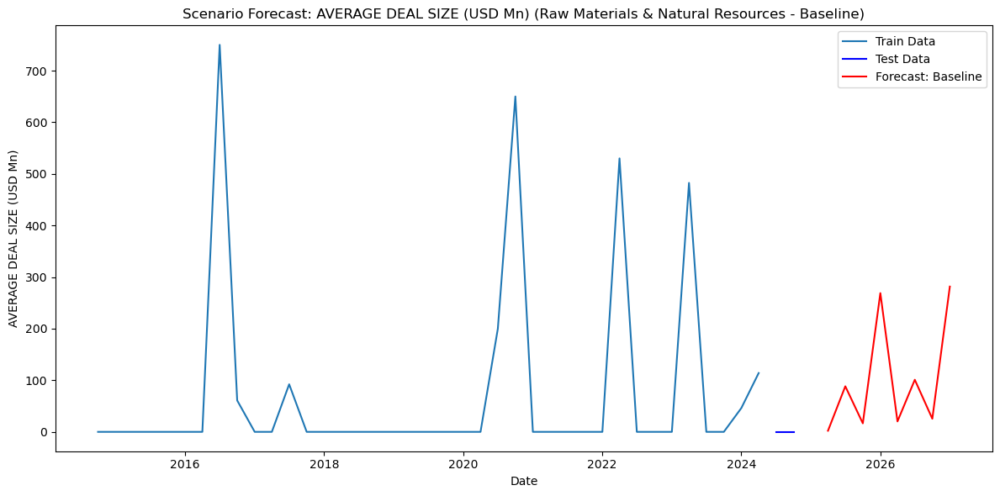

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


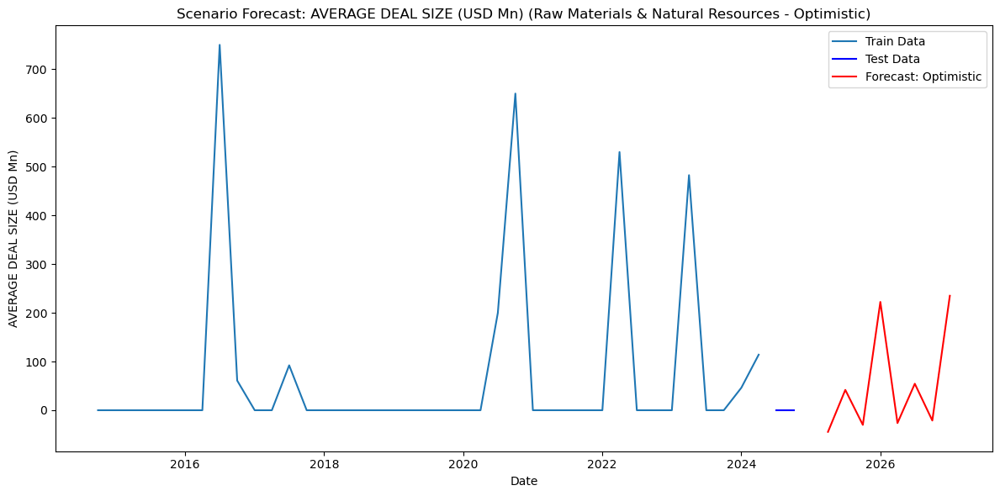

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


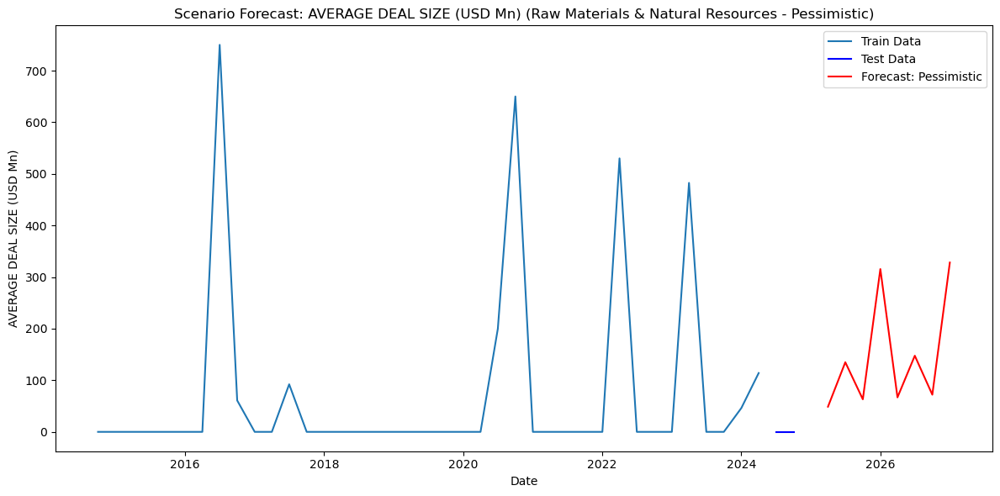

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling SECONDARY BUYOUT for Raw Materials & Natural Resources...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.91155D+00    |proj g|=  2.99687D+00

At iterate    5    f=  1.89523D+00    |proj g|=  2.78323D-01

At iterate   10    f=  1.86925D+00    |proj g|=  2.23298D-01

At iterate   15    f=  1.84680D+00    |proj g|=  7.79504D-01

At iterate   20    f=  1.80868D+00    |proj g|=  1.48231D-01

At iterate   25    f=  1.76187D+00    |proj g|=  2.08910D+00

At iterate   30    f=  1.73815D+00    |proj g|=  1.51981D-01

At iterate   35    f=  1.72995D+00    |proj g|=  7.88103D-02

At iterate   40    f=  1.71920D+00    |proj g|=  1.54711D+00

At iterate   45    f=  1.69167D+00    |proj g|=  2.52235D-01

At iterate   50    f=  1.69050D+00    |proj g|=  3.79174D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of functi

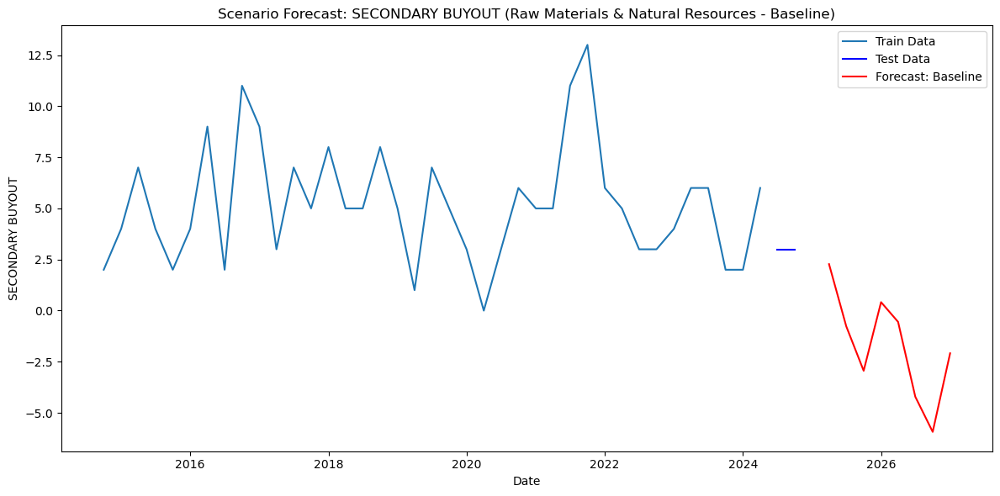

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


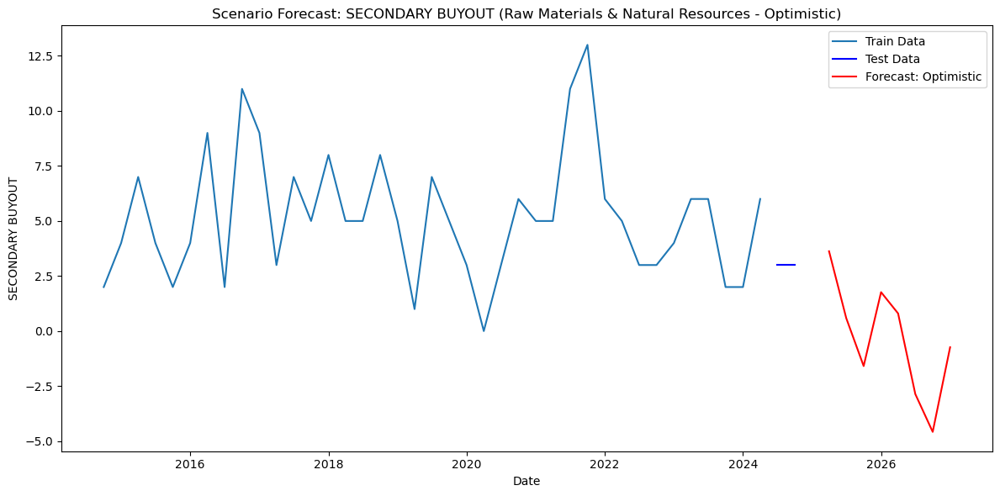

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


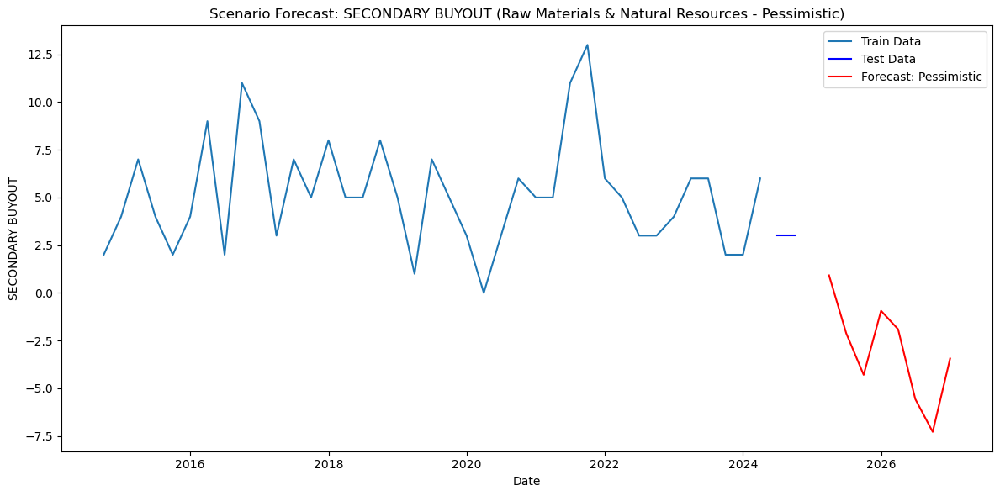

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Processing Industry: Financial & Insurance Services...
Modeling NUMBER OF DEALS (aggregated) for Financial & Insurance Services...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.90071D+00    |proj g|=  5.25951D+00

At iterate    5    f=  1.82721D+00    |proj g|=  3.14075D-01

At iterate   10    f=  1.78797D+00    |proj g|=  6.01579D-01

At iterate   15    f=  1.76570D+00    |proj g|=  1.84628D-01

At iterate   20    f=  1.68464D+00    |proj g|=  1.28784D+00

At iterate   25    f=  1.66680D+00    |proj g|=  1.24395D+00

At iterate   30    f=  1.62579D+00    |proj g|=  2.86498D-01

At iterate   35    f=  1.62370D+00    |proj g|=  1.60716D-01

At iterate   40    f=  1.60445D+00    |proj g|=  1.51807D+00

At iterate   45    f=  1.59465D+00    |proj g|=  2.16384D-01

At iterate   50    f=  1.59378D+00    |proj g|=  6.05926D-01

           * * *

T

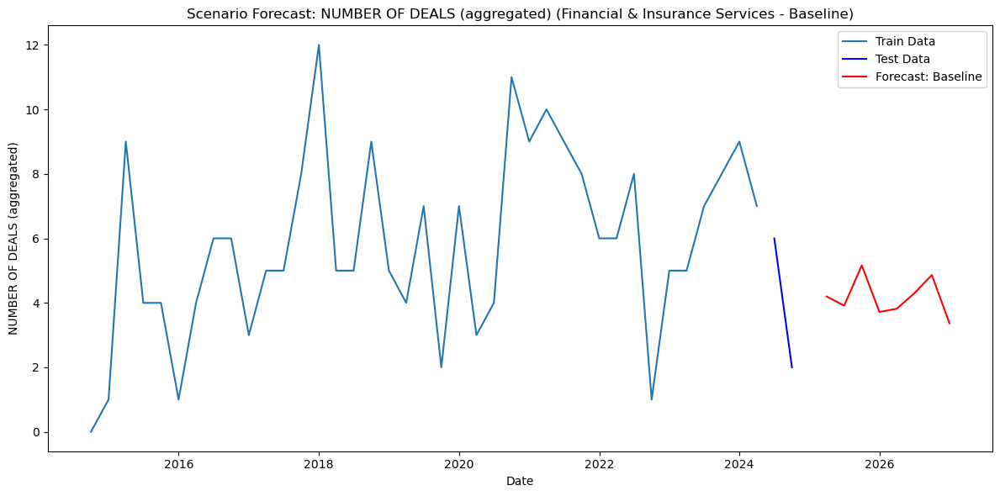

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


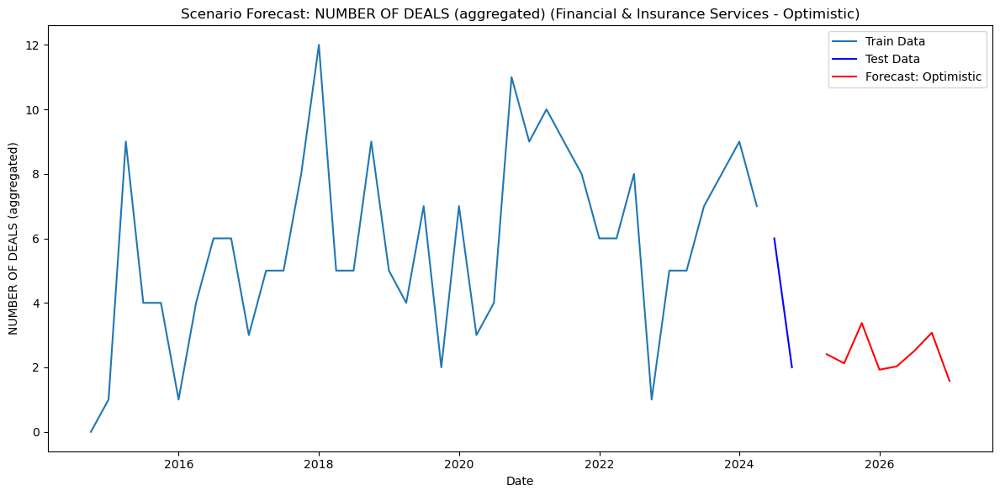

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


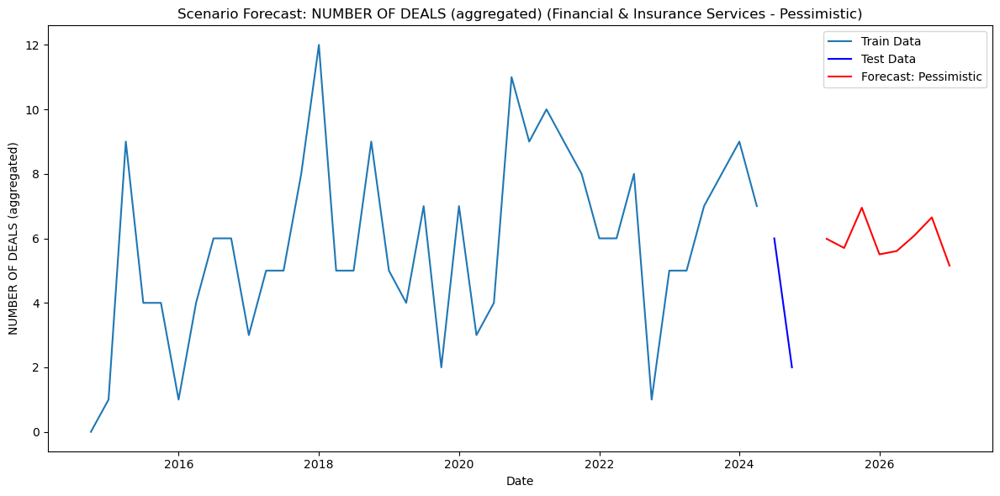

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling AGGREGATE DEAL VALUE (USD Bn) for Financial & Insurance Services...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.06623D+00    |proj g|=  6.91501D-01

At iterate    5    f=  2.05129D+00    |proj g|=  2.26181D-01

At iterate   10    f=  2.03748D+00    |proj g|=  2.54452D-01

At iterate   15    f=  2.01372D+00    |proj g|=  9.23804D-02

At iterate   20    f=  2.00039D+00    |proj g|=  1.24827D-01

At iterate   25    f=  1.98307D+00    |proj g|=  1.12558D+00

At iterate   30    f=  1.96782D+00    |proj g|=  4.72061D-01

At iterate   35    f=  1.96647D+00    |proj g|=  7.48913D-01

At iterate   40    f=  1.96227D+00    |proj g|=  2.35320D-01

At iterate   45    f=  1.95825D+00    |proj g|=  3.02537D-01

At iterate   50    f=  1.95536D+00    |proj g|=  3.57317D-02

           * * *

Tit   = total number of iterations
Tnf   = total number

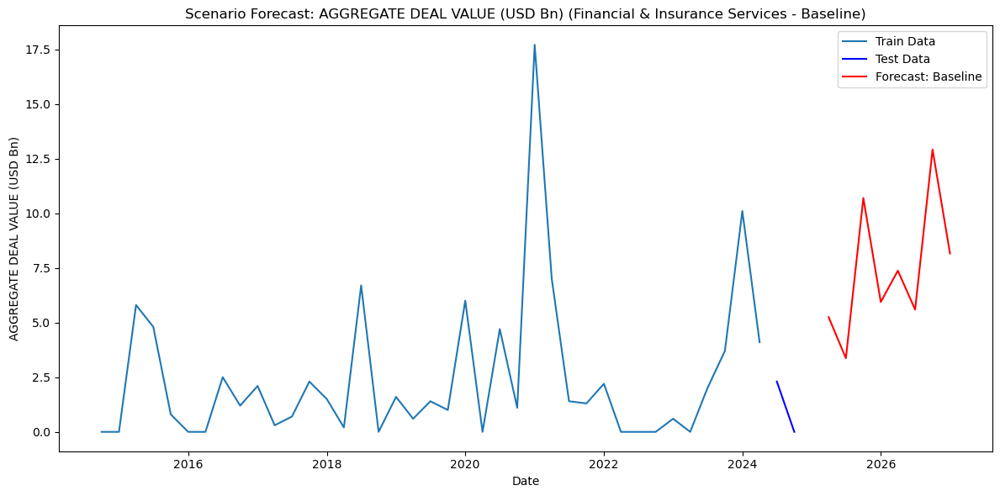

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


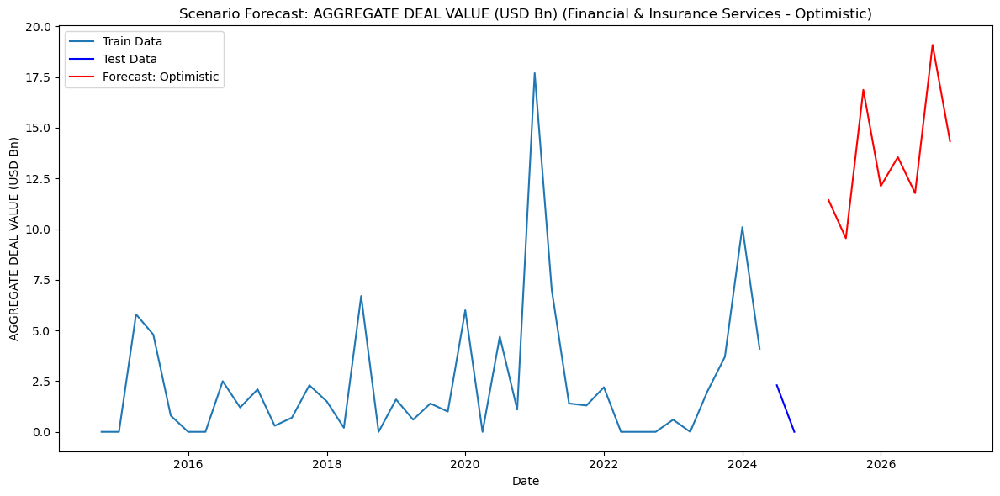

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


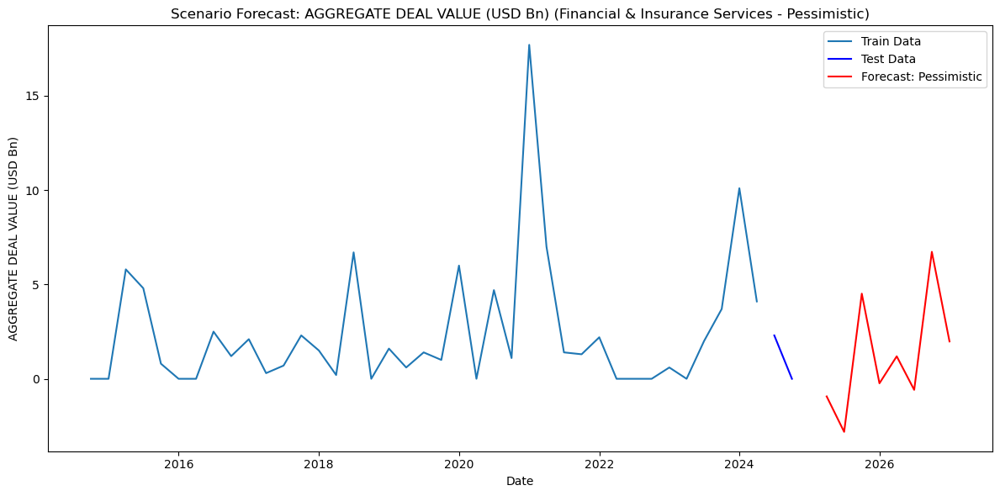

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling AVERAGE DEAL SIZE (USD Mn) for Financial & Insurance Services...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.32856D+00    |proj g|=  1.51315D-01

At iterate    5    f=  5.29863D+00    |proj g|=  1.03632D-02

At iterate   10    f=  5.28805D+00    |proj g|=  1.04046D-02

At iterate   15    f=  5.28641D+00    |proj g|=  9.61676D-04

At iterate   20    f=  5.28593D+00    |proj g|=  9.81562D-03

At iterate   25    f=  5.28486D+00    |proj g|=  1.16686D-03

At iterate   30    f=  5.28398D+00    |proj g|=  9.33988D-03

At iterate   35    f=  5.28245D+00    |proj g|=  4.66847D-03

At iterate   40    f=  5.27662D+00    |proj g|=  5.15849D-03

At iterate   45    f=  5.27653D+00    |proj g|=  2.00102D-03

At iterate   50    f=  5.27612D+00    |proj g|=  6.80512D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of

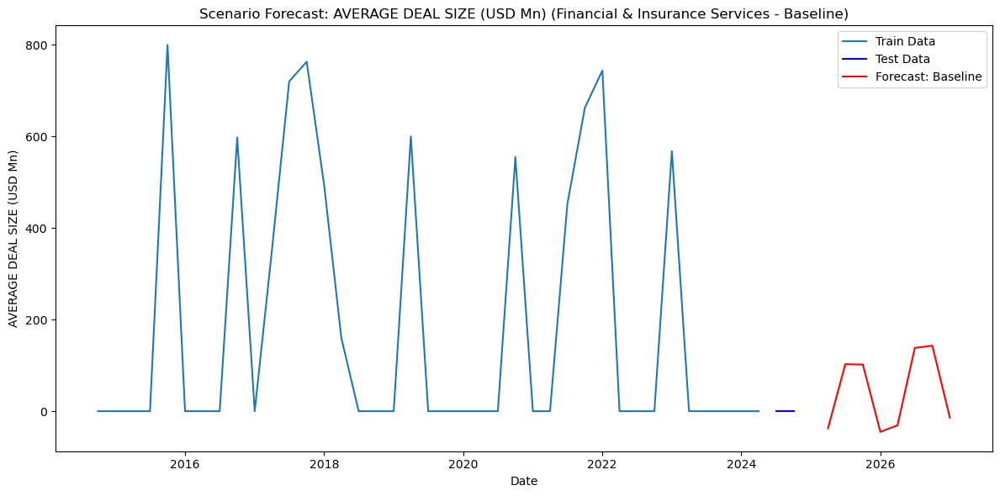

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


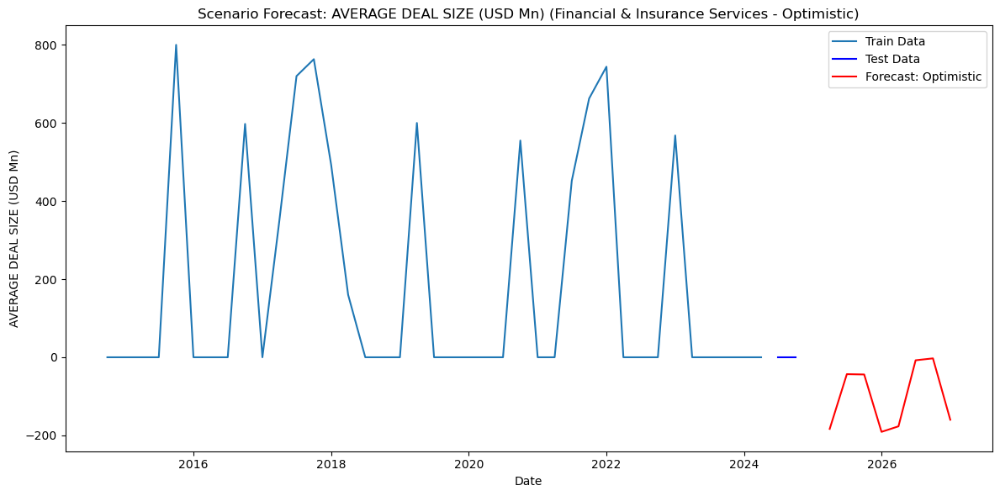

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


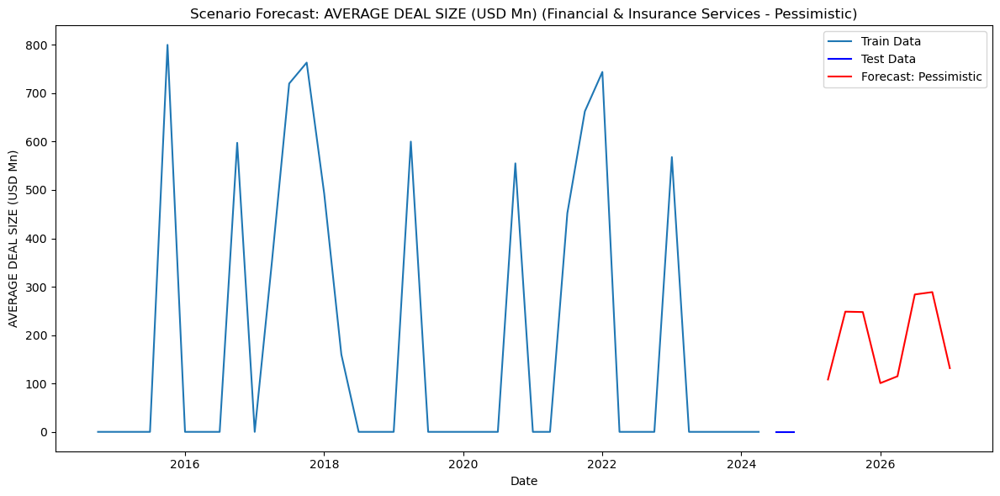

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling SECONDARY BUYOUT for Financial & Insurance Services...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.90071D+00    |proj g|=  5.25951D+00

At iterate    5    f=  1.82721D+00    |proj g|=  3.14075D-01

At iterate   10    f=  1.78797D+00    |proj g|=  6.01579D-01

At iterate   15    f=  1.76570D+00    |proj g|=  1.84628D-01

At iterate   20    f=  1.68464D+00    |proj g|=  1.28784D+00

At iterate   25    f=  1.66680D+00    |proj g|=  1.24395D+00

At iterate   30    f=  1.62579D+00    |proj g|=  2.86498D-01

At iterate   35    f=  1.62370D+00    |proj g|=  1.60716D-01

At iterate   40    f=  1.60445D+00    |proj g|=  1.51807D+00

At iterate   45    f=  1.59465D+00    |proj g|=  2.16384D-01

At iterate   50    f=  1.59378D+00    |proj g|=  6.05926D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function 

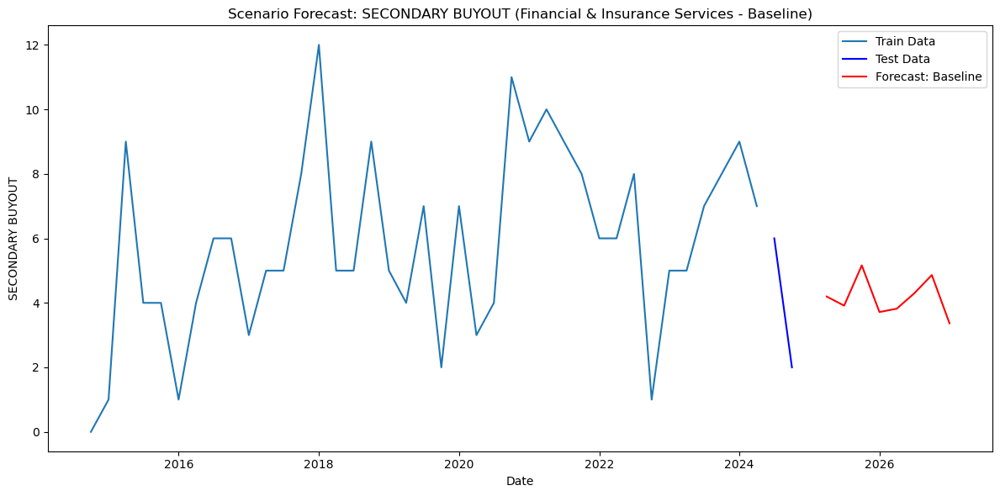

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


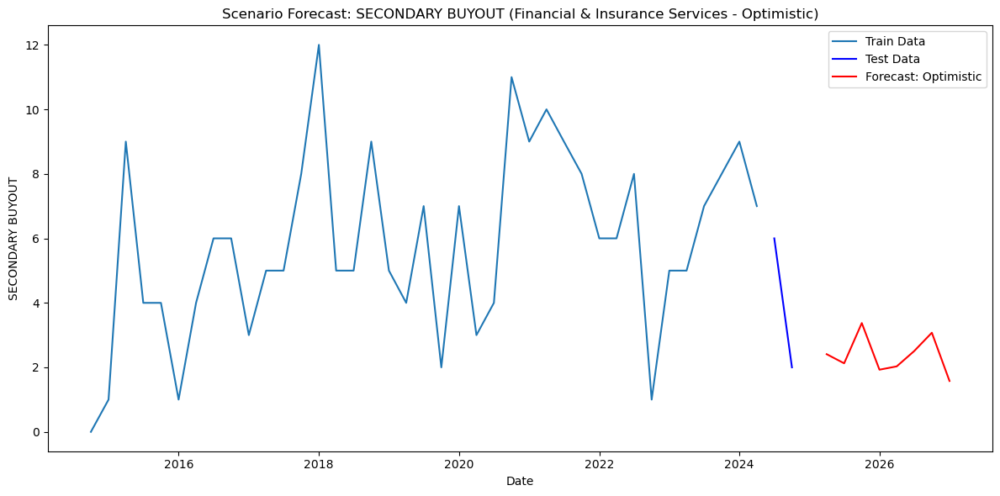

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


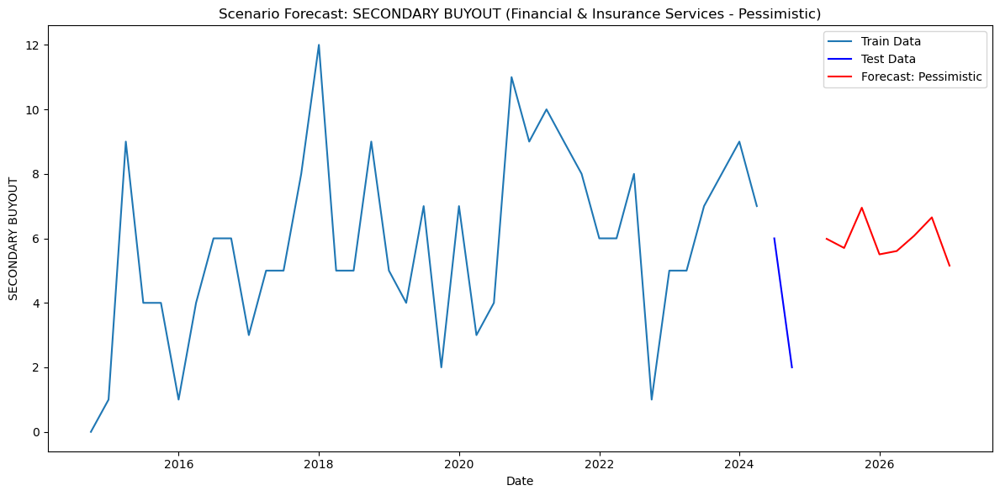

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Processing Industry: Healthcare...
Modeling NUMBER OF DEALS (aggregated) for Healthcare...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.17452D+00    |proj g|=  1.36284D+00

At iterate    5    f=  2.13216D+00    |proj g|=  1.05376D+00

At iterate   10    f=  2.09532D+00    |proj g|=  5.54624D-02

At iterate   15    f=  2.08250D+00    |proj g|=  1.48058D+00

At iterate   20    f=  2.06299D+00    |proj g|=  1.12957D-01

At iterate   25    f=  2.05077D+00    |proj g|=  9.84476D-01

At iterate   30    f=  2.04400D+00    |proj g|=  1.04145D-01

At iterate   35    f=  2.02623D+00    |proj g|=  1.76116D-01

At iterate   40    f=  2.02288D+00    |proj g|=  3.00401D-01

At iterate   45    f=  2.01535D+00    |proj g|=  3.37786D-02

At iterate   50    f=  2.01482D+00    |proj g|=  2.51672D-01

           * * *

Tit   = total number of iterations
Tnf   

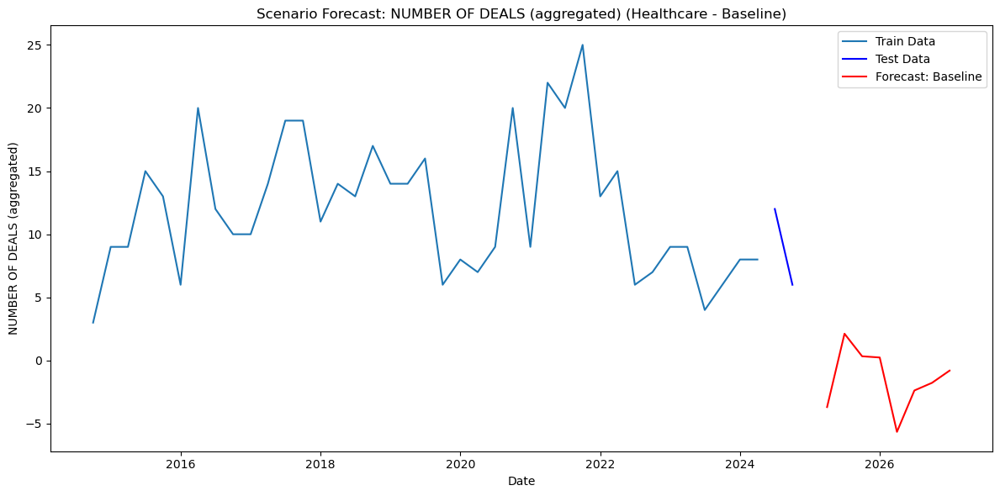

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


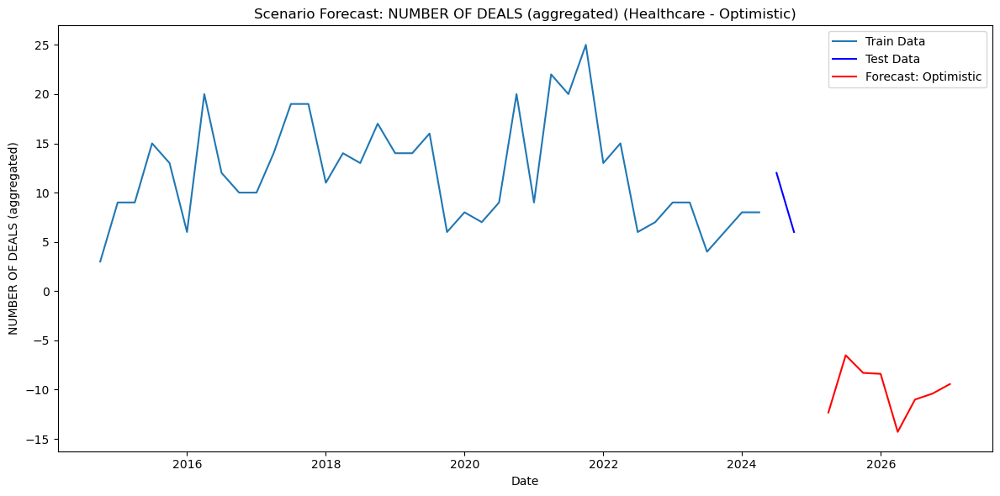

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


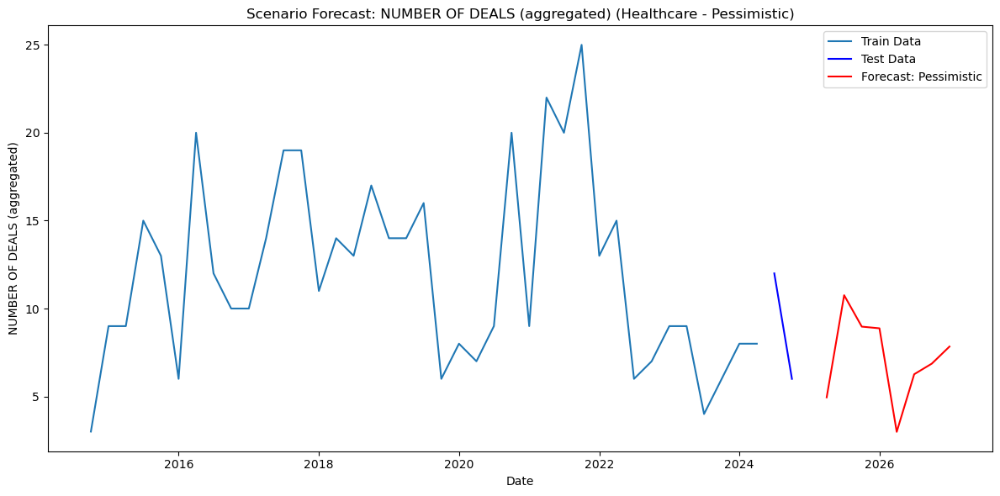

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling AGGREGATE DEAL VALUE (USD Bn) for Healthcare...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.21574D+00    |proj g|=  1.29325D+00

At iterate    5    f=  2.19016D+00    |proj g|=  6.75691D-02

At iterate   10    f=  2.16817D+00    |proj g|=  1.02901D-01

At iterate   15    f=  2.16294D+00    |proj g|=  2.65567D-02

At iterate   20    f=  2.15998D+00    |proj g|=  1.69663D-02

At iterate   25    f=  2.15767D+00    |proj g|=  8.87081D-02

At iterate   30    f=  2.15572D+00    |proj g|=  3.79758D-02

At iterate   35    f=  2.15468D+00    |proj g|=  3.07105D-01

At iterate   40    f=  2.15262D+00    |proj g|=  2.91904D-02

At iterate   45    f=  2.14956D+00    |proj g|=  1.27763D-01

At iterate   50    f=  2.14052D+00    |proj g|=  3.53802D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluat

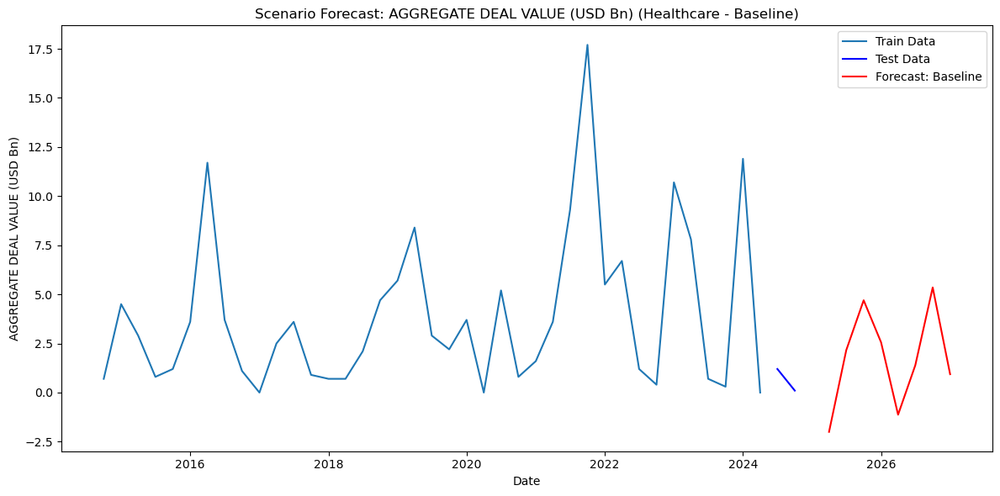

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


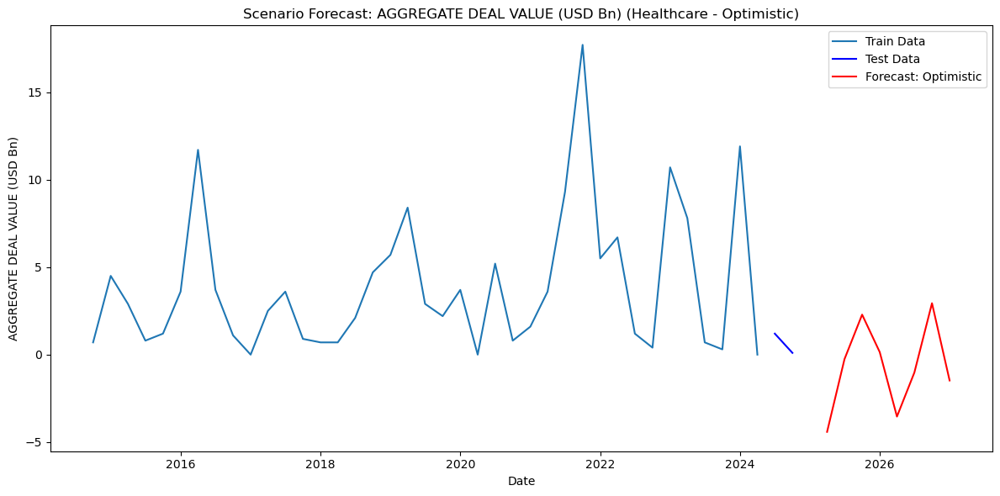

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


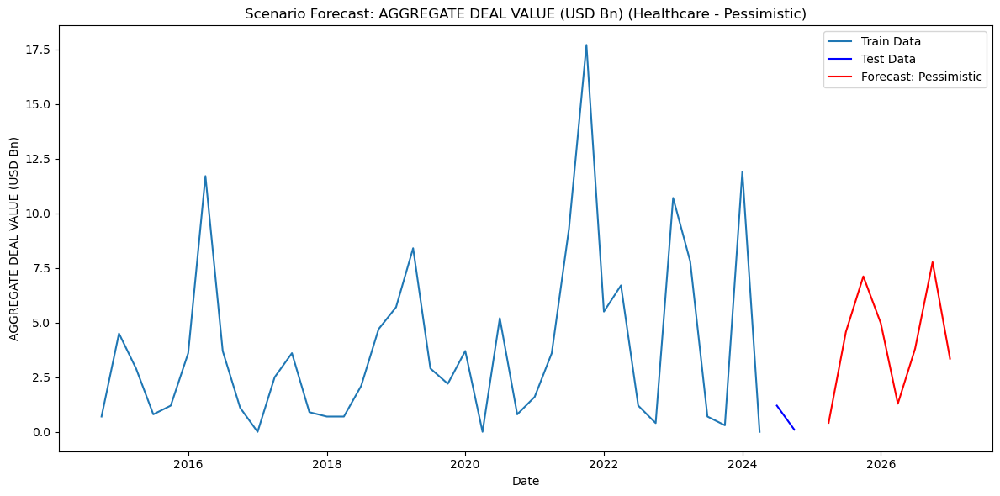

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling AVERAGE DEAL SIZE (USD Mn) for Healthcare...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.51943D+00    |proj g|=  6.16545D-02

At iterate    5    f=  5.50444D+00    |proj g|=  2.68302D-02

At iterate   10    f=  5.49011D+00    |proj g|=  1.51566D-02

At iterate   15    f=  5.47408D+00    |proj g|=  1.25088D-03

At iterate   20    f=  5.47269D+00    |proj g|=  1.25350D-02

At iterate   25    f=  5.47057D+00    |proj g|=  2.00633D-03

At iterate   30    f=  5.46541D+00    |proj g|=  3.67794D-02

At iterate   35    f=  5.45721D+00    |proj g|=  1.54997D-03

At iterate   40    f=  5.45698D+00    |proj g|=  6.79681D-03

At iterate   45    f=  5.45181D+00    |proj g|=  1.02799D-02

At iterate   50    f=  5.44625D+00    |proj g|=  1.20940D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluation

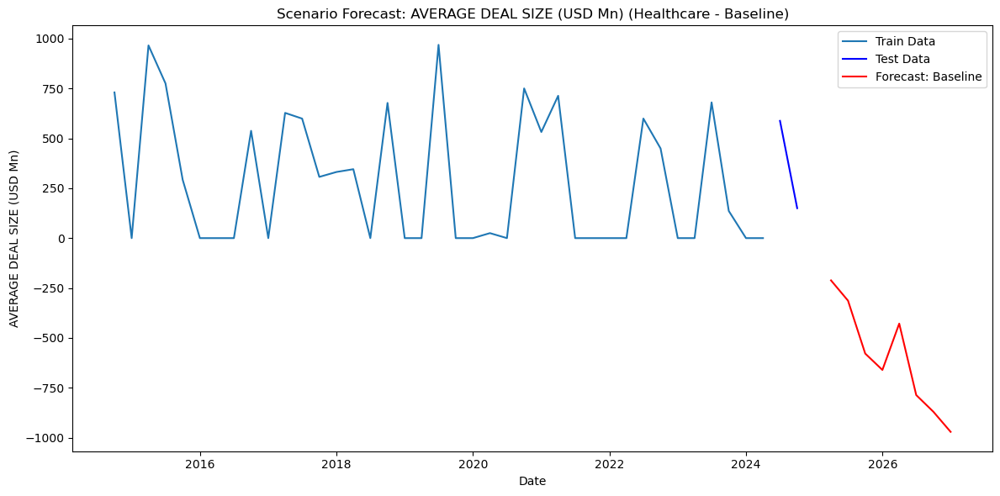

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


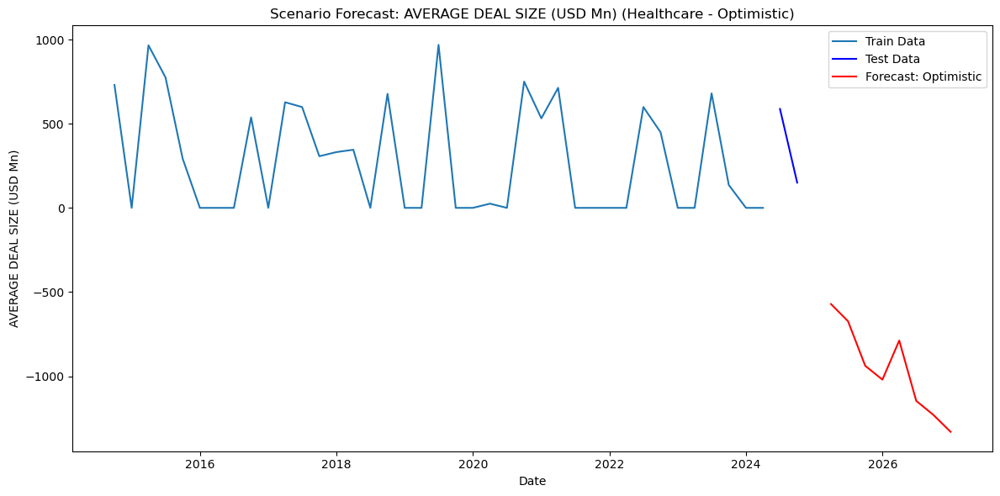

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


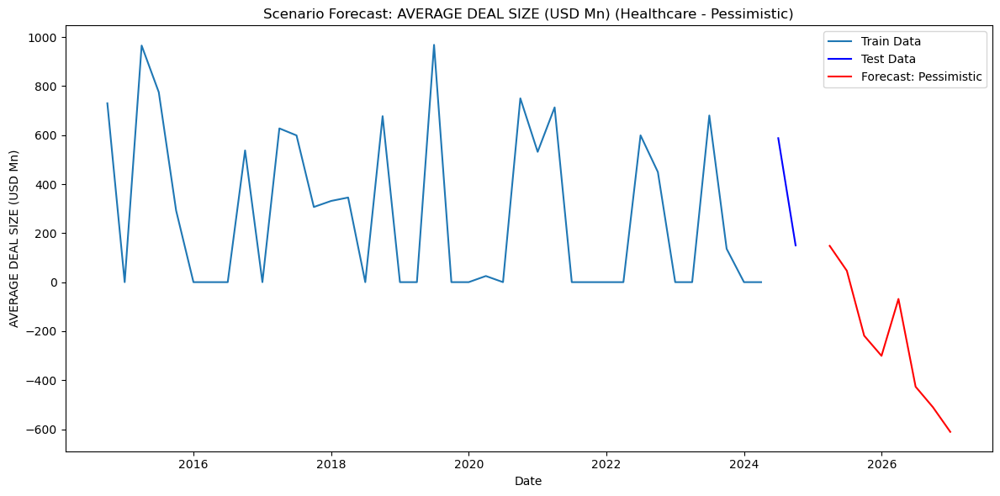

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling SECONDARY BUYOUT for Healthcare...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.17452D+00    |proj g|=  1.36284D+00

At iterate    5    f=  2.13216D+00    |proj g|=  1.05376D+00

At iterate   10    f=  2.09532D+00    |proj g|=  5.54624D-02

At iterate   15    f=  2.08250D+00    |proj g|=  1.48058D+00

At iterate   20    f=  2.06299D+00    |proj g|=  1.12957D-01

At iterate   25    f=  2.05077D+00    |proj g|=  9.84476D-01

At iterate   30    f=  2.04400D+00    |proj g|=  1.04145D-01

At iterate   35    f=  2.02623D+00    |proj g|=  1.76116D-01

At iterate   40    f=  2.02288D+00    |proj g|=  3.00401D-01

At iterate   45    f=  2.01535D+00    |proj g|=  3.37786D-02

At iterate   50    f=  2.01482D+00    |proj g|=  2.51672D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = 

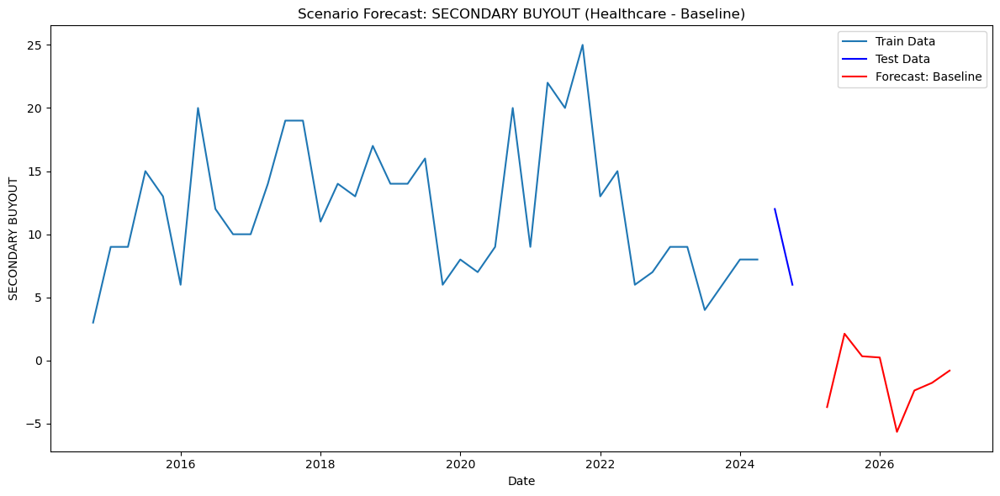

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


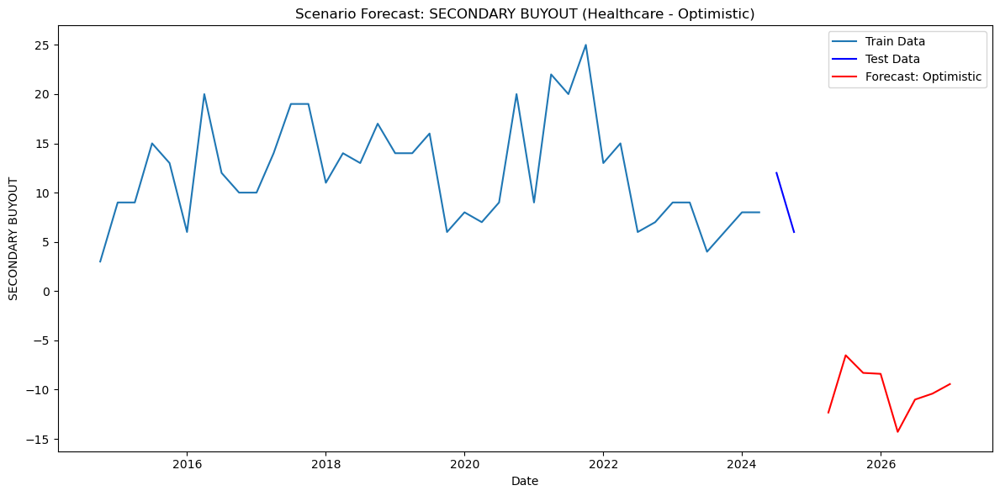

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


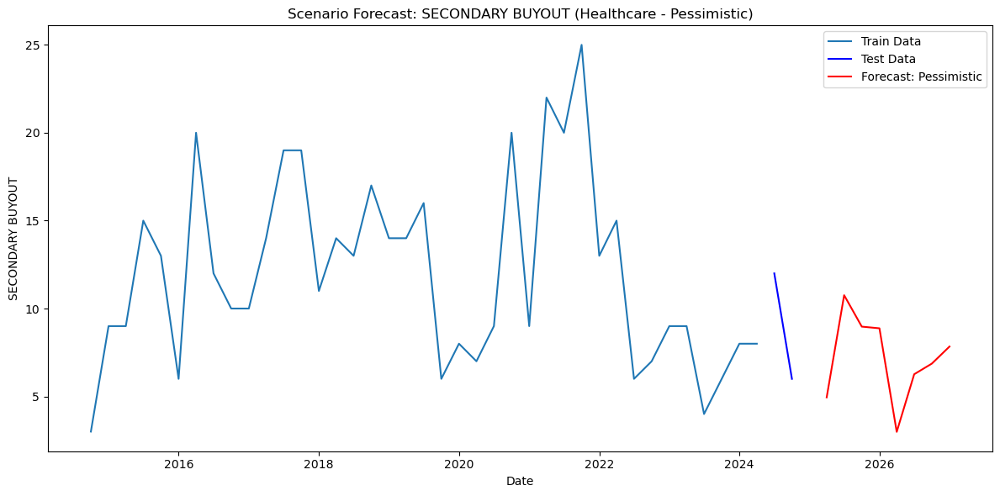

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Processing Industry: Business Services...
Modeling NUMBER OF DEALS (aggregated) for Business Services...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.56858D+00    |proj g|=  7.17323D-01

At iterate    5    f=  2.47174D+00    |proj g|=  8.36054D-01

At iterate   10    f=  2.40783D+00    |proj g|=  7.37756D-01

At iterate   15    f=  2.39372D+00    |proj g|=  5.25377D-02

At iterate   20    f=  2.38802D+00    |proj g|=  6.86643D-01

At iterate   25    f=  2.38535D+00    |proj g|=  7.32031D-01

At iterate   30    f=  2.34883D+00    |proj g|=  1.06899D+00

At iterate   35    f=  2.32976D+00    |proj g|=  2.74724D-01

At iterate   40    f=  2.24925D+00    |proj g|=  5.64165D-01

At iterate   45    f=  2.24323D+00    |proj g|=  1.14972D+00

At iterate   50    f=  2.21914D+00    |proj g|=  4.50887D-01

           * * *

Tit   = total number of ite

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


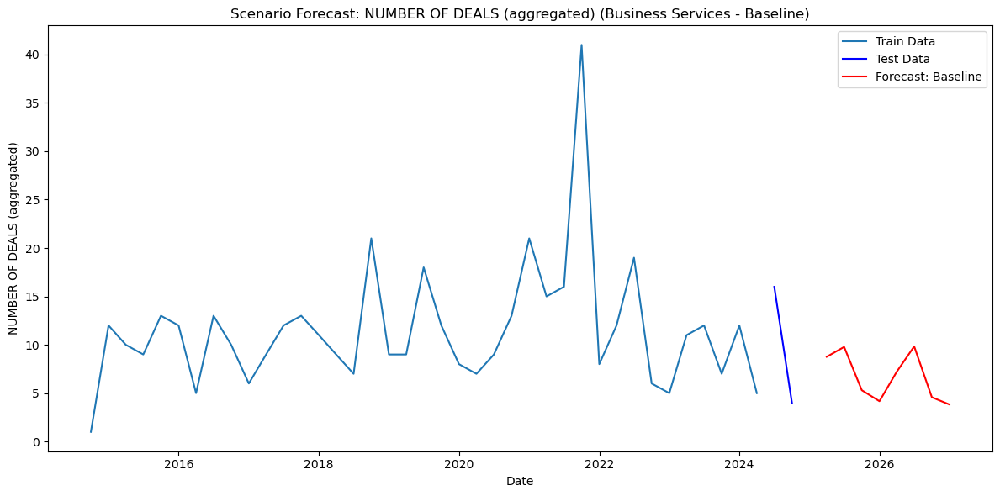

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


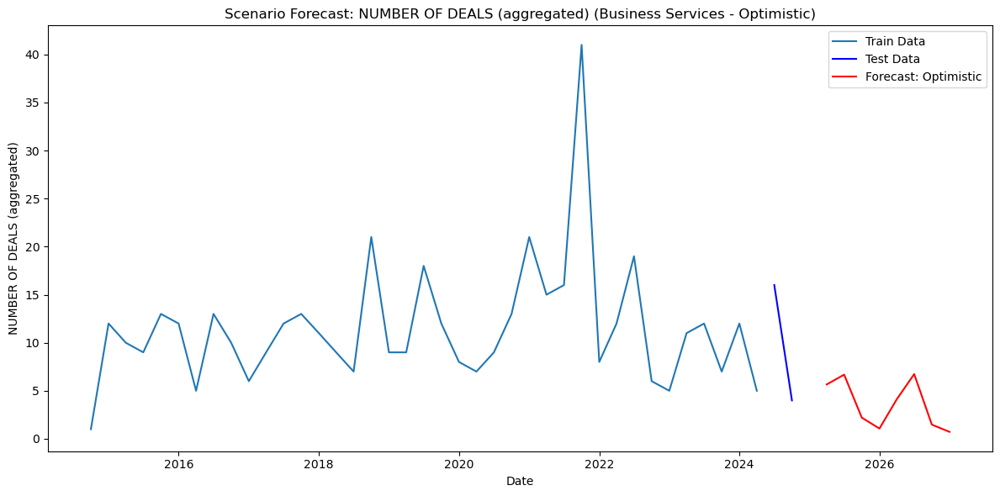

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


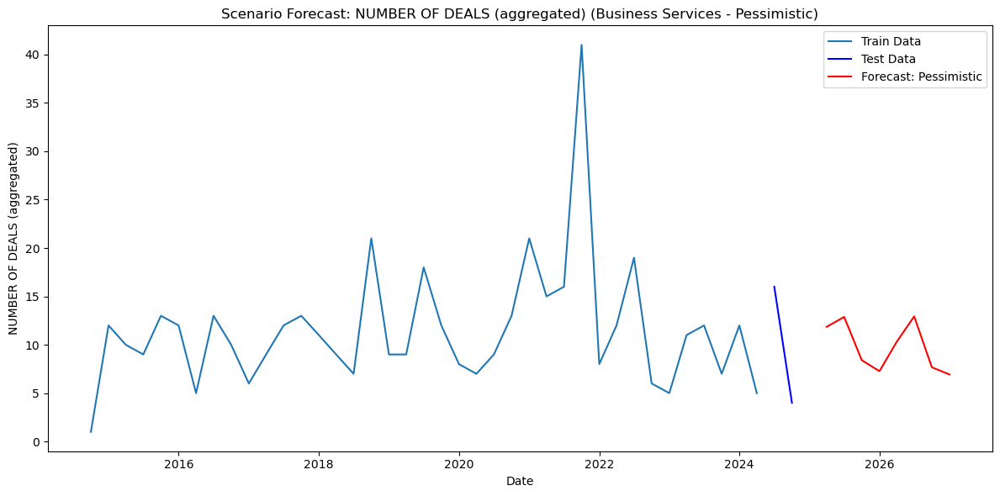

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling AGGREGATE DEAL VALUE (USD Bn) for Business Services...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.45469D+00    |proj g|=  8.34845D+00

At iterate    5    f=  1.39138D+00    |proj g|=  3.47627D-01

At iterate   10    f=  1.36370D+00    |proj g|=  1.31183D+00

At iterate   15    f=  1.29278D+00    |proj g|=  6.28102D-01

At iterate   20    f=  1.29141D+00    |proj g|=  4.45723D-01

At iterate   25    f=  1.26995D+00    |proj g|=  5.55011D+00

At iterate   30    f=  1.24332D+00    |proj g|=  9.50821D-01

At iterate   35    f=  1.24150D+00    |proj g|=  4.14925D-01

At iterate   40    f=  1.23535D+00    |proj g|=  1.83030D+00

At iterate   45    f=  1.23136D+00    |proj g|=  1.15584D-01

At iterate   50    f=  1.23122D+00    |proj g|=  3.72609D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function 

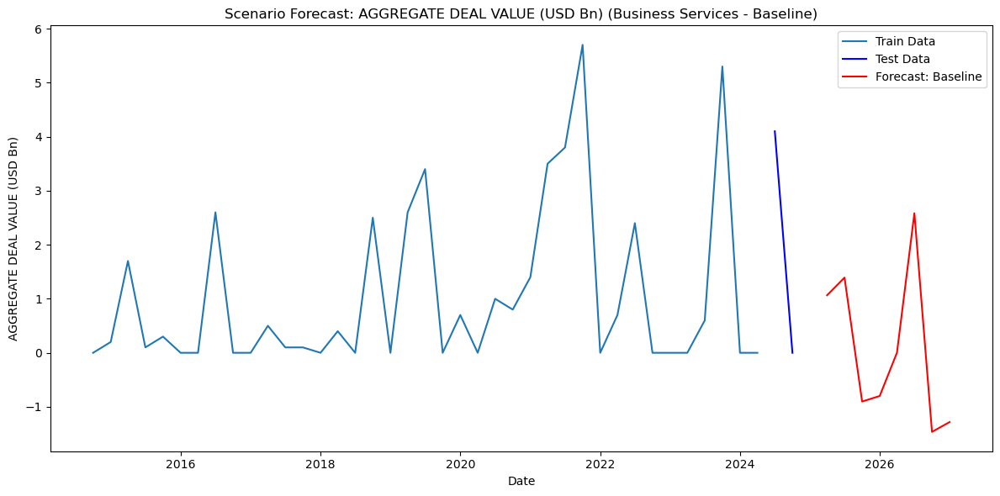

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


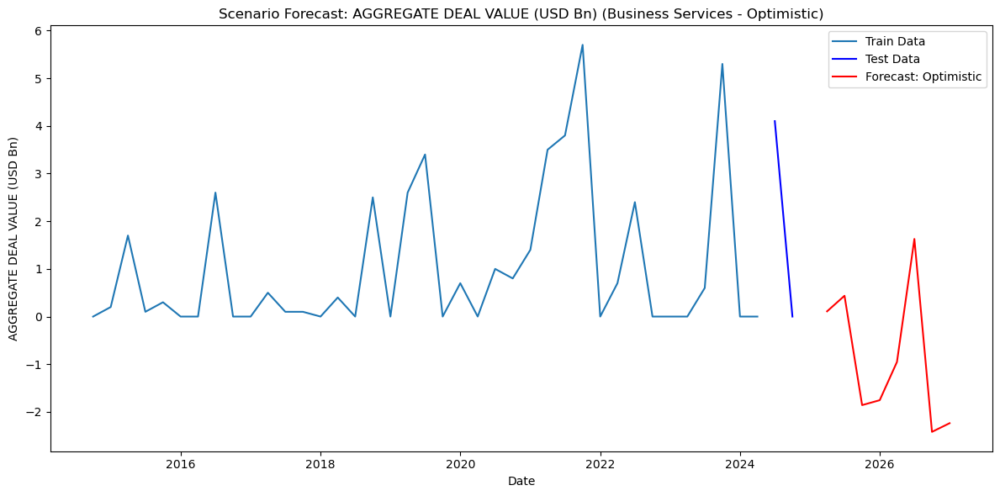

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


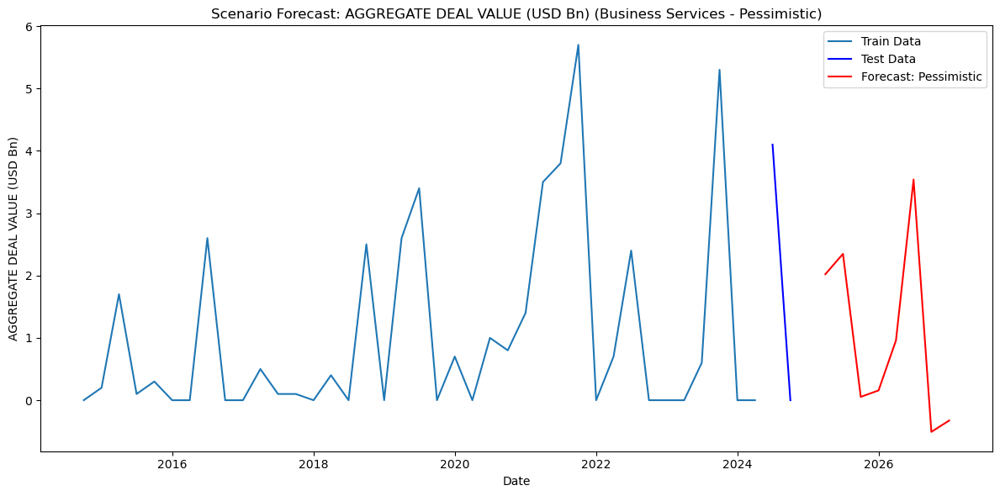

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer ind

Modeling AVERAGE DEAL SIZE (USD Mn) for Business Services...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.26659D+00    |proj g|=  1.40040D-01

At iterate    5    f=  5.23781D+00    |proj g|=  3.50695D-03

At iterate   10    f=  5.23613D+00    |proj g|=  9.89285D-03

At iterate   15    f=  5.23307D+00    |proj g|=  2.67728D-03

At iterate   20    f=  5.23064D+00    |proj g|=  1.17384D-02

At iterate   25    f=  5.22979D+00    |proj g|=  2.07922D-03

At iterate   30    f=  5.22852D+00    |proj g|=  4.01725D-03

At iterate   35    f=  5.22827D+00    |proj g|=  2.01687D-02

At iterate   40    f=  5.22784D+00    |proj g|=  1.76876D-03

At iterate   45    f=  5.22715D+00    |proj g|=  1.09911D-02

At iterate   50    f=  5.22449D+00    |proj g|=  6.21556D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva

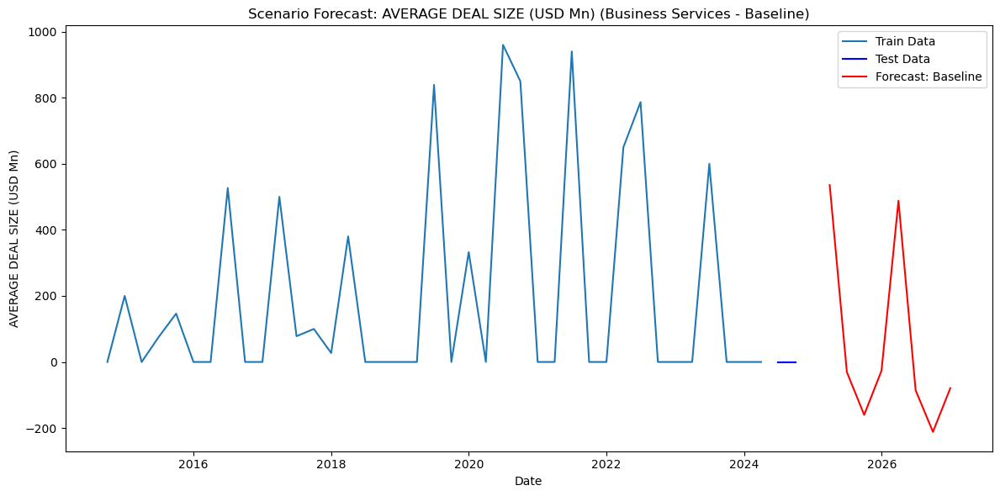

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


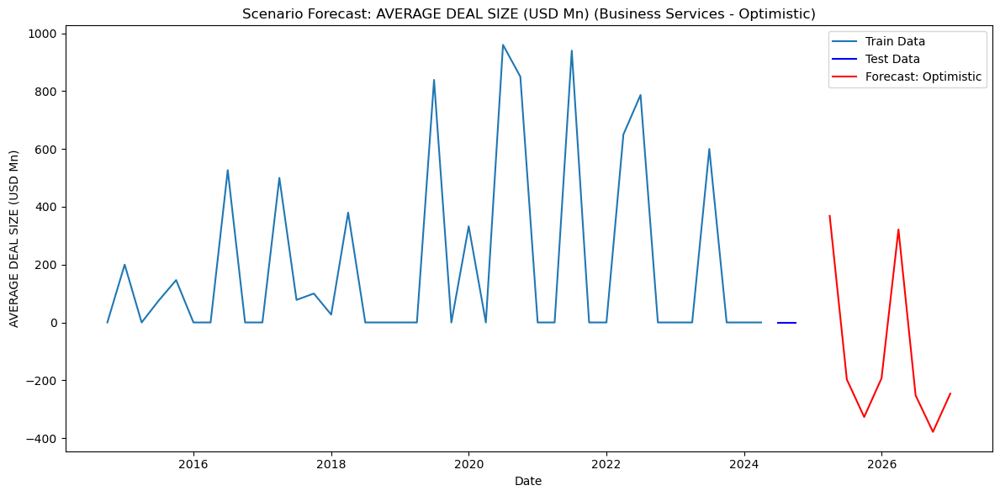

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


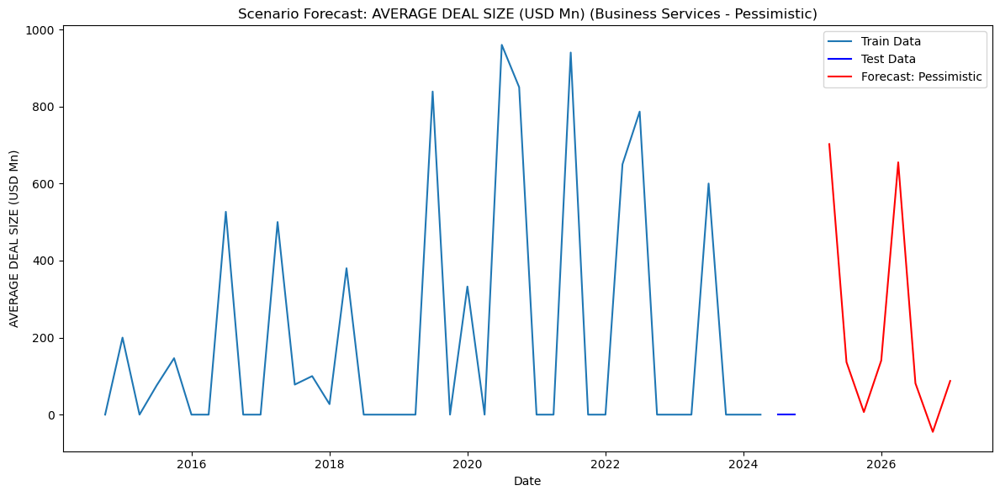

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.


Modeling SECONDARY BUYOUT for Business Services...
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.56858D+00    |proj g|=  7.17323D-01

At iterate    5    f=  2.47174D+00    |proj g|=  8.36054D-01

At iterate   10    f=  2.40783D+00    |proj g|=  7.37756D-01

At iterate   15    f=  2.39372D+00    |proj g|=  5.25377D-02

At iterate   20    f=  2.38802D+00    |proj g|=  6.86643D-01

At iterate   25    f=  2.38535D+00    |proj g|=  7.32031D-01

At iterate   30    f=  2.34883D+00    |proj g|=  1.06899D+00

At iterate   35    f=  2.32976D+00    |proj g|=  2.74724D-01

At iterate   40    f=  2.24925D+00    |proj g|=  5.64165D-01

At iterate   45    f=  2.24323D+00    |proj g|=  1.14972D+00

At iterate   50    f=  2.21914D+00    |proj g|=  4.50887D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
T

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


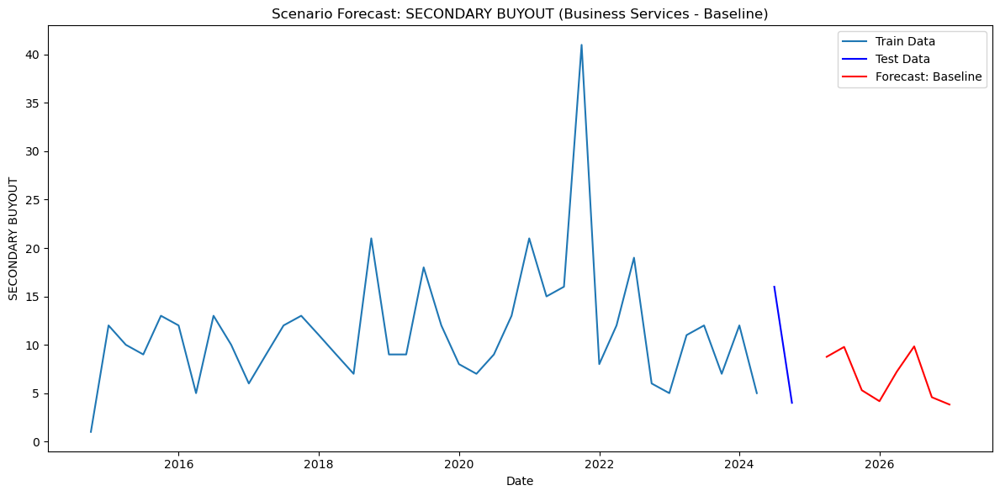

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


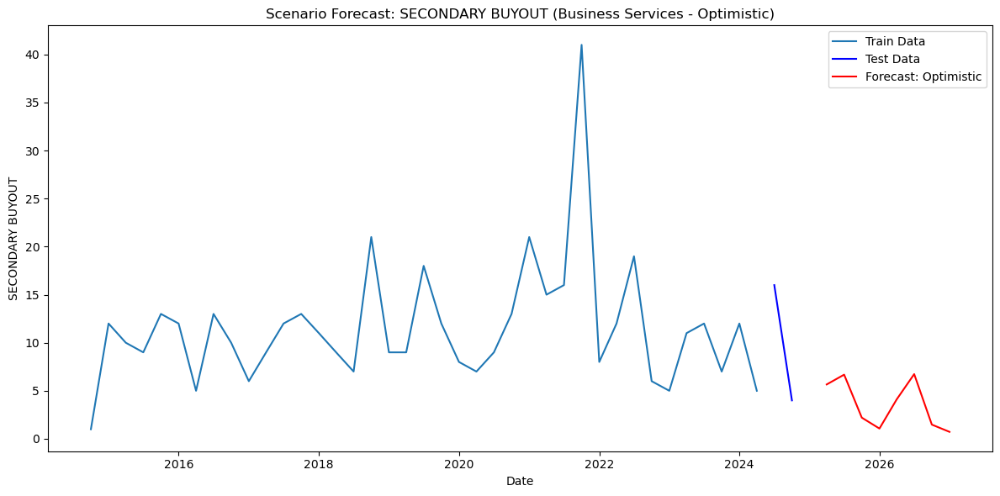

/Users/phuongpham/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


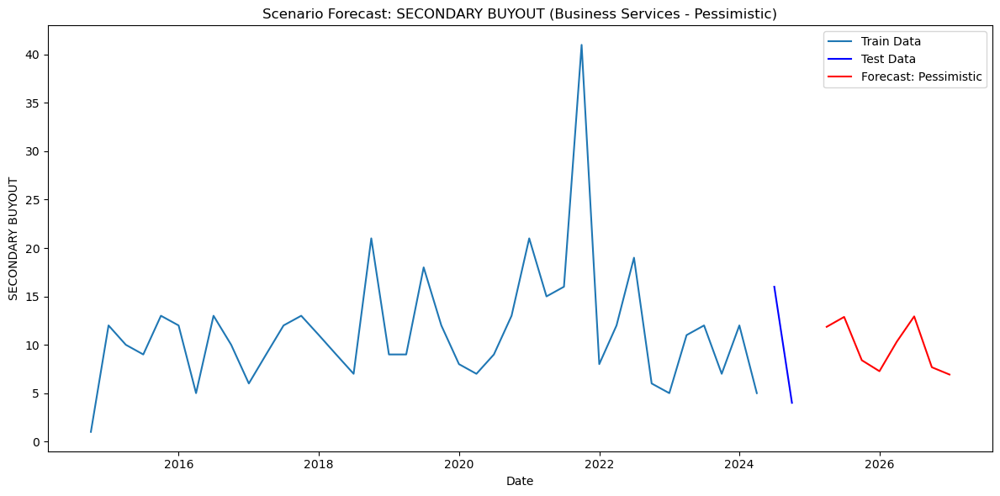

In [10]:
'''------------------SCENARIO ANALYSIS: SBO ACTIVITIES BY INDUSTRY - TESTING SARIMAX THROUGH BASELINE, OPTIMISTIC, PESSIMISTIC-----------------------------'''
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
import matplotlib.pyplot as plt
import os

# Define paths
desktop_path = os.path.join(os.path.expanduser("~"), 'Desktop')
final_project_folder = os.path.join(desktop_path, 'Final Project')
industry_file_path = os.path.join(final_project_folder, 'Merged_Industry_SBO_Simple.xlsx')
merged_file_path = os.path.join(final_project_folder, 'Merged_Data_Sorted_Cleaned.xlsx')

# Load datasets
industry_data = pd.read_excel(industry_file_path)
merged_data = pd.read_excel(merged_file_path)

def convert_quarter_to_datetime(quarter):
    year = int(quarter.split(' ')[1])
    quarter_num = int(quarter.split(' ')[0][-1])
    month = {1: 1, 2: 4, 3: 7, 4: 10}[quarter_num]
    return pd.Timestamp(year=year, month=month, day=1)

industry_data['DATE'] = industry_data['DATE'].apply(convert_quarter_to_datetime)
merged_data['DATE'] = merged_data['DATE'].apply(convert_quarter_to_datetime)

# Merge datasets
combined_data = industry_data.merge(merged_data, on='DATE', how='left')
combined_data.set_index('DATE', inplace=True)
combined_data.sort_index(inplace=True)

numeric_cols = combined_data.columns.difference(['Industry'])
combined_data[numeric_cols] = combined_data[numeric_cols].replace("-", 0).apply(pd.to_numeric, errors='coerce')
combined_data[numeric_cols] = combined_data[numeric_cols].fillna(0)

sbo_targets = ['NUMBER OF DEALS (aggregated)', 'AGGREGATE DEAL VALUE (USD Bn)', 
               'AVERAGE DEAL SIZE (USD Mn)', 'SECONDARY BUYOUT']
exogenous_variables = [
    'Dry Powder (NORTH AMERICA)',
    'Fundraising (AGGREGATE CAPITAL RAISED (USD BN))',
    'Interest Rate (Rate)',
    'LBO Data (NUMBER OF DEALS (aggregated))',
    'Exit Data (NUMBER OF DEALS (aggregated))'
]

# Train-Test Split
train = combined_data.loc[:'2024-06-30']
test = combined_data.loc['2024-07-01':]

# Define scenarios
scenarios = {
    "Baseline": test[exogenous_variables].iloc[-1],
    "Optimistic": test[exogenous_variables].iloc[-1].copy(),
    "Pessimistic": test[exogenous_variables].iloc[-1].copy()
}

# Adjust scenarios
scenarios["Optimistic"]['Interest Rate (Rate)'] -= 0.5
scenarios["Optimistic"]['Dry Powder (NORTH AMERICA)'] *= 0.8
scenarios["Optimistic"]['Fundraising (AGGREGATE CAPITAL RAISED (USD BN))'] *= 1.2

scenarios["Pessimistic"]['Interest Rate (Rate)'] += 0.5
scenarios["Pessimistic"]['Dry Powder (NORTH AMERICA)'] *= 1.2
scenarios["Pessimistic"]['Fundraising (AGGREGATE CAPITAL RAISED (USD BN))'] *= 0.8

# Forecast for each industry
industries = combined_data['Industry'].unique()
forecast_results = {}

for industry in industries:
    print(f"Processing Industry: {industry}...")
    industry_subset = combined_data[combined_data['Industry'] == industry]

    for target in sbo_targets:
        print(f"Modeling {target} for {industry}...")
        train = industry_subset.loc[:'2024-06-30']
        test = industry_subset.loc['2024-07-01':]

        # SARIMAX Model
        model = SARIMAX(train[target],
                        exog=train[exogenous_variables],
                        order=(1, 1, 1),
                        seasonal_order=(1, 1, 1, 4),
                        enforce_stationarity=False,
                        enforce_invertibility=False)
        sarimax_results = model.fit()

        # Forecast for each scenario
        scenario_forecasts = {}
        for scenario_name, scenario_exog in scenarios.items():
            future_steps = 8
            future_exog = pd.DataFrame([scenario_exog] * future_steps, columns=exogenous_variables)

            forecast = sarimax_results.get_forecast(steps=future_steps, exog=future_exog)
            forecast_values = forecast.predicted_mean

            # Create a timeline for future quarters
            future_dates = pd.date_range(start=test.index[-1], periods=future_steps + 1, freq='Q')[1:]
            forecast_values.index = future_dates

            scenario_forecasts[scenario_name] = forecast_values

            # Plot Results
            plt.figure(figsize=(12, 6))
            plt.plot(train[target], label="Train Data")
            plt.plot(test[target], label="Test Data", color='blue')
            plt.plot(forecast_values, label=f"Forecast: {scenario_name}", color='red')
            plt.title(f"Scenario Forecast: {target} ({industry} - {scenario_name})")
            plt.xlabel("Date")
            plt.ylabel(target)
            plt.legend()
            plt.tight_layout()
            plt.show()

        forecast_results[(industry, target)] = scenario_forecasts


Modeling Exit Data (IPO)...
RMSE: 6.57, R²: -0.94
Feature Importances:
                                           Feature  Importance
3          LBO Data (NUMBER OF DEALS (aggregated))    0.574028
1  Fundraising (AGGREGATE CAPITAL RAISED (USD BN))    0.204890
4          SBO Data (NUMBER OF DEALS (aggregated))    0.103582
0                       Dry Powder (NORTH AMERICA)    0.065459
2                             Interest Rate (Rate)    0.052041


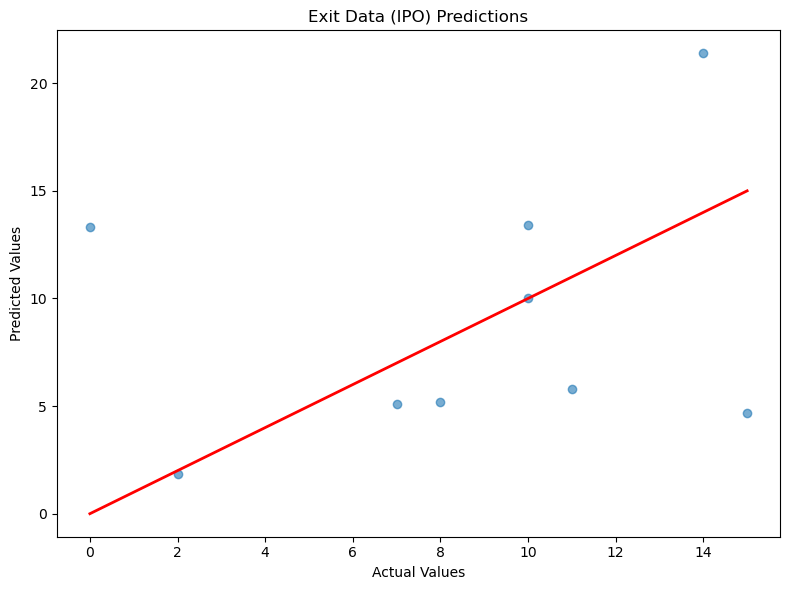

Modeling Exit Data (TRADE SALE)...
RMSE: 26.76, R²: 0.14
Feature Importances:
                                           Feature  Importance
4          SBO Data (NUMBER OF DEALS (aggregated))    0.792272
3          LBO Data (NUMBER OF DEALS (aggregated))    0.085639
0                       Dry Powder (NORTH AMERICA)    0.043943
1  Fundraising (AGGREGATE CAPITAL RAISED (USD BN))    0.039757
2                             Interest Rate (Rate)    0.038389


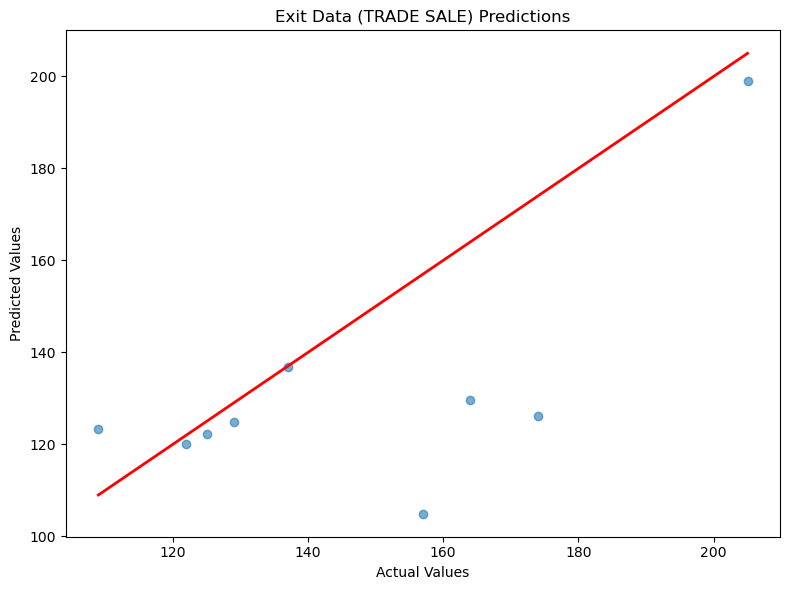

Modeling Exit Data (SECONDARY BUYOUT)...
RMSE: 20.16, R²: 0.70
Feature Importances:
                                           Feature  Importance
4          SBO Data (NUMBER OF DEALS (aggregated))    0.966817
3          LBO Data (NUMBER OF DEALS (aggregated))    0.010636
1  Fundraising (AGGREGATE CAPITAL RAISED (USD BN))    0.010628
0                       Dry Powder (NORTH AMERICA)    0.009266
2                             Interest Rate (Rate)    0.002653


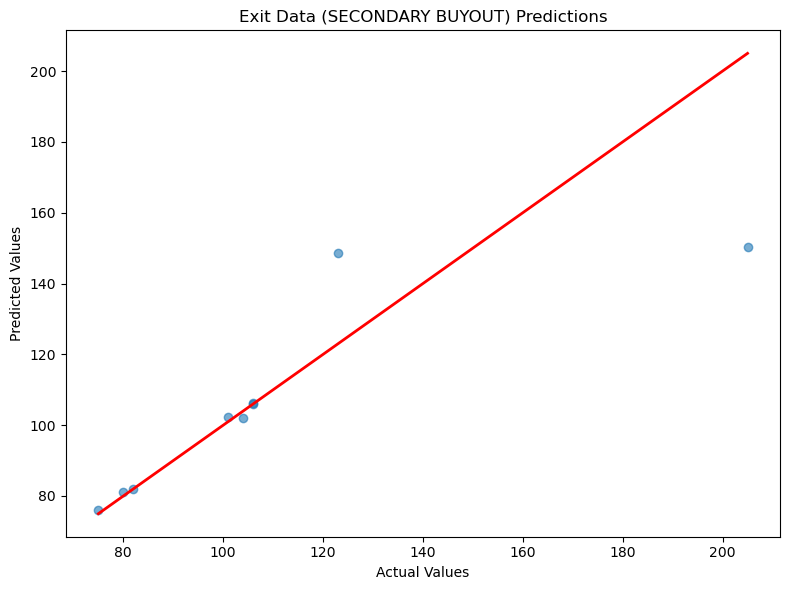

Modeling Exit Data (SALE TO MANAGEMENT)...
RMSE: 1.69, R²: -0.01
Feature Importances:
                                           Feature  Importance
3          LBO Data (NUMBER OF DEALS (aggregated))    0.447317
4          SBO Data (NUMBER OF DEALS (aggregated))    0.262399
2                             Interest Rate (Rate)    0.142163
1  Fundraising (AGGREGATE CAPITAL RAISED (USD BN))    0.077016
0                       Dry Powder (NORTH AMERICA)    0.071106


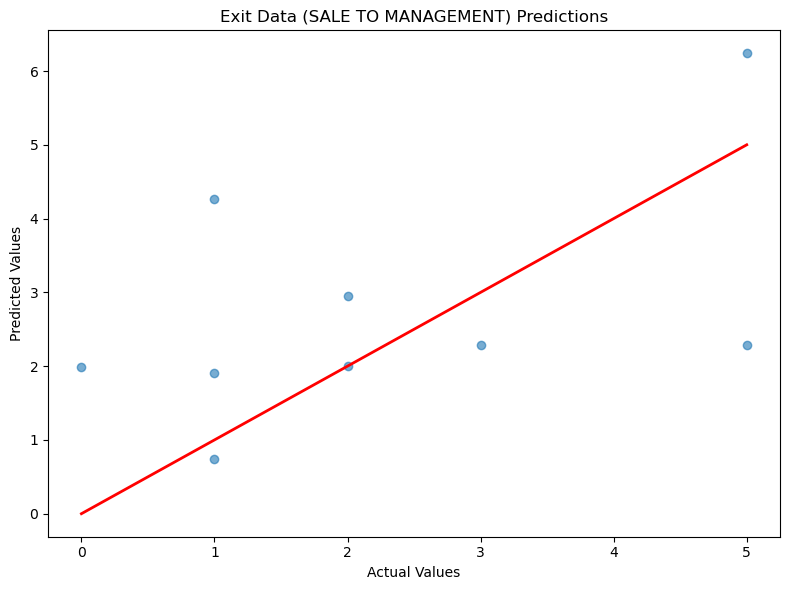

Modeling Exit Data (BANKRUPTCY/WRITE-OFF)...
RMSE: 5.38, R²: -0.71
Feature Importances:
                                           Feature  Importance
2                             Interest Rate (Rate)    0.567393
4          SBO Data (NUMBER OF DEALS (aggregated))    0.136155
0                       Dry Powder (NORTH AMERICA)    0.132274
3          LBO Data (NUMBER OF DEALS (aggregated))    0.096729
1  Fundraising (AGGREGATE CAPITAL RAISED (USD BN))    0.067449


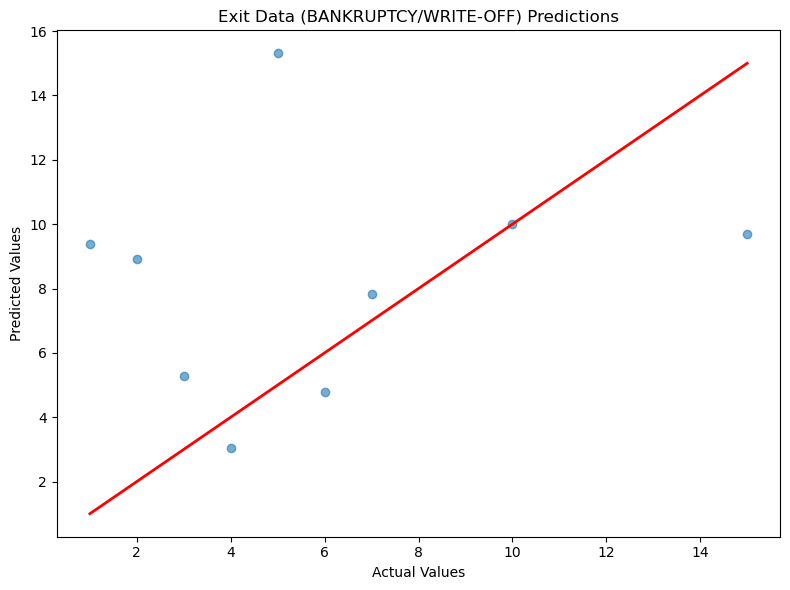

Modeling Exit Data (PRIVATE PLACEMENT/FOLLOW ON)...
RMSE: 10.12, R²: -0.85
Feature Importances:
                                           Feature  Importance
1  Fundraising (AGGREGATE CAPITAL RAISED (USD BN))    0.420492
2                             Interest Rate (Rate)    0.274570
3          LBO Data (NUMBER OF DEALS (aggregated))    0.223724
0                       Dry Powder (NORTH AMERICA)    0.048138
4          SBO Data (NUMBER OF DEALS (aggregated))    0.033077


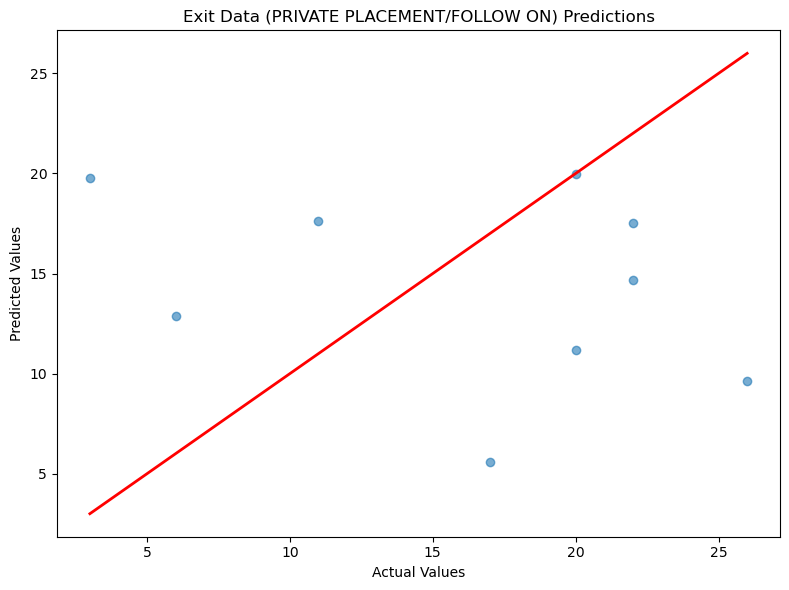

Modeling Exit Data (UNSPECIFIED EXIT)...
RMSE: 7.34, R²: -0.04
Feature Importances:
                                           Feature  Importance
3          LBO Data (NUMBER OF DEALS (aggregated))    0.640494
4          SBO Data (NUMBER OF DEALS (aggregated))    0.126824
0                       Dry Powder (NORTH AMERICA)    0.124538
1  Fundraising (AGGREGATE CAPITAL RAISED (USD BN))    0.062123
2                             Interest Rate (Rate)    0.046021


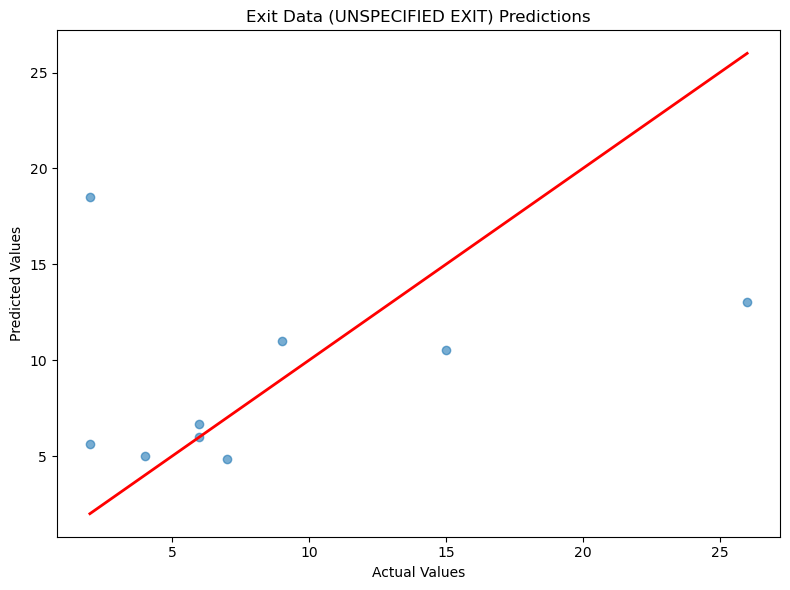

Summary of Model Performance:
Exit Data (IPO) - RMSE: 6.57, R²: -0.94
Exit Data (TRADE SALE) - RMSE: 26.76, R²: 0.14
Exit Data (SECONDARY BUYOUT) - RMSE: 20.16, R²: 0.70
Exit Data (SALE TO MANAGEMENT) - RMSE: 1.69, R²: -0.01
Exit Data (BANKRUPTCY/WRITE-OFF) - RMSE: 5.38, R²: -0.71
Exit Data (PRIVATE PLACEMENT/FOLLOW ON) - RMSE: 10.12, R²: -0.85
Exit Data (UNSPECIFIED EXIT) - RMSE: 7.34, R²: -0.04


In [11]:
'''Reference: using ML model: Gradient Boosting: FAILED
Adequate: SBO Activities
Inadequate: IPO, Sale to management, bankruptcy/write-off, private placement, unspecified exit'''
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import os
import numpy as np

# Define paths
desktop_path = os.path.join(os.path.expanduser("~"), 'Desktop')
final_project_folder = os.path.join(desktop_path, 'Final Project')
merged_file_path = os.path.join(final_project_folder, 'Merged_Data_Sorted_Cleaned.xlsx')

data = pd.read_excel(merged_file_path)

def convert_quarter_to_datetime(quarter):
    year = int(quarter.split(' ')[1])
    quarter_num = int(quarter.split(' ')[0][-1])
    month = {1: 1, 2: 4, 3: 7, 4: 10}[quarter_num]
    return pd.Timestamp(year=year, month=month, day=1)

data['DATE'] = data['DATE'].apply(convert_quarter_to_datetime)
data.set_index('DATE', inplace=True)
data = data.sort_index()

numeric_cols = data.columns.difference(['DATE'])
data[numeric_cols] = data[numeric_cols].replace("-", 0).apply(pd.to_numeric, errors='coerce')
data[numeric_cols] = data[numeric_cols].fillna(0)

# Define exit strategies and exogenous variables
exit_strategies = [
    'Exit Data (IPO)',
    'Exit Data (TRADE SALE)',
    'Exit Data (SECONDARY BUYOUT)',
    'Exit Data (SALE TO MANAGEMENT)',
    'Exit Data (BANKRUPTCY/WRITE-OFF)',
    'Exit Data (PRIVATE PLACEMENT/FOLLOW ON)',
    'Exit Data (UNSPECIFIED EXIT)'
]

exogenous_variables = [
    'Dry Powder (NORTH AMERICA)',
    'Fundraising (AGGREGATE CAPITAL RAISED (USD BN))',
    'Interest Rate (Rate)',
    'LBO Data (NUMBER OF DEALS (aggregated))',
    'SBO Data (NUMBER OF DEALS (aggregated))'
]

results = {}
for target in exit_strategies:
    print(f"Modeling {target}...")
    
    # Prepare data
    X = data[exogenous_variables]
    y = data[target]
    
    # Split into train-test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    # Initialize and train the model
    model = GradientBoostingRegressor(n_estimators=200, learning_rate=0.1, max_depth=3, random_state=42)
    model.fit(X_train, y_train)
    
    # Predict
    y_pred = model.predict(X_test)
    
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    print(f"RMSE: {rmse:.2f}, R²: {r2:.2f}")
    
    # Store results
    results[target] = {'model': model, 'rmse': rmse, 'r2': r2}
    
    # Feature Importance
    feature_importance = pd.DataFrame({
        'Feature': X_train.columns,
        'Importance': model.feature_importances_
    }).sort_values(by='Importance', ascending=False)
    
    print("Feature Importances:")
    print(feature_importance)
    
    # Plot Predictions vs Actual
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test, y_pred, alpha=0.6)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linewidth=2)
    plt.title(f"{target} Predictions")
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.tight_layout()
    plt.show()

print("Summary of Model Performance:")
for target, metrics in results.items():
    print(f"{target} - RMSE: {metrics['rmse']:.2f}, R²: {metrics['r2']:.2f}")


Modeling Exit Data (IPO) with Random Forest...
RMSE: 5.98, R²: -0.61
Feature Importances:
                                           Feature  Importance
3          LBO Data (NUMBER OF DEALS (aggregated))    0.472713
4          SBO Data (NUMBER OF DEALS (aggregated))    0.187908
1  Fundraising (AGGREGATE CAPITAL RAISED (USD BN))    0.187852
2                             Interest Rate (Rate)    0.080313
0                       Dry Powder (NORTH AMERICA)    0.071214


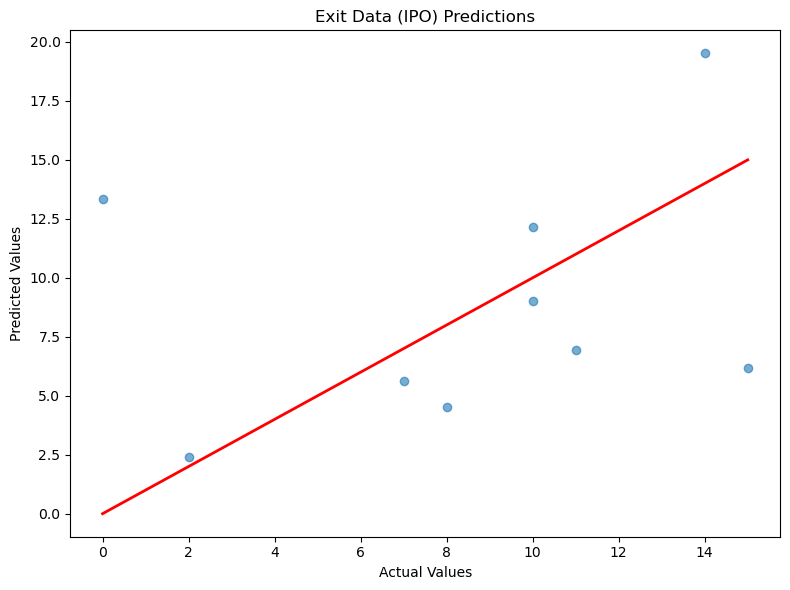

Modeling Exit Data (TRADE SALE) with Random Forest...
RMSE: 28.63, R²: 0.01
Feature Importances:
                                           Feature  Importance
4          SBO Data (NUMBER OF DEALS (aggregated))    0.711297
3          LBO Data (NUMBER OF DEALS (aggregated))    0.118840
2                             Interest Rate (Rate)    0.073138
0                       Dry Powder (NORTH AMERICA)    0.050394
1  Fundraising (AGGREGATE CAPITAL RAISED (USD BN))    0.046331


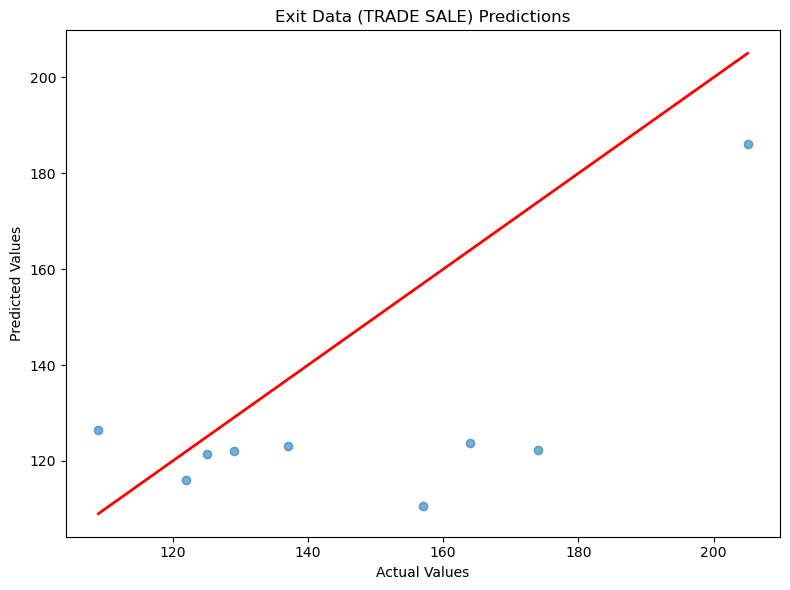

Modeling Exit Data (SECONDARY BUYOUT) with Random Forest...
RMSE: 20.53, R²: 0.69
Feature Importances:
                                           Feature  Importance
4          SBO Data (NUMBER OF DEALS (aggregated))    0.913554
0                       Dry Powder (NORTH AMERICA)    0.024109
2                             Interest Rate (Rate)    0.021815
1  Fundraising (AGGREGATE CAPITAL RAISED (USD BN))    0.020842
3          LBO Data (NUMBER OF DEALS (aggregated))    0.019679


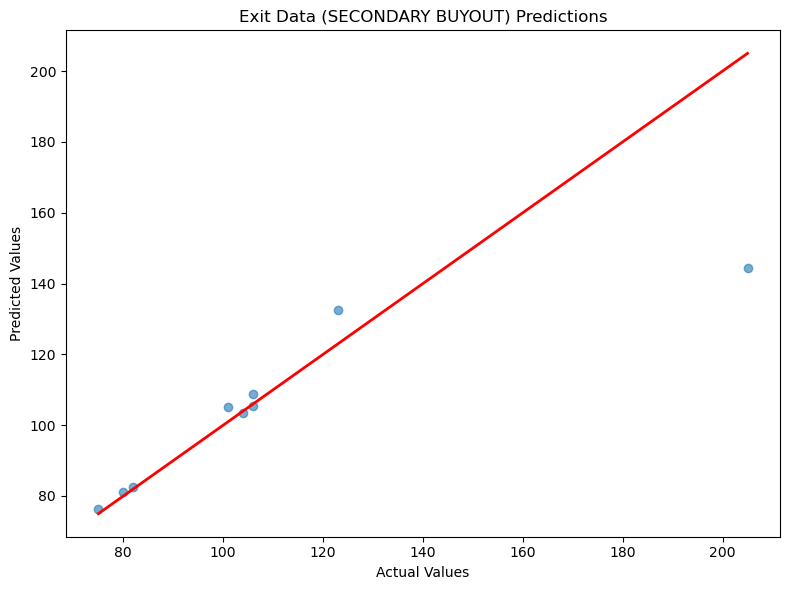

Modeling Exit Data (SALE TO MANAGEMENT) with Random Forest...
RMSE: 1.45, R²: 0.26
Feature Importances:
                                           Feature  Importance
3          LBO Data (NUMBER OF DEALS (aggregated))    0.375661
4          SBO Data (NUMBER OF DEALS (aggregated))    0.243893
1  Fundraising (AGGREGATE CAPITAL RAISED (USD BN))    0.162288
0                       Dry Powder (NORTH AMERICA)    0.125454
2                             Interest Rate (Rate)    0.092704


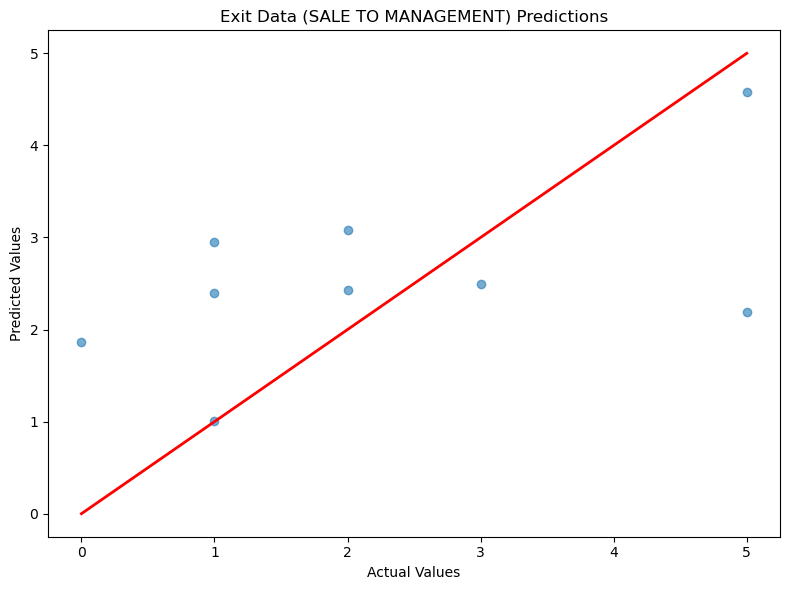

Modeling Exit Data (BANKRUPTCY/WRITE-OFF) with Random Forest...
RMSE: 5.53, R²: -0.80
Feature Importances:
                                           Feature  Importance
2                             Interest Rate (Rate)    0.507637
4          SBO Data (NUMBER OF DEALS (aggregated))    0.183090
1  Fundraising (AGGREGATE CAPITAL RAISED (USD BN))    0.137547
0                       Dry Powder (NORTH AMERICA)    0.092517
3          LBO Data (NUMBER OF DEALS (aggregated))    0.079209


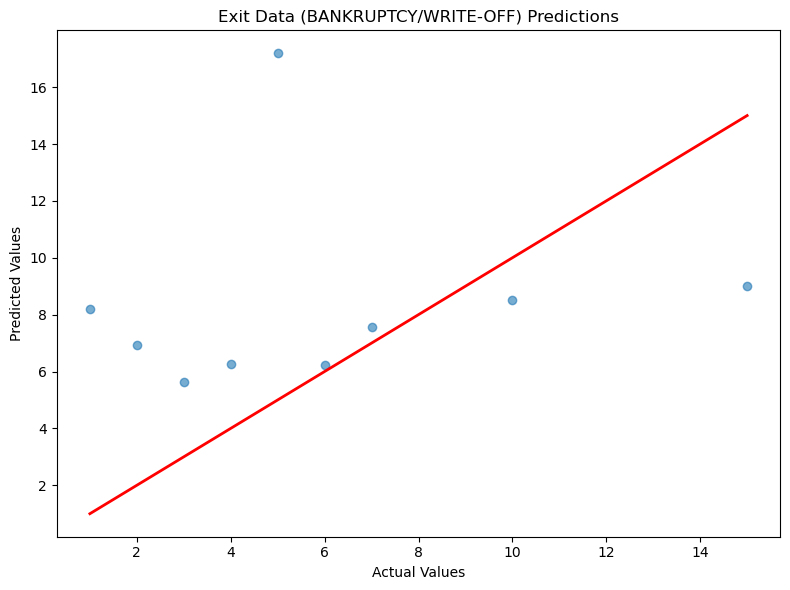

Modeling Exit Data (PRIVATE PLACEMENT/FOLLOW ON) with Random Forest...
RMSE: 8.95, R²: -0.45
Feature Importances:
                                           Feature  Importance
1  Fundraising (AGGREGATE CAPITAL RAISED (USD BN))    0.352706
2                             Interest Rate (Rate)    0.238040
3          LBO Data (NUMBER OF DEALS (aggregated))    0.218422
0                       Dry Powder (NORTH AMERICA)    0.107064
4          SBO Data (NUMBER OF DEALS (aggregated))    0.083769


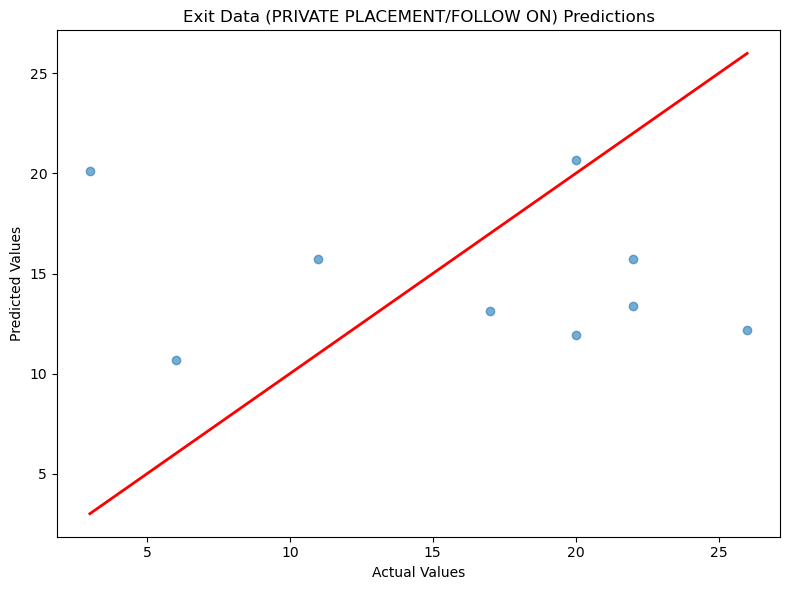

Modeling Exit Data (UNSPECIFIED EXIT) with Random Forest...
RMSE: 8.77, R²: -0.48
Feature Importances:
                                           Feature  Importance
3          LBO Data (NUMBER OF DEALS (aggregated))    0.605449
0                       Dry Powder (NORTH AMERICA)    0.161508
4          SBO Data (NUMBER OF DEALS (aggregated))    0.117411
2                             Interest Rate (Rate)    0.063569
1  Fundraising (AGGREGATE CAPITAL RAISED (USD BN))    0.052062


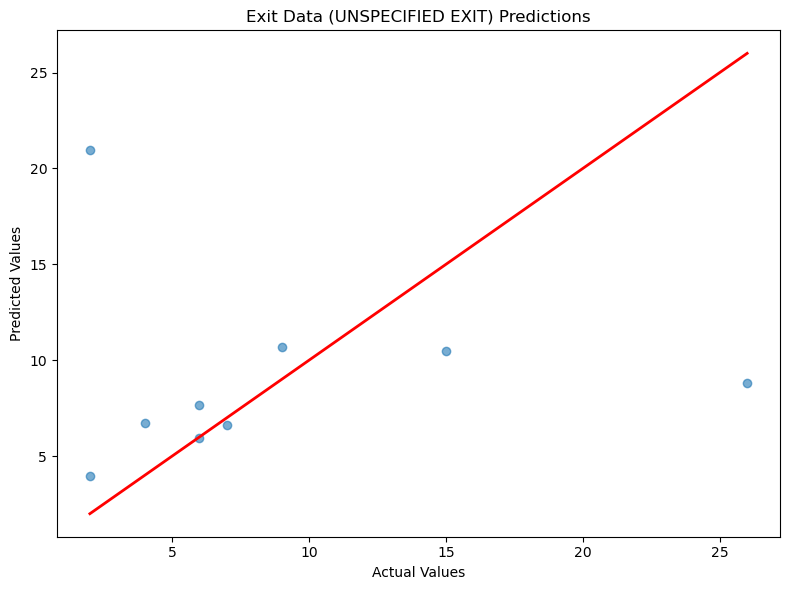

Summary of Model Performance:
Exit Data (IPO) - RMSE: 5.98, R²: -0.61
Exit Data (TRADE SALE) - RMSE: 28.63, R²: 0.01
Exit Data (SECONDARY BUYOUT) - RMSE: 20.53, R²: 0.69
Exit Data (SALE TO MANAGEMENT) - RMSE: 1.45, R²: 0.26
Exit Data (BANKRUPTCY/WRITE-OFF) - RMSE: 5.53, R²: -0.80
Exit Data (PRIVATE PLACEMENT/FOLLOW ON) - RMSE: 8.95, R²: -0.45
Exit Data (UNSPECIFIED EXIT) - RMSE: 8.77, R²: -0.48


In [12]:
'''Reference: use ML model: Random Forest Regressor: FAILED
Adequate: Sale to management, SBO
Inadequate: IPO, Trade Sale, Bankruptcy/Write off, Private Placement, Unspecified'''
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import os
import numpy as np

# Define paths
desktop_path = os.path.join(os.path.expanduser("~"), 'Desktop')
final_project_folder = os.path.join(desktop_path, 'Final Project')
merged_file_path = os.path.join(final_project_folder, 'Merged_Data_Sorted_Cleaned.xlsx')

# Load the merged data
data = pd.read_excel(merged_file_path)

def convert_quarter_to_datetime(quarter):
    year = int(quarter.split(' ')[1])
    quarter_num = int(quarter.split(' ')[0][-1])
    month = {1: 1, 2: 4, 3: 7, 4: 10}[quarter_num]
    return pd.Timestamp(year=year, month=month, day=1)

data['DATE'] = data['DATE'].apply(convert_quarter_to_datetime)
data.set_index('DATE', inplace=True)
data = data.sort_index()

numeric_cols = data.columns.difference(['DATE'])
data[numeric_cols] = data[numeric_cols].replace("-", 0).apply(pd.to_numeric, errors='coerce')
data[numeric_cols] = data[numeric_cols].fillna(0)

# Define exit strategies and exogenous variables
exit_strategies = [
    'Exit Data (IPO)',
    'Exit Data (TRADE SALE)',
    'Exit Data (SECONDARY BUYOUT)',
    'Exit Data (SALE TO MANAGEMENT)',
    'Exit Data (BANKRUPTCY/WRITE-OFF)',
    'Exit Data (PRIVATE PLACEMENT/FOLLOW ON)',
    'Exit Data (UNSPECIFIED EXIT)'
]

exogenous_variables = [
    'Dry Powder (NORTH AMERICA)',
    'Fundraising (AGGREGATE CAPITAL RAISED (USD BN))',
    'Interest Rate (Rate)',
    'LBO Data (NUMBER OF DEALS (aggregated))',
    'SBO Data (NUMBER OF DEALS (aggregated))'
]

results = {}
for target in exit_strategies:
    print(f"Modeling {target} with Random Forest...")
    
    # Prepare data
    X = data[exogenous_variables]
    y = data[target]
    
    # Split into train-test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    # Initialize and train the model
    model = RandomForestRegressor(n_estimators=200, max_depth=5, random_state=42)
    model.fit(X_train, y_train)
    
    # Predict
    y_pred = model.predict(X_test)
    
    # Evaluate
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    print(f"RMSE: {rmse:.2f}, R²: {r2:.2f}")
    
    # Store results
    results[target] = {'model': model, 'rmse': rmse, 'r2': r2}
    
    # Feature Importance
    feature_importance = pd.DataFrame({
        'Feature': X_train.columns,
        'Importance': model.feature_importances_
    }).sort_values(by='Importance', ascending=False)
    
    print("Feature Importances:")
    print(feature_importance)
    
    # Plot Predictions vs Actual
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test, y_pred, alpha=0.6)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linewidth=2)
    plt.title(f"{target} Predictions")
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.tight_layout()
    plt.show()

# Summarize Results
print("Summary of Model Performance:")
for target, metrics in results.items():
    print(f"{target} - RMSE: {metrics['rmse']:.2f}, R²: {metrics['r2']:.2f}")
